# Pix2Pix-Zero

Given an input image, we first **generate text captions** using BLIP and apply regularized DDIM inversion to obtain our inverted noise map. Then, we obtain reference cross-attention maps that correspoind to the structure of the input image by denoising, guided with the CLIP embeddings of our generated text (c). Next, we denoise with edited text embeddings, while enforcing a loss to match current cross-attention maps with the reference cross-attention maps.

This notebook evaluates pix2pix model on PIE-Bench for
- SSIM
- LPIPS
- CLIP Similarity on the target prompt with the target image

In [ ]:
# mount google drive
import os
from google.colab import drive
drive.mount('/content/drive')
dir_path = '/content/drive/MyDrive/ESE645'
os.chdir(dir_path)
!ls

Mounted at /content/drive
baseline_eval.ipynb  frank.png		    PIE-Bench_v1
evaluate.py	     matrics_calculator.py  pie_results_pix2pix_zero


Generate Image with Pix2Pix Model

In [ ]:
import torch

if torch.cuda.is_available():
    print("GPU is available!")
    print(f"Number of GPUs: {torch.cuda.device_count()}")
    print(f"GPU Name: {torch.cuda.get_device_name(0)}")
else:
    print("GPU is not available.")


GPU is available!
Number of GPUs: 1
GPU Name: Tesla T4


## Real Image Editing

**Given an source image and a text prompt, modify the image**

This code is modified from the HuggingFace pipeline of Pix2Pix-Zero by Frank

1. Loads a Stable Diffusion Pix2Pix Zero pipeline and its captioning model (BLIP).
2. Takes an input image, generates a caption with BLIP.
3. Inverts the image into the latent space using the DDIMInverseScheduler.
4. Uses a language model (Flan-T5) to automatically generate multiple source and target captions based on provided source_concept and target_concept.
5. Computes embeddings for these generated captions.
6. Uses these embeddings to guide the image editing process, transforming the source concept in the image into the target concept.

In [ ]:
import torch
from transformers import BlipForConditionalGeneration, BlipProcessor, AutoTokenizer, T5ForConditionalGeneration
from diffusers import (
    DDIMScheduler,
    DDIMInverseScheduler,
    StableDiffusionPix2PixZeroPipeline
)
from diffusers.utils import load_image

########################################
# Step 1: Load the Pix2Pix Zero Pipeline and Captioning Model and Caption Generation Model
########################################

# BLIP captioning model
captioner_id = "Salesforce/blip-image-captioning-base"
processor = BlipProcessor.from_pretrained(captioner_id)
caption_model = BlipForConditionalGeneration.from_pretrained(
    captioner_id, torch_dtype=torch.float16, low_cpu_mem_usage=True
)

# Stable Diffusion Pix2Pix Zero
sd_model_ckpt = "CompVis/stable-diffusion-v1-4"
pipeline = StableDiffusionPix2PixZeroPipeline.from_pretrained(
    sd_model_ckpt,
    caption_generator=caption_model,
    caption_processor=processor,
    torch_dtype=torch.float16,
    safety_checker=None,
)
pipeline.scheduler = DDIMScheduler.from_config(pipeline.scheduler.config)
pipeline.inverse_scheduler = DDIMInverseScheduler.from_config(pipeline.scheduler.config)
pipeline.enable_model_cpu_offload()

# Load Flan-T5 for caption generation
flan_tokenizer = AutoTokenizer.from_pretrained("google/flan-t5-xl")
flan_model = T5ForConditionalGeneration.from_pretrained("google/flan-t5-xl", device_map="auto", torch_dtype=torch.float16)

def generate_captions(input_prompt, num_return_sequences=8):
    input_ids = flan_tokenizer(input_prompt, return_tensors="pt").input_ids.to("cuda")
    outputs = flan_model.generate(
        input_ids,
        temperature=0.8,
        num_return_sequences=num_return_sequences,
        do_sample=True,
        max_new_tokens=128,
        top_k=10
    )
    return flan_tokenizer.batch_decode(outputs, skip_special_tokens=True)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 14 files:   0%|          | 0/14 [00:00<?, ?it/s]

(…)kpoints/scheduler_config-checkpoint.json:   0%|          | 0.00/209 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/990M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.deprecated.stable_diffusion_variants.pipeline_stable_diffusion_pix2pix_zero.StableDiffusionPix2PixZeroPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .
The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


tokenizer_config.json:   0%|          | 0.00/2.54k [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.42M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/2.20k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.44k [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/53.0k [00:00<?, ?B/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/9.45G [00:00<?, ?B/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/1.95G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/147 [00:00<?, ?B/s]

Generated caption for the image: a photography of a young man with a black hair


  0%|          | 0/50 [00:00<?, ?it/s]

Generated source captions:
- The man in the red shirt has been a member of a team which competed at the World Championships in the field of sports shooting.
- a man with a tattered t-shirt
- The first picture is of a male standing with a woman.
- i.e. if a lone male is seen in a group of women, he should not be regarded as male in that group
- A man is sitting on a bench.
- The image was shot by the photographer and is available for use by journalists.
- The man is wearing a suit and tie.
- The man, who is dressed in a grey shirt and white trousers, is a member of the RAF.

Generated target captions:
- A man smiling on a beach.
- Male smiling
- Images containing a smiling male.
- Men smiling at camera, posing for the camera
- Men in a suit and tie are smiling in the street
- a tan male smiling with an image of a giraffe on it
- The man is smiling and he is talking to someone on the phone.
- A young man smiling in the street.


Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

safety_checker/config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

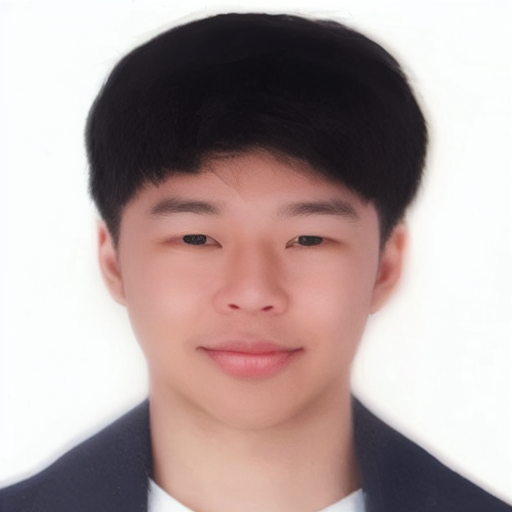

In [ ]:
########################################
# Step 2: Provide Input Image and Generate Caption
########################################

# Replace with your own image URL or local path
# img_url = "https://github.com/pix2pixzero/pix2pix-zero/raw/main/assets/test_images/cats/cat_6.png"
img_url = "/content/drive/MyDrive/ESE645/frank.png"
raw_image = load_image(img_url).resize((512, 512))

# Generate a caption for the input image
caption = pipeline.generate_caption(raw_image)
print("Generated caption for the image:", caption)

########################################
# Step 3: Invert the Image into Latent Space
########################################

generator = torch.manual_seed(0)
inv_latents = pipeline.invert(caption, image=raw_image, generator=generator).latents

########################################
# Step 4: Define Source and Target Concepts
########################################

# For example, we want to transform a "cat" into a "dog"
source_concept = "male"
target_concept = "smiling male"

########################################
# Step 5: Use Flan-T5 to Generate Source and Target Captions Automatically
########################################

# Define prompts for source and target concept caption generation
source_text = (
    f"Provide a caption for images containing a {source_concept}. "
    "The captions should be in English and should be no longer than 150 characters."
)
target_text = (
    f"Provide a caption for images containing a {target_concept}. "
    "The captions should be in English and should be no longer than 150 characters."
)

source_captions = generate_captions(source_text)
target_captions = generate_captions(target_text)

print("Generated source captions:")
for c in source_captions:
    print("-", c)
print("\nGenerated target captions:")
for c in target_captions:
    print("-", c)

########################################
# Step 6: Compute Embeddings of Generated Captions
########################################

# Re-initialize the pipeline on GPU for embedding extraction if needed
pipeline_for_emb = StableDiffusionPix2PixZeroPipeline.from_pretrained(
    sd_model_ckpt, torch_dtype=torch.float16
).to("cuda")

tokenizer = pipeline_for_emb.tokenizer
text_encoder = pipeline_for_emb.text_encoder

source_embeddings = pipeline_for_emb.get_embeds(source_captions, batch_size=2)
target_embeddings = pipeline_for_emb.get_embeds(target_captions, batch_size=2)

########################################
# Step 7: Perform the Image Editing
########################################

# We now run the pipeline using:
# - The original caption for initialization
# - The inverted latents (inv_latents)
# - The source and target embeddings for editing
# - Some inference steps and cross_attention_guidance_amount

pipeline_for_emb.scheduler = DDIMScheduler.from_config(pipeline.scheduler.config)

edited_image = pipeline_for_emb(
    caption,
    source_embeds=source_embeddings,
    target_embeds=target_embeddings,
    num_inference_steps=50,
    cross_attention_guidance_amount=0.15,
    generator=generator,
    latents=inv_latents,
    negative_prompt=caption,
).images[0]

########################################
# Step 8: Display or Save the Result
########################################

edited_image.save("edited_image.png")
edited_image


## Baseline Evaluation

**SSIM (Structural Similarity Index Measure):**

The SSIM score is a classical image quality metric designed to measure the similarity between two images. Instead of comparing images at a simple pixel-by-pixel level (like mean squared error), SSIM assesses the structural information within the images. It considers luminance (brightness), contrast, and structural patterns. A higher SSIM value (close to 1.0) indicates that the two images share very similar structures, textures, and overall visual composition. In image editing or transformation tasks, a high SSIM score between the edited (or generated) image and the reference (target) image suggests that the edit preserves essential structural details and spatial arrangements.

**LPIPS (Learned Perceptual Image Patch Similarity):**

LPIPS is a metric that uses a deep neural network (often a pretrained perceptual model) to evaluate the perceptual similarity between two images. Unlike SSIM, which relies on hand-crafted similarity functions, LPIPS compares intermediate feature representations extracted from neural networks trained on large image datasets. This makes LPIPS better aligned with human perception. A lower LPIPS score means that the generated image looks more perceptually similar to the reference image according to the model’s learned notion of human-like vision. Thus, a low LPIPS score is desirable if you want your edited image to appear visually close to the target image in a way that humans would perceive as similar.

**CLIP Similarity on the Target Prompt with the Target Image:**

CLIP is a model trained to understand images and text in a shared embedding space. It can measure how well the content of an image aligns with a given text prompt. When you compute the CLIP similarity between a target prompt (a textual description) and a target image, you’re essentially asking: How well does this image reflect the content described by the prompt? A higher CLIP similarity score means the image’s semantic content, as “understood” by CLIP, closely matches the concepts, objects, and attributes described in the text. In an image editing context, if you have a target prompt (e.g., “a photo of a red car on a sunny street”) and your edited image is supposed to reflect that description, a high CLIP similarity score indicates that the image editing process has successfully produced an image that aligns with the target prompt’s meaning.

SSIM: Closer to 1 is better (more structurally similar).

LPIPS: Closer to 0 is better (more perceptually similar).

CLIP Similarity: Higher is better (image content more closely matches the text description).

In [ ]:
!pip install torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 926.4/926.4 kB 15.5 MB/s eta 0:00:00


In [ ]:
# Pix2Pix-Zero Evaluation on PIE-Bench Dataset

### Import Required Libraries
import os
import json
import numpy as np
from PIL import Image
from transformers import BlipForConditionalGeneration, BlipProcessor
from diffusers import (
    DDIMScheduler,
    DDIMInverseScheduler,
    StableDiffusionPix2PixZeroPipeline
)
from diffusers.utils import load_image
import torch
from matrics_calculator import MetricsCalculator

# Define mask decoding function
def mask_decode(encoded_mask, image_shape=(512, 512)):
    mask = np.zeros(image_shape[0] * image_shape[1], dtype=np.uint8)
    for i in range(0, len(encoded_mask), 2):
        start = encoded_mask[i]
        length = encoded_mask[i + 1]
        mask[start:start + length] = 1
    return mask.reshape(image_shape)

########################################
# Step 1: Load the Pix2Pix Zero Pipeline
########################################

# BLIP captioning model
captioner_id = "Salesforce/blip-image-captioning-base"
processor = BlipProcessor.from_pretrained(captioner_id)
caption_model = BlipForConditionalGeneration.from_pretrained(
    captioner_id, torch_dtype=torch.float16, low_cpu_mem_usage=True
)

# Stable Diffusion Pix2Pix Zero
sd_model_ckpt = "CompVis/stable-diffusion-v1-4"
pipeline = StableDiffusionPix2PixZeroPipeline.from_pretrained(
    sd_model_ckpt,
    caption_generator=caption_model,
    caption_processor=processor,
    torch_dtype=torch.float16,
    safety_checker=None,
)
pipeline.scheduler = DDIMScheduler.from_config(pipeline.scheduler.config)
pipeline.inverse_scheduler = DDIMInverseScheduler.from_config(pipeline.scheduler.config)
pipeline.enable_model_cpu_offload()

########################################
# Step 2: PIE-Bench Dataset Setup
########################################

# Load PIE-Bench metadata
pie_bench_path = "PIE-Bench_v1"
annotation_images_path = os.path.join(pie_bench_path, "annotation_images")
mapping_file = os.path.join(pie_bench_path, "mapping_file.json")

with open(mapping_file, "r") as f:
    metadata = json.load(f)

########################################
# Step 3: Initialize Metrics Calculator
########################################

metrics_calculator = MetricsCalculator(device="cuda")


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.deprecated.stable_diffusion_variants.pipeline_stable_diffusion_pix2pix_zero.StableDiffusionPix2PixZeroPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .
The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.
/usr/local/lib/python3.10/dist-packages/torchmetrics/functional/image/lpips.py:323: FutureWarning: You are using `tor

In [ ]:
########################################
# Step 4: Perform Evaluation
########################################

results = []
total_graphs = len(metadata)
print(f"Total number of graphs to evaluate: {total_graphs}")

for idx, (image_id, data) in enumerate(metadata.items(), start=1):
    # Perform evaluation logic...
    print(f"Processing graph {idx}/{total_graphs} (ID: {image_id})")
    source_image_path = os.path.join(annotation_images_path, data["image_path"])
    original_prompt = data["original_prompt"]
    editing_prompt = data["editing_prompt"]
    mask_encoded = data["mask"]

    # Decode mask
    mask = mask_decode(mask_encoded).astype(np.uint8)

    # Load source image
    raw_image = load_image(source_image_path).resize((512, 512))

    # Use original and editing prompts directly as captions
    source_captions = [original_prompt]
    target_captions = [editing_prompt]

    # Compute embeddings
    source_embeddings = pipeline.get_embeds(source_captions, batch_size=2)
    target_embeddings = pipeline.get_embeds(target_captions, batch_size=2)

    # Invert the source image
    inv_latents = pipeline.invert(original_prompt, image=raw_image).latents

    # Perform editing
    edited_image = pipeline(
        original_prompt,
        source_embeds=source_embeddings,
        target_embeds=target_embeddings,
        num_inference_steps=50,
        cross_attention_guidance_amount=0.15,
        generator=torch.manual_seed(0),
        latents=inv_latents,
        negative_prompt=original_prompt,
    ).images[0]

    # Evaluate metrics
    ssim = metrics_calculator.calculate_ssim(raw_image, edited_image, None, None)
    lpips = metrics_calculator.calculate_lpips(raw_image, edited_image, None, None)
    clip_similarity_target = metrics_calculator.calculate_clip_similarity(edited_image, editing_prompt, None)

    # Store results
    tmp = {
        "image_id": image_id,
        "ssim": ssim,
        "lpips": lpips,
        "clip_similarity_target": clip_similarity_target
    }
    print(tmp)
    results.append(tmp)

    # Save intermediate results every 100 graphs
    if idx % 100 == 0 or idx == total_graphs:
        partial_results_file = f"pie_bench_results_partial_{idx}.json"
        with open(partial_results_file, "w") as f:
            json.dump(results, f, indent=4)
        print(f"Saved progress at graph {idx} to {partial_results_file}")

########################################
# Step 5: Save Results
########################################

results_file = "pie_bench_results.json"
with open(results_file, "w") as f:
    json.dump(results, f, indent=4)

print(f"Evaluation complete. Results saved to {results_file}.")

Total number of graphs to evaluate: 700
Processing graph 1/700 (ID: 000000000000)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000000', 'ssim': 0.7044757604598999, 'lpips': 0.13667115569114685, 'clip_similarity_target': 27.36107063293457}
Processing graph 2/700 (ID: 000000000001)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000001', 'ssim': 0.651005744934082, 'lpips': 0.16865909099578857, 'clip_similarity_target': 27.003860473632812}
Processing graph 3/700 (ID: 000000000002)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000002', 'ssim': 0.6962229609489441, 'lpips': 0.2500953674316406, 'clip_similarity_target': 25.68738555908203}
Processing graph 4/700 (ID: 000000000003)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000003', 'ssim': 0.5988724231719971, 'lpips': 0.20825059711933136, 'clip_similarity_target': 27.86422348022461}
Processing graph 5/700 (ID: 000000000004)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000004', 'ssim': 0.5732936263084412, 'lpips': 0.2826591730117798, 'clip_similarity_target': 30.76092529296875}
Processing graph 6/700 (ID: 000000000005)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000005', 'ssim': 0.7926907539367676, 'lpips': 0.20179183781147003, 'clip_similarity_target': 23.756309509277344}
Processing graph 7/700 (ID: 000000000006)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000006', 'ssim': 0.836749255657196, 'lpips': 0.1151844710111618, 'clip_similarity_target': 32.0306510925293}
Processing graph 8/700 (ID: 000000000007)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000007', 'ssim': 0.578019917011261, 'lpips': 0.09700417518615723, 'clip_similarity_target': 27.99901580810547}
Processing graph 9/700 (ID: 000000000008)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000008', 'ssim': 0.8388137817382812, 'lpips': 0.10774985700845718, 'clip_similarity_target': 28.162109375}
Processing graph 10/700 (ID: 000000000009)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000009', 'ssim': 0.6468154788017273, 'lpips': 0.39552921056747437, 'clip_similarity_target': 22.177705764770508}
Processing graph 11/700 (ID: 000000000010)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000010', 'ssim': 0.6676502227783203, 'lpips': 0.23776404559612274, 'clip_similarity_target': 27.885177612304688}
Processing graph 12/700 (ID: 000000000011)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000011', 'ssim': 0.8204015493392944, 'lpips': 0.1240495815873146, 'clip_similarity_target': 26.72441864013672}
Processing graph 13/700 (ID: 000000000012)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000012', 'ssim': 0.49156102538108826, 'lpips': 0.3427743911743164, 'clip_similarity_target': 23.617637634277344}
Processing graph 14/700 (ID: 000000000013)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000013', 'ssim': 0.7970718145370483, 'lpips': 0.13611860573291779, 'clip_similarity_target': 22.417644500732422}
Processing graph 15/700 (ID: 000000000014)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000014', 'ssim': 0.9254970550537109, 'lpips': 0.04201658070087433, 'clip_similarity_target': 19.579574584960938}
Processing graph 16/700 (ID: 000000000015)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000015', 'ssim': 0.8279275894165039, 'lpips': 0.11397536844015121, 'clip_similarity_target': 23.232404708862305}
Processing graph 17/700 (ID: 000000000016)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000016', 'ssim': 0.8456020355224609, 'lpips': 0.09826358407735825, 'clip_similarity_target': 24.039165496826172}
Processing graph 18/700 (ID: 000000000017)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000017', 'ssim': 0.5404314994812012, 'lpips': 0.3228180408477783, 'clip_similarity_target': 20.365745544433594}
Processing graph 19/700 (ID: 000000000018)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000018', 'ssim': 0.8010656237602234, 'lpips': 0.09113622456789017, 'clip_similarity_target': 27.562379837036133}
Processing graph 20/700 (ID: 000000000019)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000019', 'ssim': 0.40335482358932495, 'lpips': 0.3783351480960846, 'clip_similarity_target': 25.47661590576172}
Processing graph 21/700 (ID: 000000000020)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000020', 'ssim': 0.6561189889907837, 'lpips': 0.317912757396698, 'clip_similarity_target': 28.739261627197266}
Processing graph 22/700 (ID: 000000000021)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000021', 'ssim': 0.7958592176437378, 'lpips': 0.1158156543970108, 'clip_similarity_target': 28.45729637145996}
Processing graph 23/700 (ID: 000000000022)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000022', 'ssim': 0.5141158103942871, 'lpips': 0.2744060158729553, 'clip_similarity_target': 24.199243545532227}
Processing graph 24/700 (ID: 000000000023)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000023', 'ssim': 0.5698296427726746, 'lpips': 0.12567046284675598, 'clip_similarity_target': 28.90329360961914}
Processing graph 25/700 (ID: 000000000024)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000024', 'ssim': 0.5026397705078125, 'lpips': 0.13659046590328217, 'clip_similarity_target': 27.132898330688477}
Processing graph 26/700 (ID: 000000000025)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000025', 'ssim': 0.5567150115966797, 'lpips': 0.4480569660663605, 'clip_similarity_target': 23.02730369567871}
Processing graph 27/700 (ID: 000000000026)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000026', 'ssim': 0.737373948097229, 'lpips': 0.2662356197834015, 'clip_similarity_target': 30.1539306640625}
Processing graph 28/700 (ID: 000000000027)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000027', 'ssim': 0.6312346458435059, 'lpips': 0.0763583853840828, 'clip_similarity_target': 17.7282772064209}
Processing graph 29/700 (ID: 000000000028)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000028', 'ssim': 0.8245657682418823, 'lpips': 0.19772326946258545, 'clip_similarity_target': 24.633060455322266}
Processing graph 30/700 (ID: 000000000029)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000029', 'ssim': 0.720056414604187, 'lpips': 0.20566155016422272, 'clip_similarity_target': 24.583911895751953}
Processing graph 31/700 (ID: 000000000030)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000030', 'ssim': 0.32900410890579224, 'lpips': 0.2897859811782837, 'clip_similarity_target': 25.26235580444336}
Processing graph 32/700 (ID: 000000000031)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000031', 'ssim': 0.7620429992675781, 'lpips': 0.24222008883953094, 'clip_similarity_target': 26.245525360107422}
Processing graph 33/700 (ID: 000000000032)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000032', 'ssim': 0.7675279974937439, 'lpips': 0.11833232641220093, 'clip_similarity_target': 23.637863159179688}
Processing graph 34/700 (ID: 000000000033)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000033', 'ssim': 0.8887822031974792, 'lpips': 0.09907209128141403, 'clip_similarity_target': 31.735456466674805}
Processing graph 35/700 (ID: 000000000034)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000034', 'ssim': 0.28824466466903687, 'lpips': 0.34195399284362793, 'clip_similarity_target': 28.649585723876953}
Processing graph 36/700 (ID: 000000000035)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000035', 'ssim': 0.3762015700340271, 'lpips': 0.30519333481788635, 'clip_similarity_target': 22.50794219970703}
Processing graph 37/700 (ID: 000000000036)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000036', 'ssim': 0.5693371891975403, 'lpips': 0.36499783396720886, 'clip_similarity_target': 20.4304256439209}
Processing graph 38/700 (ID: 000000000037)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000037', 'ssim': 0.6160865426063538, 'lpips': 0.11468398571014404, 'clip_similarity_target': 23.640390396118164}
Processing graph 39/700 (ID: 000000000038)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000038', 'ssim': 0.8387734293937683, 'lpips': 0.042406048625707626, 'clip_similarity_target': 27.295536041259766}
Processing graph 40/700 (ID: 000000000039)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000039', 'ssim': 0.3907098174095154, 'lpips': 0.3094138503074646, 'clip_similarity_target': 24.84480857849121}
Processing graph 41/700 (ID: 000000000040)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000040', 'ssim': 0.7793958187103271, 'lpips': 0.0956834927201271, 'clip_similarity_target': 30.312320709228516}
Processing graph 42/700 (ID: 000000000041)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000041', 'ssim': 0.37649011611938477, 'lpips': 0.1190330982208252, 'clip_similarity_target': 23.73138427734375}
Processing graph 43/700 (ID: 000000000042)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000042', 'ssim': 0.784788966178894, 'lpips': 0.15194456279277802, 'clip_similarity_target': 29.719907760620117}
Processing graph 44/700 (ID: 000000000043)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000043', 'ssim': 0.75616854429245, 'lpips': 0.09258764982223511, 'clip_similarity_target': 25.872272491455078}
Processing graph 45/700 (ID: 000000000044)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000044', 'ssim': 0.4662724733352661, 'lpips': 0.27297431230545044, 'clip_similarity_target': 25.086711883544922}
Processing graph 46/700 (ID: 000000000045)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000045', 'ssim': 0.810431182384491, 'lpips': 0.11730016767978668, 'clip_similarity_target': 25.64868927001953}
Processing graph 47/700 (ID: 000000000046)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000046', 'ssim': 0.8709678649902344, 'lpips': 0.17983195185661316, 'clip_similarity_target': 22.21962547302246}
Processing graph 48/700 (ID: 000000000047)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000047', 'ssim': 0.45613086223602295, 'lpips': 0.14775705337524414, 'clip_similarity_target': 23.075458526611328}
Processing graph 49/700 (ID: 000000000048)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000048', 'ssim': 0.8994921445846558, 'lpips': 0.07226818799972534, 'clip_similarity_target': 19.17732048034668}
Processing graph 50/700 (ID: 000000000049)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000049', 'ssim': 0.8133106231689453, 'lpips': 0.11913619935512543, 'clip_similarity_target': 22.89400863647461}
Processing graph 51/700 (ID: 000000000050)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000050', 'ssim': 0.5696265697479248, 'lpips': 0.37721502780914307, 'clip_similarity_target': 27.395469665527344}
Processing graph 52/700 (ID: 000000000051)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000051', 'ssim': 0.5986338257789612, 'lpips': 0.22917884588241577, 'clip_similarity_target': 29.89661407470703}
Processing graph 53/700 (ID: 000000000052)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000052', 'ssim': 0.8556078672409058, 'lpips': 0.1183890849351883, 'clip_similarity_target': 24.08311653137207}
Processing graph 54/700 (ID: 000000000053)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000053', 'ssim': 0.6566517353057861, 'lpips': 0.08190647512674332, 'clip_similarity_target': 22.570880889892578}
Processing graph 55/700 (ID: 000000000054)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000054', 'ssim': 0.5098581910133362, 'lpips': 0.41458022594451904, 'clip_similarity_target': 26.149993896484375}
Processing graph 56/700 (ID: 000000000055)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000055', 'ssim': 0.622620701789856, 'lpips': 0.26271289587020874, 'clip_similarity_target': 29.73390007019043}
Processing graph 57/700 (ID: 000000000056)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000056', 'ssim': 0.5306921601295471, 'lpips': 0.20202787220478058, 'clip_similarity_target': 26.231258392333984}
Processing graph 58/700 (ID: 000000000057)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000057', 'ssim': 0.6947523355484009, 'lpips': 0.09061385691165924, 'clip_similarity_target': 23.288021087646484}
Processing graph 59/700 (ID: 000000000058)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000058', 'ssim': 0.40813741087913513, 'lpips': 0.21128444373607635, 'clip_similarity_target': 26.519588470458984}
Processing graph 60/700 (ID: 000000000059)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000059', 'ssim': 0.8352450132369995, 'lpips': 0.09497372061014175, 'clip_similarity_target': 26.109355926513672}
Processing graph 61/700 (ID: 000000000060)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000060', 'ssim': 0.8424110412597656, 'lpips': 0.1551261842250824, 'clip_similarity_target': 25.268733978271484}
Processing graph 62/700 (ID: 000000000061)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000061', 'ssim': 0.4010656774044037, 'lpips': 0.14436501264572144, 'clip_similarity_target': 25.376712799072266}
Processing graph 63/700 (ID: 000000000062)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000062', 'ssim': 0.7137608528137207, 'lpips': 0.18048207461833954, 'clip_similarity_target': 27.61461639404297}
Processing graph 64/700 (ID: 000000000063)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000063', 'ssim': 0.7867703437805176, 'lpips': 0.08583828806877136, 'clip_similarity_target': 27.082855224609375}
Processing graph 65/700 (ID: 000000000064)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000064', 'ssim': 0.34536314010620117, 'lpips': 0.33552610874176025, 'clip_similarity_target': 24.93630599975586}
Processing graph 66/700 (ID: 000000000065)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000065', 'ssim': 0.7947184443473816, 'lpips': 0.10095413029193878, 'clip_similarity_target': 23.39243507385254}
Processing graph 67/700 (ID: 000000000066)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000066', 'ssim': 0.6108334064483643, 'lpips': 0.35992124676704407, 'clip_similarity_target': 32.25303268432617}
Processing graph 68/700 (ID: 000000000067)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000067', 'ssim': 0.5370691418647766, 'lpips': 0.29155319929122925, 'clip_similarity_target': 23.955350875854492}
Processing graph 69/700 (ID: 000000000068)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000068', 'ssim': 0.7164170145988464, 'lpips': 0.28196924924850464, 'clip_similarity_target': 25.88393783569336}
Processing graph 70/700 (ID: 000000000069)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000069', 'ssim': 0.507820725440979, 'lpips': 0.30980315804481506, 'clip_similarity_target': 29.112794876098633}
Processing graph 71/700 (ID: 000000000070)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000070', 'ssim': 0.8934781551361084, 'lpips': 0.035722516477108, 'clip_similarity_target': 27.883848190307617}
Processing graph 72/700 (ID: 000000000071)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000071', 'ssim': 0.8604893684387207, 'lpips': 0.1614305078983307, 'clip_similarity_target': 26.20032501220703}
Processing graph 73/700 (ID: 000000000072)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000072', 'ssim': 0.7537121772766113, 'lpips': 0.15922145545482635, 'clip_similarity_target': 29.901933670043945}
Processing graph 74/700 (ID: 000000000073)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000073', 'ssim': 0.7025518417358398, 'lpips': 0.14962242543697357, 'clip_similarity_target': 26.094335556030273}
Processing graph 75/700 (ID: 000000000074)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000074', 'ssim': 0.7403302192687988, 'lpips': 0.17995306849479675, 'clip_similarity_target': 22.954843521118164}
Processing graph 76/700 (ID: 000000000075)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000075', 'ssim': 0.6144172549247742, 'lpips': 0.2694828510284424, 'clip_similarity_target': 20.713502883911133}
Processing graph 77/700 (ID: 000000000076)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000076', 'ssim': 0.780199408531189, 'lpips': 0.12851738929748535, 'clip_similarity_target': 25.87103271484375}
Processing graph 78/700 (ID: 000000000077)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000077', 'ssim': 0.48227089643478394, 'lpips': 0.2267170399427414, 'clip_similarity_target': 34.46131896972656}
Processing graph 79/700 (ID: 000000000078)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000078', 'ssim': 0.5938998460769653, 'lpips': 0.24492798745632172, 'clip_similarity_target': 22.858535766601562}
Processing graph 80/700 (ID: 000000000079)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000079', 'ssim': 0.7310430407524109, 'lpips': 0.16614115238189697, 'clip_similarity_target': 23.866792678833008}
Processing graph 81/700 (ID: 000000000080)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000080', 'ssim': 0.6077731847763062, 'lpips': 0.4009990692138672, 'clip_similarity_target': 31.46398162841797}
Processing graph 82/700 (ID: 000000000081)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000081', 'ssim': 0.6922205686569214, 'lpips': 0.1499597281217575, 'clip_similarity_target': 23.109895706176758}
Processing graph 83/700 (ID: 000000000082)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000082', 'ssim': 0.750512957572937, 'lpips': 0.08386103063821793, 'clip_similarity_target': 27.844684600830078}
Processing graph 84/700 (ID: 000000000083)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000083', 'ssim': 0.888417661190033, 'lpips': 0.22183194756507874, 'clip_similarity_target': 25.61689567565918}
Processing graph 85/700 (ID: 000000000084)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000084', 'ssim': 0.7325825691223145, 'lpips': 0.23381365835666656, 'clip_similarity_target': 31.030166625976562}
Processing graph 86/700 (ID: 000000000085)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000085', 'ssim': 0.7989608645439148, 'lpips': 0.06423521041870117, 'clip_similarity_target': 27.883333206176758}
Processing graph 87/700 (ID: 000000000086)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000086', 'ssim': 0.7798826694488525, 'lpips': 0.22946619987487793, 'clip_similarity_target': 21.46097183227539}
Processing graph 88/700 (ID: 000000000087)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000087', 'ssim': 0.6157338619232178, 'lpips': 0.3869437277317047, 'clip_similarity_target': 27.7811279296875}
Processing graph 89/700 (ID: 000000000088)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000088', 'ssim': 0.3568756580352783, 'lpips': 0.14610251784324646, 'clip_similarity_target': 25.4064998626709}
Processing graph 90/700 (ID: 000000000089)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000089', 'ssim': 0.8956608176231384, 'lpips': 0.09785556048154831, 'clip_similarity_target': 27.781253814697266}
Processing graph 91/700 (ID: 000000000090)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000090', 'ssim': 0.8702213168144226, 'lpips': 0.10873301327228546, 'clip_similarity_target': 25.61463737487793}
Processing graph 92/700 (ID: 000000000091)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000091', 'ssim': 0.5970790386199951, 'lpips': 0.13326039910316467, 'clip_similarity_target': 20.368640899658203}
Processing graph 93/700 (ID: 000000000092)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000092', 'ssim': 0.5560792684555054, 'lpips': 0.24996408820152283, 'clip_similarity_target': 29.50355339050293}
Processing graph 94/700 (ID: 000000000093)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000093', 'ssim': 0.5012855529785156, 'lpips': 0.35467591881752014, 'clip_similarity_target': 21.206687927246094}
Processing graph 95/700 (ID: 000000000094)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000094', 'ssim': 0.606001615524292, 'lpips': 0.22718031704425812, 'clip_similarity_target': 23.507896423339844}
Processing graph 96/700 (ID: 000000000095)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000095', 'ssim': 0.7138867378234863, 'lpips': 0.08557108044624329, 'clip_similarity_target': 27.501386642456055}
Processing graph 97/700 (ID: 000000000096)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000096', 'ssim': 0.7571424245834351, 'lpips': 0.23457597196102142, 'clip_similarity_target': 19.425352096557617}
Processing graph 98/700 (ID: 000000000097)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000097', 'ssim': 0.304337739944458, 'lpips': 0.12613347172737122, 'clip_similarity_target': 26.436372756958008}
Processing graph 99/700 (ID: 000000000098)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000098', 'ssim': 0.767493486404419, 'lpips': 0.1727626919746399, 'clip_similarity_target': 23.612476348876953}
Processing graph 100/700 (ID: 000000000099)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000099', 'ssim': 0.5521005392074585, 'lpips': 0.2979186177253723, 'clip_similarity_target': 26.908897399902344}
Saved progress at graph 100 to pie_bench_results_partial_100.json
Processing graph 101/700 (ID: 000000000100)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000100', 'ssim': 0.7040049433708191, 'lpips': 0.1124424859881401, 'clip_similarity_target': 28.459537506103516}
Processing graph 102/700 (ID: 000000000101)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000101', 'ssim': 0.517478883266449, 'lpips': 0.3730427622795105, 'clip_similarity_target': 22.682231903076172}
Processing graph 103/700 (ID: 000000000102)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000102', 'ssim': 0.6604405045509338, 'lpips': 0.30597445368766785, 'clip_similarity_target': 29.035690307617188}
Processing graph 104/700 (ID: 000000000103)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000103', 'ssim': 0.5033076405525208, 'lpips': 0.1816951483488083, 'clip_similarity_target': 27.963682174682617}
Processing graph 105/700 (ID: 000000000104)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000104', 'ssim': 0.6187788844108582, 'lpips': 0.34268897771835327, 'clip_similarity_target': 26.500865936279297}
Processing graph 106/700 (ID: 000000000105)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000105', 'ssim': 0.49389874935150146, 'lpips': 0.10231569409370422, 'clip_similarity_target': 25.7569522857666}
Processing graph 107/700 (ID: 000000000106)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000106', 'ssim': 0.7146066427230835, 'lpips': 0.28100553154945374, 'clip_similarity_target': 27.41515350341797}
Processing graph 108/700 (ID: 000000000107)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000107', 'ssim': 0.7396818399429321, 'lpips': 0.0773821622133255, 'clip_similarity_target': 23.222410202026367}
Processing graph 109/700 (ID: 000000000108)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000108', 'ssim': 0.6900697946548462, 'lpips': 0.3125190734863281, 'clip_similarity_target': 28.06460189819336}
Processing graph 110/700 (ID: 000000000109)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000109', 'ssim': 0.3811476230621338, 'lpips': 0.15835078060626984, 'clip_similarity_target': 18.62541389465332}
Processing graph 111/700 (ID: 000000000110)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000110', 'ssim': 0.6993448734283447, 'lpips': 0.13840721547603607, 'clip_similarity_target': 27.905263900756836}
Processing graph 112/700 (ID: 000000000111)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000111', 'ssim': 0.5166019201278687, 'lpips': 0.25386103987693787, 'clip_similarity_target': 17.309185028076172}
Processing graph 113/700 (ID: 000000000112)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000112', 'ssim': 0.464152991771698, 'lpips': 0.3055025339126587, 'clip_similarity_target': 30.77490997314453}
Processing graph 114/700 (ID: 000000000113)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000113', 'ssim': 0.5609458684921265, 'lpips': 0.16456398367881775, 'clip_similarity_target': 24.708568572998047}
Processing graph 115/700 (ID: 000000000114)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000114', 'ssim': 0.7813469767570496, 'lpips': 0.21564514935016632, 'clip_similarity_target': 23.634143829345703}
Processing graph 116/700 (ID: 000000000115)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000115', 'ssim': 0.8057867884635925, 'lpips': 0.18741784989833832, 'clip_similarity_target': 23.380348205566406}
Processing graph 117/700 (ID: 000000000116)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000116', 'ssim': 0.7024211287498474, 'lpips': 0.16593137383460999, 'clip_similarity_target': 21.643062591552734}
Processing graph 118/700 (ID: 000000000117)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000117', 'ssim': 0.7465513944625854, 'lpips': 0.20267167687416077, 'clip_similarity_target': 29.101163864135742}
Processing graph 119/700 (ID: 000000000118)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000118', 'ssim': 0.9153754115104675, 'lpips': 0.09381017088890076, 'clip_similarity_target': 24.489330291748047}
Processing graph 120/700 (ID: 000000000119)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000119', 'ssim': 0.7233395576477051, 'lpips': 0.19477374851703644, 'clip_similarity_target': 30.25945472717285}
Processing graph 121/700 (ID: 000000000120)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000120', 'ssim': 0.6620429158210754, 'lpips': 0.25143980979919434, 'clip_similarity_target': 24.902803421020508}
Processing graph 122/700 (ID: 000000000121)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000121', 'ssim': 0.6568212509155273, 'lpips': 0.15469324588775635, 'clip_similarity_target': 29.799577713012695}
Processing graph 123/700 (ID: 000000000122)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000122', 'ssim': 0.70607590675354, 'lpips': 0.2461097091436386, 'clip_similarity_target': 19.230899810791016}
Processing graph 124/700 (ID: 000000000123)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000123', 'ssim': 0.8349485397338867, 'lpips': 0.14025963842868805, 'clip_similarity_target': 24.33088493347168}
Processing graph 125/700 (ID: 000000000124)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000124', 'ssim': 0.5092198252677917, 'lpips': 0.3706027567386627, 'clip_similarity_target': 20.837535858154297}
Processing graph 126/700 (ID: 000000000125)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000125', 'ssim': 0.8081482648849487, 'lpips': 0.07037168741226196, 'clip_similarity_target': 20.988391876220703}
Processing graph 127/700 (ID: 000000000126)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000126', 'ssim': 0.4470221996307373, 'lpips': 0.32359257340431213, 'clip_similarity_target': 21.171184539794922}
Processing graph 128/700 (ID: 000000000127)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000127', 'ssim': 0.6751701235771179, 'lpips': 0.14411991834640503, 'clip_similarity_target': 25.08180809020996}
Processing graph 129/700 (ID: 000000000128)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000128', 'ssim': 0.5682277679443359, 'lpips': 0.11886575073003769, 'clip_similarity_target': 32.493568420410156}
Processing graph 130/700 (ID: 000000000129)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000129', 'ssim': 0.6813468933105469, 'lpips': 0.2648913860321045, 'clip_similarity_target': 25.274011611938477}
Processing graph 131/700 (ID: 000000000130)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000130', 'ssim': 0.9252994060516357, 'lpips': 0.0578659288585186, 'clip_similarity_target': 29.610729217529297}
Processing graph 132/700 (ID: 000000000131)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000131', 'ssim': 0.6889581680297852, 'lpips': 0.08019398152828217, 'clip_similarity_target': 27.172687530517578}
Processing graph 133/700 (ID: 000000000132)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000132', 'ssim': 0.6914002299308777, 'lpips': 0.14935675263404846, 'clip_similarity_target': 29.334699630737305}
Processing graph 134/700 (ID: 000000000133)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000133', 'ssim': 0.46192264556884766, 'lpips': 0.3202968239784241, 'clip_similarity_target': 22.163433074951172}
Processing graph 135/700 (ID: 000000000134)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000134', 'ssim': 0.8181681632995605, 'lpips': 0.22461886703968048, 'clip_similarity_target': 29.61103057861328}
Processing graph 136/700 (ID: 000000000135)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000135', 'ssim': 0.8011460304260254, 'lpips': 0.143307626247406, 'clip_similarity_target': 22.47263526916504}
Processing graph 137/700 (ID: 000000000136)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000136', 'ssim': 0.7707936763763428, 'lpips': 0.20712637901306152, 'clip_similarity_target': 28.005908966064453}
Processing graph 138/700 (ID: 000000000137)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000137', 'ssim': 0.44287341833114624, 'lpips': 0.24331316351890564, 'clip_similarity_target': 26.106273651123047}
Processing graph 139/700 (ID: 000000000138)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000138', 'ssim': 0.5870280265808105, 'lpips': 0.2616760730743408, 'clip_similarity_target': 27.989255905151367}
Processing graph 140/700 (ID: 000000000139)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '000000000139', 'ssim': 0.5153607726097107, 'lpips': 0.24411602318286896, 'clip_similarity_target': 23.52143096923828}
Processing graph 141/700 (ID: 111000000000)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '111000000000', 'ssim': 0.43260377645492554, 'lpips': 0.31011196970939636, 'clip_similarity_target': 18.97652244567871}
Processing graph 142/700 (ID: 111000000001)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '111000000001', 'ssim': 0.5546855330467224, 'lpips': 0.4287470281124115, 'clip_similarity_target': 23.1270694732666}
Processing graph 143/700 (ID: 111000000002)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '111000000002', 'ssim': 0.6778258085250854, 'lpips': 0.256061851978302, 'clip_similarity_target': 27.034204483032227}
Processing graph 144/700 (ID: 111000000003)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '111000000003', 'ssim': 0.4589932858943939, 'lpips': 0.7129157781600952, 'clip_similarity_target': 23.53316879272461}
Processing graph 145/700 (ID: 111000000004)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '111000000004', 'ssim': 0.7416617274284363, 'lpips': 0.13378243148326874, 'clip_similarity_target': 27.56657600402832}
Processing graph 146/700 (ID: 111000000005)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '111000000005', 'ssim': 0.6844501495361328, 'lpips': 0.16924788057804108, 'clip_similarity_target': 20.073070526123047}
Processing graph 147/700 (ID: 111000000006)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '111000000006', 'ssim': 0.8547948598861694, 'lpips': 0.13844439387321472, 'clip_similarity_target': 26.544445037841797}
Processing graph 148/700 (ID: 111000000007)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '111000000007', 'ssim': 0.685728907585144, 'lpips': 0.2308095097541809, 'clip_similarity_target': 28.34925651550293}
Processing graph 149/700 (ID: 111000000008)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '111000000008', 'ssim': 0.5355431437492371, 'lpips': 0.28943711519241333, 'clip_similarity_target': 29.066932678222656}
Processing graph 150/700 (ID: 111000000009)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '111000000009', 'ssim': 0.51220703125, 'lpips': 0.3119674324989319, 'clip_similarity_target': 27.269899368286133}
Processing graph 151/700 (ID: 112000000000)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '112000000000', 'ssim': 0.5484225153923035, 'lpips': 0.15486736595630646, 'clip_similarity_target': 27.056854248046875}
Processing graph 152/700 (ID: 112000000001)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '112000000001', 'ssim': 0.48448646068573, 'lpips': 0.40291544795036316, 'clip_similarity_target': 23.989513397216797}
Processing graph 153/700 (ID: 112000000002)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '112000000002', 'ssim': 0.8116815090179443, 'lpips': 0.1262681931257248, 'clip_similarity_target': 28.941532135009766}
Processing graph 154/700 (ID: 112000000003)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '112000000003', 'ssim': 0.8185361623764038, 'lpips': 0.2114972472190857, 'clip_similarity_target': 12.35896110534668}
Processing graph 155/700 (ID: 112000000004)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '112000000004', 'ssim': 0.704979419708252, 'lpips': 0.25979605317115784, 'clip_similarity_target': 27.459096908569336}
Processing graph 156/700 (ID: 112000000005)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '112000000005', 'ssim': 0.43243345618247986, 'lpips': 0.207393616437912, 'clip_similarity_target': 25.18804359436035}
Processing graph 157/700 (ID: 112000000006)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '112000000006', 'ssim': 0.7468088865280151, 'lpips': 0.17014135420322418, 'clip_similarity_target': 24.230443954467773}
Processing graph 158/700 (ID: 112000000007)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '112000000007', 'ssim': 0.4592441916465759, 'lpips': 0.24733386933803558, 'clip_similarity_target': 23.39561653137207}
Processing graph 159/700 (ID: 112000000008)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '112000000008', 'ssim': 0.5982116460800171, 'lpips': 0.47337332367897034, 'clip_similarity_target': 21.452661514282227}
Processing graph 160/700 (ID: 112000000009)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '112000000009', 'ssim': 0.6261216998100281, 'lpips': 0.17036817967891693, 'clip_similarity_target': 25.740093231201172}
Processing graph 161/700 (ID: 113000000000)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '113000000000', 'ssim': 0.4863705635070801, 'lpips': 0.39682796597480774, 'clip_similarity_target': 27.38691520690918}
Processing graph 162/700 (ID: 113000000001)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '113000000001', 'ssim': 0.7375325560569763, 'lpips': 0.25611409544944763, 'clip_similarity_target': 25.455087661743164}
Processing graph 163/700 (ID: 113000000002)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '113000000002', 'ssim': 0.7173460721969604, 'lpips': 0.20026929676532745, 'clip_similarity_target': 26.953723907470703}
Processing graph 164/700 (ID: 113000000003)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '113000000003', 'ssim': 0.7150046825408936, 'lpips': 0.22529876232147217, 'clip_similarity_target': 25.842731475830078}
Processing graph 165/700 (ID: 113000000004)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '113000000004', 'ssim': 0.7853587865829468, 'lpips': 0.11034002900123596, 'clip_similarity_target': 27.62124252319336}
Processing graph 166/700 (ID: 113000000005)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '113000000005', 'ssim': 0.8066172003746033, 'lpips': 0.21188978850841522, 'clip_similarity_target': 26.439132690429688}
Processing graph 167/700 (ID: 113000000006)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '113000000006', 'ssim': 0.8292536735534668, 'lpips': 0.12884794175624847, 'clip_similarity_target': 26.95937156677246}
Processing graph 168/700 (ID: 113000000007)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '113000000007', 'ssim': 0.8227717280387878, 'lpips': 0.09206981211900711, 'clip_similarity_target': 25.51778793334961}
Processing graph 169/700 (ID: 113000000008)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '113000000008', 'ssim': 0.42805027961730957, 'lpips': 0.35566720366477966, 'clip_similarity_target': 25.543752670288086}
Processing graph 170/700 (ID: 113000000009)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '113000000009', 'ssim': 0.27955371141433716, 'lpips': 0.11532716453075409, 'clip_similarity_target': 29.551549911499023}
Processing graph 171/700 (ID: 114000000000)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '114000000000', 'ssim': 0.4981893002986908, 'lpips': 0.2100854367017746, 'clip_similarity_target': 21.59337043762207}
Processing graph 172/700 (ID: 114000000001)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '114000000001', 'ssim': 0.8373289108276367, 'lpips': 0.11001427471637726, 'clip_similarity_target': 32.971031188964844}
Processing graph 173/700 (ID: 114000000002)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '114000000002', 'ssim': 0.717961311340332, 'lpips': 0.22152140736579895, 'clip_similarity_target': 22.16181755065918}
Processing graph 174/700 (ID: 114000000003)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '114000000003', 'ssim': 0.4489728808403015, 'lpips': 0.28426310420036316, 'clip_similarity_target': 13.724303245544434}
Processing graph 175/700 (ID: 114000000004)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '114000000004', 'ssim': 0.8103466033935547, 'lpips': 0.07484789937734604, 'clip_similarity_target': 27.649932861328125}
Processing graph 176/700 (ID: 114000000005)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '114000000005', 'ssim': 0.5635055303573608, 'lpips': 0.25590887665748596, 'clip_similarity_target': 26.70392417907715}
Processing graph 177/700 (ID: 114000000006)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '114000000006', 'ssim': 0.7619315385818481, 'lpips': 0.22850078344345093, 'clip_similarity_target': 22.90574073791504}
Processing graph 178/700 (ID: 114000000007)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '114000000007', 'ssim': 0.5879150629043579, 'lpips': 0.21995577216148376, 'clip_similarity_target': 25.69459342956543}
Processing graph 179/700 (ID: 114000000008)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '114000000008', 'ssim': 0.7461994886398315, 'lpips': 0.11357298493385315, 'clip_similarity_target': 23.736913681030273}
Processing graph 180/700 (ID: 114000000009)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '114000000009', 'ssim': 0.6552026271820068, 'lpips': 0.224129319190979, 'clip_similarity_target': 21.56911849975586}
Processing graph 181/700 (ID: 121000000000)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '121000000000', 'ssim': 0.6636462807655334, 'lpips': 0.23615388572216034, 'clip_similarity_target': 30.05331802368164}
Processing graph 182/700 (ID: 121000000001)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '121000000001', 'ssim': 0.4661347270011902, 'lpips': 0.412631094455719, 'clip_similarity_target': 25.835281372070312}
Processing graph 183/700 (ID: 121000000002)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '121000000002', 'ssim': 0.2514744997024536, 'lpips': 0.5672411918640137, 'clip_similarity_target': 24.006872177124023}
Processing graph 184/700 (ID: 121000000003)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '121000000003', 'ssim': 0.39607056975364685, 'lpips': 0.2825201153755188, 'clip_similarity_target': 27.021841049194336}
Processing graph 185/700 (ID: 121000000004)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '121000000004', 'ssim': 0.7245938181877136, 'lpips': 0.20081254839897156, 'clip_similarity_target': 24.394386291503906}
Processing graph 186/700 (ID: 121000000005)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '121000000005', 'ssim': 0.7564725875854492, 'lpips': 0.22828438878059387, 'clip_similarity_target': 28.941253662109375}
Processing graph 187/700 (ID: 121000000006)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '121000000006', 'ssim': 0.6303590536117554, 'lpips': 0.20946857333183289, 'clip_similarity_target': 26.851154327392578}
Processing graph 188/700 (ID: 121000000007)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '121000000007', 'ssim': 0.39878925681114197, 'lpips': 0.4301668405532837, 'clip_similarity_target': 22.55380630493164}
Processing graph 189/700 (ID: 121000000008)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '121000000008', 'ssim': 0.4385605752468109, 'lpips': 0.36196523904800415, 'clip_similarity_target': 21.542695999145508}
Processing graph 190/700 (ID: 121000000009)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '121000000009', 'ssim': 0.5845715403556824, 'lpips': 0.35203900933265686, 'clip_similarity_target': 26.07732391357422}
Processing graph 191/700 (ID: 122000000000)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '122000000000', 'ssim': 0.501374363899231, 'lpips': 0.4272725284099579, 'clip_similarity_target': 23.338354110717773}
Processing graph 192/700 (ID: 122000000001)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '122000000001', 'ssim': 0.4284612536430359, 'lpips': 0.37649795413017273, 'clip_similarity_target': 29.358110427856445}
Processing graph 193/700 (ID: 122000000002)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '122000000002', 'ssim': 0.8866137266159058, 'lpips': 0.08149659633636475, 'clip_similarity_target': 23.152515411376953}
Processing graph 194/700 (ID: 122000000003)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '122000000003', 'ssim': 0.6499743461608887, 'lpips': 0.16416531801223755, 'clip_similarity_target': 30.29317855834961}
Processing graph 195/700 (ID: 122000000004)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '122000000004', 'ssim': 0.6401850581169128, 'lpips': 0.31685110926628113, 'clip_similarity_target': 22.978946685791016}
Processing graph 196/700 (ID: 122000000005)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '122000000005', 'ssim': 0.4987112879753113, 'lpips': 0.36006930470466614, 'clip_similarity_target': 24.40587615966797}
Processing graph 197/700 (ID: 122000000006)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '122000000006', 'ssim': 0.3530700206756592, 'lpips': 0.3883781433105469, 'clip_similarity_target': 26.159976959228516}
Processing graph 198/700 (ID: 122000000007)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '122000000007', 'ssim': 0.5645017623901367, 'lpips': 0.2833755910396576, 'clip_similarity_target': 27.692779541015625}
Processing graph 199/700 (ID: 122000000008)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '122000000008', 'ssim': 0.6713351607322693, 'lpips': 0.20067724585533142, 'clip_similarity_target': 26.714452743530273}
Processing graph 200/700 (ID: 122000000009)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '122000000009', 'ssim': 0.7346558570861816, 'lpips': 0.1603246033191681, 'clip_similarity_target': 25.83889389038086}
Saved progress at graph 200 to pie_bench_results_partial_200.json
Processing graph 201/700 (ID: 123000000000)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '123000000000', 'ssim': 0.6596041917800903, 'lpips': 0.31446152925491333, 'clip_similarity_target': 25.22350311279297}
Processing graph 202/700 (ID: 123000000001)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '123000000001', 'ssim': 0.732580840587616, 'lpips': 0.28093576431274414, 'clip_similarity_target': 24.35108757019043}
Processing graph 203/700 (ID: 123000000002)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '123000000002', 'ssim': 0.7842442989349365, 'lpips': 0.278156578540802, 'clip_similarity_target': 21.624126434326172}
Processing graph 204/700 (ID: 123000000003)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '123000000003', 'ssim': 0.5999263525009155, 'lpips': 0.2646554708480835, 'clip_similarity_target': 24.65924835205078}
Processing graph 205/700 (ID: 123000000004)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '123000000004', 'ssim': 0.5873175859451294, 'lpips': 0.315380722284317, 'clip_similarity_target': 24.026622772216797}
Processing graph 206/700 (ID: 123000000005)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '123000000005', 'ssim': 0.48272737860679626, 'lpips': 0.2722492814064026, 'clip_similarity_target': 23.89567756652832}
Processing graph 207/700 (ID: 123000000006)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '123000000006', 'ssim': 0.6570265293121338, 'lpips': 0.2200576663017273, 'clip_similarity_target': 30.665132522583008}
Processing graph 208/700 (ID: 123000000007)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '123000000007', 'ssim': 0.7026421427726746, 'lpips': 0.15480448305606842, 'clip_similarity_target': 24.308395385742188}
Processing graph 209/700 (ID: 123000000008)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '123000000008', 'ssim': 0.7914185523986816, 'lpips': 0.1746518313884735, 'clip_similarity_target': 18.896764755249023}
Processing graph 210/700 (ID: 123000000009)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '123000000009', 'ssim': 0.763635516166687, 'lpips': 0.14529775083065033, 'clip_similarity_target': 24.52275276184082}
Processing graph 211/700 (ID: 124000000000)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '124000000000', 'ssim': 0.7200131416320801, 'lpips': 0.31138357520103455, 'clip_similarity_target': 19.992198944091797}
Processing graph 212/700 (ID: 124000000001)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '124000000001', 'ssim': 0.7915581464767456, 'lpips': 0.2852945625782013, 'clip_similarity_target': 21.58713722229004}
Processing graph 213/700 (ID: 124000000002)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '124000000002', 'ssim': 0.5027055740356445, 'lpips': 0.379910409450531, 'clip_similarity_target': 27.51251983642578}
Processing graph 214/700 (ID: 124000000003)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '124000000003', 'ssim': 0.3802446722984314, 'lpips': 0.25632333755493164, 'clip_similarity_target': 28.08338737487793}
Processing graph 215/700 (ID: 124000000004)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '124000000004', 'ssim': 0.5902162790298462, 'lpips': 0.11047688126564026, 'clip_similarity_target': 23.031911849975586}
Processing graph 216/700 (ID: 124000000005)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '124000000005', 'ssim': 0.656669020652771, 'lpips': 0.20858874917030334, 'clip_similarity_target': 24.589275360107422}
Processing graph 217/700 (ID: 124000000006)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '124000000006', 'ssim': 0.779199481010437, 'lpips': 0.11830776929855347, 'clip_similarity_target': 26.828474044799805}
Processing graph 218/700 (ID: 124000000007)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '124000000007', 'ssim': 0.6169897317886353, 'lpips': 0.4395364820957184, 'clip_similarity_target': 19.02518653869629}
Processing graph 219/700 (ID: 124000000008)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '124000000008', 'ssim': 0.7378904223442078, 'lpips': 0.18544627726078033, 'clip_similarity_target': 27.046754837036133}
Processing graph 220/700 (ID: 124000000009)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '124000000009', 'ssim': 0.7989344000816345, 'lpips': 0.08037929236888885, 'clip_similarity_target': 25.60664176940918}
Processing graph 221/700 (ID: 211000000000)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '211000000000', 'ssim': 0.6694595217704773, 'lpips': 0.2020944058895111, 'clip_similarity_target': 29.70006561279297}
Processing graph 222/700 (ID: 211000000001)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '211000000001', 'ssim': 0.7186025977134705, 'lpips': 0.13147741556167603, 'clip_similarity_target': 27.06655502319336}
Processing graph 223/700 (ID: 211000000002)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '211000000002', 'ssim': 0.6635072231292725, 'lpips': 0.1008739173412323, 'clip_similarity_target': 30.01478385925293}
Processing graph 224/700 (ID: 211000000003)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '211000000003', 'ssim': 0.7871798276901245, 'lpips': 0.059157878160476685, 'clip_similarity_target': 31.537494659423828}
Processing graph 225/700 (ID: 211000000004)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '211000000004', 'ssim': 0.783420205116272, 'lpips': 0.09317296743392944, 'clip_similarity_target': 27.54766273498535}
Processing graph 226/700 (ID: 211000000005)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '211000000005', 'ssim': 0.825675368309021, 'lpips': 0.09181658923625946, 'clip_similarity_target': 23.17171859741211}
Processing graph 227/700 (ID: 211000000006)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '211000000006', 'ssim': 0.8270246386528015, 'lpips': 0.039114780724048615, 'clip_similarity_target': 27.189451217651367}
Processing graph 228/700 (ID: 211000000007)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '211000000007', 'ssim': 0.8006532192230225, 'lpips': 0.07630733400583267, 'clip_similarity_target': 34.28764343261719}
Processing graph 229/700 (ID: 211000000008)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '211000000008', 'ssim': 0.9148324728012085, 'lpips': 0.034011080861091614, 'clip_similarity_target': 24.169048309326172}
Processing graph 230/700 (ID: 211000000009)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '211000000009', 'ssim': 0.819227397441864, 'lpips': 0.06866002827882767, 'clip_similarity_target': 32.41075134277344}
Processing graph 231/700 (ID: 212000000000)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '212000000000', 'ssim': 0.8655533194541931, 'lpips': 0.04804068058729172, 'clip_similarity_target': 27.953672409057617}
Processing graph 232/700 (ID: 212000000001)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '212000000001', 'ssim': 0.5173686742782593, 'lpips': 0.364138662815094, 'clip_similarity_target': 24.118200302124023}
Processing graph 233/700 (ID: 212000000002)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '212000000002', 'ssim': 0.7646992206573486, 'lpips': 0.051190510392189026, 'clip_similarity_target': 29.397422790527344}
Processing graph 234/700 (ID: 212000000003)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '212000000003', 'ssim': 0.7923864126205444, 'lpips': 0.10605336725711823, 'clip_similarity_target': 22.1765193939209}
Processing graph 235/700 (ID: 212000000004)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '212000000004', 'ssim': 0.7545226812362671, 'lpips': 0.23773890733718872, 'clip_similarity_target': 25.833023071289062}
Processing graph 236/700 (ID: 212000000005)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '212000000005', 'ssim': 0.6293516159057617, 'lpips': 0.27632492780685425, 'clip_similarity_target': 21.448862075805664}
Processing graph 237/700 (ID: 212000000006)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '212000000006', 'ssim': 0.7794182300567627, 'lpips': 0.17963147163391113, 'clip_similarity_target': 31.190269470214844}
Processing graph 238/700 (ID: 212000000007)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '212000000007', 'ssim': 0.5115448236465454, 'lpips': 0.39091286063194275, 'clip_similarity_target': 26.709503173828125}
Processing graph 239/700 (ID: 212000000008)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '212000000008', 'ssim': 0.7248486280441284, 'lpips': 0.23380780220031738, 'clip_similarity_target': 22.000438690185547}
Processing graph 240/700 (ID: 212000000009)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '212000000009', 'ssim': 0.8358545303344727, 'lpips': 0.09887223690748215, 'clip_similarity_target': 21.8668155670166}
Processing graph 241/700 (ID: 213000000000)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '213000000000', 'ssim': 0.8209101557731628, 'lpips': 0.19776633381843567, 'clip_similarity_target': 27.05478286743164}
Processing graph 242/700 (ID: 213000000001)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '213000000001', 'ssim': 0.8617714643478394, 'lpips': 0.190575510263443, 'clip_similarity_target': 23.457843780517578}
Processing graph 243/700 (ID: 213000000002)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '213000000002', 'ssim': 0.6321191787719727, 'lpips': 0.12394125014543533, 'clip_similarity_target': 24.68043327331543}
Processing graph 244/700 (ID: 213000000003)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '213000000003', 'ssim': 0.8048675060272217, 'lpips': 0.14493365585803986, 'clip_similarity_target': 23.515560150146484}
Processing graph 245/700 (ID: 213000000004)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '213000000004', 'ssim': 0.301982045173645, 'lpips': 0.24065521359443665, 'clip_similarity_target': 20.6362361907959}
Processing graph 246/700 (ID: 213000000005)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '213000000005', 'ssim': 0.8070468306541443, 'lpips': 0.06732431054115295, 'clip_similarity_target': 29.1539249420166}
Processing graph 247/700 (ID: 213000000006)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '213000000006', 'ssim': 0.5285748243331909, 'lpips': 0.18420056998729706, 'clip_similarity_target': 32.58374786376953}
Processing graph 248/700 (ID: 213000000007)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '213000000007', 'ssim': 0.8785667419433594, 'lpips': 0.05155182629823685, 'clip_similarity_target': 20.693042755126953}
Processing graph 249/700 (ID: 213000000008)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '213000000008', 'ssim': 0.7885656356811523, 'lpips': 0.08100210130214691, 'clip_similarity_target': 21.454919815063477}
Processing graph 250/700 (ID: 213000000009)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '213000000009', 'ssim': 0.7374588847160339, 'lpips': 0.09117862582206726, 'clip_similarity_target': 28.390003204345703}
Processing graph 251/700 (ID: 214000000000)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '214000000000', 'ssim': 0.6793078780174255, 'lpips': 0.10499304533004761, 'clip_similarity_target': 28.949092864990234}
Processing graph 252/700 (ID: 214000000001)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '214000000001', 'ssim': 0.6525946855545044, 'lpips': 0.11939211934804916, 'clip_similarity_target': 33.33501052856445}
Processing graph 253/700 (ID: 214000000002)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '214000000002', 'ssim': 0.7971715927124023, 'lpips': 0.15236714482307434, 'clip_similarity_target': 23.35578727722168}
Processing graph 254/700 (ID: 214000000003)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '214000000003', 'ssim': 0.7577659487724304, 'lpips': 0.07990877330303192, 'clip_similarity_target': 20.148759841918945}
Processing graph 255/700 (ID: 214000000004)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '214000000004', 'ssim': 0.7189871072769165, 'lpips': 0.0895538255572319, 'clip_similarity_target': 26.287782669067383}
Processing graph 256/700 (ID: 214000000005)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '214000000005', 'ssim': 0.853113055229187, 'lpips': 0.04677952453494072, 'clip_similarity_target': 15.642269134521484}
Processing graph 257/700 (ID: 214000000006)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '214000000006', 'ssim': 0.5379297733306885, 'lpips': 0.12262649834156036, 'clip_similarity_target': 22.80580711364746}
Processing graph 258/700 (ID: 214000000007)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '214000000007', 'ssim': 0.7460664510726929, 'lpips': 0.3024124503135681, 'clip_similarity_target': 21.914024353027344}
Processing graph 259/700 (ID: 214000000008)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '214000000008', 'ssim': 0.6928116679191589, 'lpips': 0.23586426675319672, 'clip_similarity_target': 19.460006713867188}
Processing graph 260/700 (ID: 214000000009)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '214000000009', 'ssim': 0.8706120252609253, 'lpips': 0.09483833611011505, 'clip_similarity_target': 23.2672119140625}
Processing graph 261/700 (ID: 221000000000)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '221000000000', 'ssim': 0.8099774122238159, 'lpips': 0.1118784099817276, 'clip_similarity_target': 25.106042861938477}
Processing graph 262/700 (ID: 221000000001)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '221000000001', 'ssim': 0.49625468254089355, 'lpips': 0.3036894202232361, 'clip_similarity_target': 28.037769317626953}
Processing graph 263/700 (ID: 221000000002)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '221000000002', 'ssim': 0.8081664443016052, 'lpips': 0.15887270867824554, 'clip_similarity_target': 29.510610580444336}
Processing graph 264/700 (ID: 221000000003)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '221000000003', 'ssim': 0.8000506162643433, 'lpips': 0.09196223318576813, 'clip_similarity_target': 27.621810913085938}
Processing graph 265/700 (ID: 221000000004)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '221000000004', 'ssim': 0.6966425180435181, 'lpips': 0.15376582741737366, 'clip_similarity_target': 29.688209533691406}
Processing graph 266/700 (ID: 221000000005)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '221000000005', 'ssim': 0.8136369585990906, 'lpips': 0.11598077416419983, 'clip_similarity_target': 27.94906997680664}
Processing graph 267/700 (ID: 221000000006)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '221000000006', 'ssim': 0.579137921333313, 'lpips': 0.08099663257598877, 'clip_similarity_target': 27.260902404785156}
Processing graph 268/700 (ID: 221000000007)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '221000000007', 'ssim': 0.8385370969772339, 'lpips': 0.06843564659357071, 'clip_similarity_target': 24.146766662597656}
Processing graph 269/700 (ID: 221000000008)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '221000000008', 'ssim': 0.7566399574279785, 'lpips': 0.1728634238243103, 'clip_similarity_target': 32.677703857421875}
Processing graph 270/700 (ID: 221000000009)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '221000000009', 'ssim': 0.4914037585258484, 'lpips': 0.19852183759212494, 'clip_similarity_target': 29.16118812561035}
Processing graph 271/700 (ID: 222000000000)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '222000000000', 'ssim': 0.7078614234924316, 'lpips': 0.18513941764831543, 'clip_similarity_target': 29.18463134765625}
Processing graph 272/700 (ID: 222000000001)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '222000000001', 'ssim': 0.9243882894515991, 'lpips': 0.0518634058535099, 'clip_similarity_target': 24.30511474609375}
Processing graph 273/700 (ID: 222000000002)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '222000000002', 'ssim': 0.6935524344444275, 'lpips': 0.26329731941223145, 'clip_similarity_target': 21.329938888549805}
Processing graph 274/700 (ID: 222000000003)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '222000000003', 'ssim': 0.8583916425704956, 'lpips': 0.055118631571531296, 'clip_similarity_target': 23.515716552734375}
Processing graph 275/700 (ID: 222000000004)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '222000000004', 'ssim': 0.4711284041404724, 'lpips': 0.42261824011802673, 'clip_similarity_target': 27.57002067565918}
Processing graph 276/700 (ID: 222000000005)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '222000000005', 'ssim': 0.8871673941612244, 'lpips': 0.08785724639892578, 'clip_similarity_target': 28.822839736938477}
Processing graph 277/700 (ID: 222000000006)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '222000000006', 'ssim': 0.6395291090011597, 'lpips': 0.240968719124794, 'clip_similarity_target': 18.675600051879883}
Processing graph 278/700 (ID: 222000000007)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '222000000007', 'ssim': 0.8552745580673218, 'lpips': 0.06477642059326172, 'clip_similarity_target': 19.119733810424805}
Processing graph 279/700 (ID: 222000000008)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '222000000008', 'ssim': 0.7531689405441284, 'lpips': 0.18352115154266357, 'clip_similarity_target': 22.436376571655273}
Processing graph 280/700 (ID: 222000000009)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '222000000009', 'ssim': 0.7252378463745117, 'lpips': 0.06742294132709503, 'clip_similarity_target': 26.506317138671875}
Processing graph 281/700 (ID: 223000000000)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '223000000000', 'ssim': 0.8335399627685547, 'lpips': 0.1338290125131607, 'clip_similarity_target': 24.571653366088867}
Processing graph 282/700 (ID: 223000000001)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '223000000001', 'ssim': 0.9073300361633301, 'lpips': 0.13790130615234375, 'clip_similarity_target': 32.936161041259766}
Processing graph 283/700 (ID: 223000000002)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '223000000002', 'ssim': 0.637787938117981, 'lpips': 0.2530345916748047, 'clip_similarity_target': 23.10896873474121}
Processing graph 284/700 (ID: 223000000003)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '223000000003', 'ssim': 0.8876917362213135, 'lpips': 0.14330768585205078, 'clip_similarity_target': 25.13945960998535}
Processing graph 285/700 (ID: 223000000004)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '223000000004', 'ssim': 0.8902287483215332, 'lpips': 0.06655331701040268, 'clip_similarity_target': 33.56462097167969}
Processing graph 286/700 (ID: 223000000005)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '223000000005', 'ssim': 0.563639760017395, 'lpips': 0.2714385986328125, 'clip_similarity_target': 23.659074783325195}
Processing graph 287/700 (ID: 223000000006)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '223000000006', 'ssim': 0.9346698522567749, 'lpips': 0.05570615455508232, 'clip_similarity_target': 25.971294403076172}
Processing graph 288/700 (ID: 223000000007)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '223000000007', 'ssim': 0.7335221767425537, 'lpips': 0.06671032309532166, 'clip_similarity_target': 26.10388946533203}
Processing graph 289/700 (ID: 223000000008)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '223000000008', 'ssim': 0.5566893815994263, 'lpips': 0.1226096972823143, 'clip_similarity_target': 27.55928611755371}
Processing graph 290/700 (ID: 223000000009)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '223000000009', 'ssim': 0.8729698061943054, 'lpips': 0.07194894552230835, 'clip_similarity_target': 22.80850601196289}
Processing graph 291/700 (ID: 224000000000)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '224000000000', 'ssim': 0.8335833549499512, 'lpips': 0.15117859840393066, 'clip_similarity_target': 26.576358795166016}
Processing graph 292/700 (ID: 224000000001)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '224000000001', 'ssim': 0.7998086810112, 'lpips': 0.16187138855457306, 'clip_similarity_target': 31.532352447509766}
Processing graph 293/700 (ID: 224000000002)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '224000000002', 'ssim': 0.631016731262207, 'lpips': 0.12378974258899689, 'clip_similarity_target': 24.5531063079834}
Processing graph 294/700 (ID: 224000000003)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '224000000003', 'ssim': 0.5601143836975098, 'lpips': 0.2048926055431366, 'clip_similarity_target': 27.72625160217285}
Processing graph 295/700 (ID: 224000000004)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '224000000004', 'ssim': 0.5274855494499207, 'lpips': 0.24413737654685974, 'clip_similarity_target': 24.4260311126709}
Processing graph 296/700 (ID: 224000000005)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '224000000005', 'ssim': 0.8386327028274536, 'lpips': 0.14954915642738342, 'clip_similarity_target': 27.28053855895996}
Processing graph 297/700 (ID: 224000000006)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '224000000006', 'ssim': 0.7421636581420898, 'lpips': 0.10713490843772888, 'clip_similarity_target': 24.111711502075195}
Processing graph 298/700 (ID: 224000000007)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '224000000007', 'ssim': 0.8063330054283142, 'lpips': 0.1757531464099884, 'clip_similarity_target': 24.49439239501953}
Processing graph 299/700 (ID: 224000000008)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '224000000008', 'ssim': 0.6814368963241577, 'lpips': 0.14385253190994263, 'clip_similarity_target': 27.325756072998047}
Processing graph 300/700 (ID: 224000000009)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '224000000009', 'ssim': 0.6106681823730469, 'lpips': 0.18792016804218292, 'clip_similarity_target': 27.350271224975586}
Saved progress at graph 300 to pie_bench_results_partial_300.json
Processing graph 301/700 (ID: 311000000000)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '311000000000', 'ssim': 0.8121953010559082, 'lpips': 0.16118989884853363, 'clip_similarity_target': 20.782629013061523}
Processing graph 302/700 (ID: 311000000001)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '311000000001', 'ssim': 0.7624095678329468, 'lpips': 0.24649760127067566, 'clip_similarity_target': 20.926443099975586}
Processing graph 303/700 (ID: 311000000002)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '311000000002', 'ssim': 0.7894467711448669, 'lpips': 0.07864002883434296, 'clip_similarity_target': 32.7242546081543}
Processing graph 304/700 (ID: 311000000003)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '311000000003', 'ssim': 0.7499637603759766, 'lpips': 0.12773898243904114, 'clip_similarity_target': 28.530296325683594}
Processing graph 305/700 (ID: 311000000004)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

{'image_id': '311000000004', 'ssim': 0.8422194719314575, 'lpips': 0.08742878586053848, 'clip_similarity_target': 32.90752029418945}
Processing graph 306/700 (ID: 311000000005)


  0%|          | 0/50 [00:00<?, ?it/s]

KeyboardInterrupt: 

## Process Final Result

In [ ]:
import json

# Load JSON data from the two files
file1 = "pie_bench_results_partial_300.json"
file2 = "pie_bench_results.json"

with open(file1, "r") as f1, open(file2, "r") as f2:
    data1 = json.load(f1)
    data2 = json.load(f2)

# Combine data from both files
combined_data = data1 + data2

# Initialize variables for summation
total_ssim = 0
total_lpips = 0
total_clip = 0
num_images = len(combined_data)

# Calculate totals
for record in combined_data:
    total_ssim += record["ssim"]
    total_lpips += record["lpips"]
    total_clip += record["clip_similarity_target"]

# Calculate means
mean_ssim = total_ssim / num_images
mean_lpips = total_lpips / num_images
mean_clip = total_clip / num_images

# Round to two decimal places
mean_results = {
    "mean_ssim": round(mean_ssim, 3),
    "mean_lpips": round(mean_lpips, 3),
    "mean_clip_similarity_target": round(mean_clip, 3)
}

# Save results to a JSON file
output_file = "mean_metrics_results.json"
with open(output_file, "w") as f:
    json.dump(mean_results, f, indent=4)

print("Mean metrics calculated and saved:")
print(mean_results)


Mean metrics calculated and saved:
{'mean_ssim': 0.672, 'mean_lpips': 0.196, 'mean_clip_similarity_target': 26.04}


# InstructPix2Pix

Use GPT-3 and Stable Diffusion to generate instructions, edited captions, and with the help of Prompt-to-Prompt to generate pairs of images from pairs of captions. This process create a dataset of over 450,000 training examples and it is used to train InstructPix2Pix.

In [ ]:
import PIL
import requests
import torch
from diffusers import StableDiffusionInstructPix2PixPipeline, EulerAncestralDiscreteScheduler

model_id = "timbrooks/instruct-pix2pix"
pipe = StableDiffusionInstructPix2PixPipeline.from_pretrained(model_id, torch_dtype=torch.float16, safety_checker=None)
pipe.to("cuda")
pipe.scheduler = EulerAncestralDiscreteScheduler.from_config(pipe.scheduler.config)

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/616 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

scheduler/scheduler_config.json:   0%|          | 0.00/569 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/518 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.02k [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/553 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

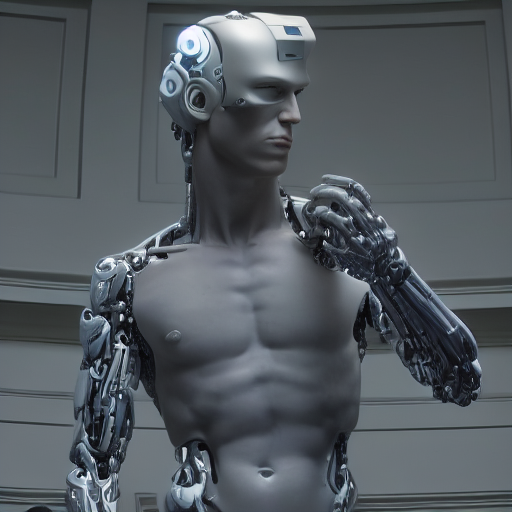

In [ ]:
url = "https://raw.githubusercontent.com/timothybrooks/instruct-pix2pix/main/imgs/example.jpg"
def download_image(url):
    image = PIL.Image.open(requests.get(url, stream=True).raw)
    image = PIL.ImageOps.exif_transpose(image)
    image = image.convert("RGB")
    return image
image = download_image(url)

prompt = "turn him into cyborg"
images = pipe(prompt, image=image, num_inference_steps=10, image_guidance_scale=1).images
images[0]

In [ ]:
!pip install torchmetrics
import json
from matrics_calculator import MetricsCalculator

# Load PIE-Bench metadata
pie_bench_path = "PIE-Bench_v1"
annotation_images_path = os.path.join(pie_bench_path, "annotation_images")
mapping_file = os.path.join(pie_bench_path, "mapping_file.json")

with open(mapping_file, "r") as f:
    metadata = json.load(f)

metrics_calculator = MetricsCalculator(device="cuda")

config.json:   0%|          | 0.00/4.52k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/905 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/961k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

Downloading: "https://download.pytorch.org/models/squeezenet1_1-b8a52dc0.pth" to /root/.cache/torch/hub/checkpoints/squeezenet1_1-b8a52dc0.pth
100%|██████████| 4.73M/4.73M [00:00<00:00, 46.7MB/s]
/usr/local/lib/python3.10/dist-packages/torchmetrics/functional/image/lpips.py:323: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for 

In [ ]:
from diffusers.utils import load_image

results = []
total_graphs = len(metadata)
print(f"Total number of graphs to evaluate: {total_graphs}")

for idx, (image_id, data) in enumerate(metadata.items(), start=1):
    # Perform evaluation logic...
    print(f"Processing graph {idx}/{total_graphs} (ID: {image_id})")
    source_image_path = os.path.join(annotation_images_path, data["image_path"])
    # original_prompt = data["original_prompt"]
    editing_prompt = data["editing_prompt"]
    # mask_encoded = data["mask"]
    # mask = mask_decode(mask_encoded).astype(np.uint8)

    # Load source image
    raw_image = load_image(source_image_path).resize((512, 512))

    # Perform editing
    edited_image = pipe(prompt = editing_prompt, image=image, num_inference_steps=15, image_guidance_scale=1).images[0]

    # Evaluate metrics
    ssim = metrics_calculator.calculate_ssim(raw_image, edited_image, None, None)
    lpips = metrics_calculator.calculate_lpips(raw_image, edited_image, None, None)
    clip_similarity_target = metrics_calculator.calculate_clip_similarity(edited_image, editing_prompt, None)

    # Store results
    tmp = {
        "image_id": image_id,
        "ssim": ssim,
        "lpips": lpips,
        "clip_similarity_target": clip_similarity_target
    }
    print(tmp)
    results.append(tmp)

    # Save intermediate results every 100 graphs
    if idx % 100 == 0 or idx == total_graphs:
        partial_results_file = f"pie_bench_results_partial_{idx}.json"
        with open(partial_results_file, "w") as f:
            json.dump(results, f, indent=4)
        print(f"Saved progress at graph {idx} to {partial_results_file}")

########################################
# Step 5: Save Results
########################################

results_file = "pie_bench_results.json"
with open(results_file, "w") as f:
    json.dump(results, f, indent=4)

print(f"Evaluation complete. Results saved to {results_file}.")

Total number of graphs to evaluate: 700
Processing graph 1/700 (ID: 000000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000000', 'ssim': 0.24122747778892517, 'lpips': 0.5950101613998413, 'clip_similarity_target': 29.883373260498047}
Processing graph 2/700 (ID: 000000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000001', 'ssim': 0.28565603494644165, 'lpips': 0.8427723050117493, 'clip_similarity_target': 22.187284469604492}
Processing graph 3/700 (ID: 000000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000002', 'ssim': 0.39489373564720154, 'lpips': 0.6278689503669739, 'clip_similarity_target': 26.990976333618164}
Processing graph 4/700 (ID: 000000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000003', 'ssim': 0.2921406924724579, 'lpips': 0.5704759955406189, 'clip_similarity_target': 20.32683563232422}
Processing graph 5/700 (ID: 000000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000004', 'ssim': 0.430325984954834, 'lpips': 0.5202328562736511, 'clip_similarity_target': 34.81904983520508}
Processing graph 6/700 (ID: 000000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000005', 'ssim': 0.38140615820884705, 'lpips': 0.7488454580307007, 'clip_similarity_target': 25.749618530273438}
Processing graph 7/700 (ID: 000000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000006', 'ssim': 0.4461381435394287, 'lpips': 0.5942538380622864, 'clip_similarity_target': 33.068138122558594}
Processing graph 8/700 (ID: 000000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000007', 'ssim': 0.2655118405818939, 'lpips': 0.654174268245697, 'clip_similarity_target': 28.669694900512695}
Processing graph 9/700 (ID: 000000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000008', 'ssim': 0.17687729001045227, 'lpips': 0.7167186141014099, 'clip_similarity_target': 23.130756378173828}
Processing graph 10/700 (ID: 000000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000009', 'ssim': 0.5990173816680908, 'lpips': 0.5339534282684326, 'clip_similarity_target': 23.00665283203125}
Processing graph 11/700 (ID: 000000000010)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000010', 'ssim': 0.42919838428497314, 'lpips': 0.6247724890708923, 'clip_similarity_target': 31.380468368530273}
Processing graph 12/700 (ID: 000000000011)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000011', 'ssim': 0.41277942061424255, 'lpips': 0.7569392323493958, 'clip_similarity_target': 25.960905075073242}
Processing graph 13/700 (ID: 000000000012)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000012', 'ssim': 0.22675257921218872, 'lpips': 0.7251025438308716, 'clip_similarity_target': 26.76900863647461}
Processing graph 14/700 (ID: 000000000013)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000013', 'ssim': 0.3039524555206299, 'lpips': 0.7479044198989868, 'clip_similarity_target': 24.31325340270996}
Processing graph 15/700 (ID: 000000000014)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000014', 'ssim': 0.4172595739364624, 'lpips': 0.5863953828811646, 'clip_similarity_target': 24.855344772338867}
Processing graph 16/700 (ID: 000000000015)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000015', 'ssim': 0.3462764024734497, 'lpips': 0.734387218952179, 'clip_similarity_target': 20.88994026184082}
Processing graph 17/700 (ID: 000000000016)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000016', 'ssim': 0.3016669452190399, 'lpips': 0.7282000184059143, 'clip_similarity_target': 23.753076553344727}
Processing graph 18/700 (ID: 000000000017)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000017', 'ssim': 0.35949641466140747, 'lpips': 0.6628561615943909, 'clip_similarity_target': 24.35316276550293}
Processing graph 19/700 (ID: 000000000018)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000018', 'ssim': 0.39739352464675903, 'lpips': 0.5569485425949097, 'clip_similarity_target': 31.548690795898438}
Processing graph 20/700 (ID: 000000000019)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000019', 'ssim': 0.16379156708717346, 'lpips': 0.7742050290107727, 'clip_similarity_target': 23.48417091369629}
Processing graph 21/700 (ID: 000000000020)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000020', 'ssim': 0.43019741773605347, 'lpips': 0.723654568195343, 'clip_similarity_target': 30.260669708251953}
Processing graph 22/700 (ID: 000000000021)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000021', 'ssim': 0.24809113144874573, 'lpips': 0.6916313767433167, 'clip_similarity_target': 32.70073699951172}
Processing graph 23/700 (ID: 000000000022)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000022', 'ssim': 0.2385934293270111, 'lpips': 0.8612101078033447, 'clip_similarity_target': 22.08755111694336}
Processing graph 24/700 (ID: 000000000023)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000023', 'ssim': 0.2843056321144104, 'lpips': 0.6311074495315552, 'clip_similarity_target': 24.171972274780273}
Processing graph 25/700 (ID: 000000000024)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000024', 'ssim': 0.14666973054409027, 'lpips': 0.7401769161224365, 'clip_similarity_target': 25.776567459106445}
Processing graph 26/700 (ID: 000000000025)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000025', 'ssim': 0.3737115263938904, 'lpips': 0.755561351776123, 'clip_similarity_target': 31.785846710205078}
Processing graph 27/700 (ID: 000000000026)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000026', 'ssim': 0.3651113212108612, 'lpips': 0.6944184899330139, 'clip_similarity_target': 30.407846450805664}
Processing graph 28/700 (ID: 000000000027)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000027', 'ssim': 0.20848575234413147, 'lpips': 0.8724380135536194, 'clip_similarity_target': 26.127025604248047}
Processing graph 29/700 (ID: 000000000028)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000028', 'ssim': 0.6911088824272156, 'lpips': 0.5184206366539001, 'clip_similarity_target': 27.715469360351562}
Processing graph 30/700 (ID: 000000000029)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000029', 'ssim': 0.3730936646461487, 'lpips': 0.5540003776550293, 'clip_similarity_target': 26.639217376708984}
Processing graph 31/700 (ID: 000000000030)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000030', 'ssim': 0.1346881091594696, 'lpips': 0.6132298707962036, 'clip_similarity_target': 23.737985610961914}
Processing graph 32/700 (ID: 000000000031)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000031', 'ssim': 0.1569996327161789, 'lpips': 0.8564378023147583, 'clip_similarity_target': 21.306123733520508}
Processing graph 33/700 (ID: 000000000032)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000032', 'ssim': 0.2273281067609787, 'lpips': 0.879216194152832, 'clip_similarity_target': 23.41073226928711}
Processing graph 34/700 (ID: 000000000033)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000033', 'ssim': 0.3277233839035034, 'lpips': 0.8907232284545898, 'clip_similarity_target': 28.60945701599121}
Processing graph 35/700 (ID: 000000000034)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000034', 'ssim': 0.258772611618042, 'lpips': 0.6647183895111084, 'clip_similarity_target': 31.24226951599121}
Processing graph 36/700 (ID: 000000000035)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000035', 'ssim': 0.17865829169750214, 'lpips': 0.7279077768325806, 'clip_similarity_target': 26.928701400756836}
Processing graph 37/700 (ID: 000000000036)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000036', 'ssim': 0.17461101710796356, 'lpips': 0.9657094478607178, 'clip_similarity_target': 23.5183048248291}
Processing graph 38/700 (ID: 000000000037)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000037', 'ssim': 0.27179771661758423, 'lpips': 0.7698665261268616, 'clip_similarity_target': 25.539148330688477}
Processing graph 39/700 (ID: 000000000038)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000038', 'ssim': 0.3708077371120453, 'lpips': 0.7439628839492798, 'clip_similarity_target': 21.668102264404297}
Processing graph 40/700 (ID: 000000000039)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000039', 'ssim': 0.22079679369926453, 'lpips': 0.8384371995925903, 'clip_similarity_target': 21.104230880737305}
Processing graph 41/700 (ID: 000000000040)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000040', 'ssim': 0.2621803879737854, 'lpips': 0.5918370485305786, 'clip_similarity_target': 26.387134552001953}
Processing graph 42/700 (ID: 000000000041)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000041', 'ssim': 0.12900155782699585, 'lpips': 0.7888479828834534, 'clip_similarity_target': 28.444093704223633}
Processing graph 43/700 (ID: 000000000042)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000042', 'ssim': 0.348482608795166, 'lpips': 0.6083301901817322, 'clip_similarity_target': 26.78884506225586}
Processing graph 44/700 (ID: 000000000043)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000043', 'ssim': 0.6088522672653198, 'lpips': 0.5725659132003784, 'clip_similarity_target': 30.62847900390625}
Processing graph 45/700 (ID: 000000000044)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000044', 'ssim': 0.16572582721710205, 'lpips': 0.684586226940155, 'clip_similarity_target': 26.1601505279541}
Processing graph 46/700 (ID: 000000000045)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000045', 'ssim': 0.31999650597572327, 'lpips': 0.8307782411575317, 'clip_similarity_target': 29.675525665283203}
Processing graph 47/700 (ID: 000000000046)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000046', 'ssim': 0.5705069303512573, 'lpips': 0.7082217931747437, 'clip_similarity_target': 23.329992294311523}
Processing graph 48/700 (ID: 000000000047)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000047', 'ssim': 0.10828672349452972, 'lpips': 0.7406299114227295, 'clip_similarity_target': 28.298294067382812}
Processing graph 49/700 (ID: 000000000048)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000048', 'ssim': 0.41710934042930603, 'lpips': 0.6330997347831726, 'clip_similarity_target': 23.82254981994629}
Processing graph 50/700 (ID: 000000000049)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000049', 'ssim': 0.41997164487838745, 'lpips': 0.5606046319007874, 'clip_similarity_target': 26.3430233001709}
Processing graph 51/700 (ID: 000000000050)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000050', 'ssim': 0.48832783102989197, 'lpips': 0.6450673937797546, 'clip_similarity_target': 29.350852966308594}
Processing graph 52/700 (ID: 000000000051)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000051', 'ssim': 0.19039420783519745, 'lpips': 0.8182292580604553, 'clip_similarity_target': 28.809377670288086}
Processing graph 53/700 (ID: 000000000052)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000052', 'ssim': 0.11000069230794907, 'lpips': 0.3371618986129761, 'clip_similarity_target': 21.82716941833496}
Processing graph 54/700 (ID: 000000000053)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000053', 'ssim': 0.23924753069877625, 'lpips': 0.6280530691146851, 'clip_similarity_target': 29.493803024291992}
Processing graph 55/700 (ID: 000000000054)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000054', 'ssim': 0.27598506212234497, 'lpips': 0.7360304594039917, 'clip_similarity_target': 23.088533401489258}
Processing graph 56/700 (ID: 000000000055)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000055', 'ssim': 0.2626485228538513, 'lpips': 0.5890399217605591, 'clip_similarity_target': 29.738351821899414}
Processing graph 57/700 (ID: 000000000056)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000056', 'ssim': 0.08508065342903137, 'lpips': 0.5945404767990112, 'clip_similarity_target': 31.923126220703125}
Processing graph 58/700 (ID: 000000000057)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000057', 'ssim': 0.1942555010318756, 'lpips': 0.6915248036384583, 'clip_similarity_target': 23.063966751098633}
Processing graph 59/700 (ID: 000000000058)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000058', 'ssim': 0.25348928570747375, 'lpips': 0.9170482158660889, 'clip_similarity_target': 31.272891998291016}
Processing graph 60/700 (ID: 000000000059)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000059', 'ssim': 0.36128801107406616, 'lpips': 0.6516500115394592, 'clip_similarity_target': 24.304914474487305}
Processing graph 61/700 (ID: 000000000060)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000060', 'ssim': 0.48202118277549744, 'lpips': 0.5770373344421387, 'clip_similarity_target': 24.896203994750977}
Processing graph 62/700 (ID: 000000000061)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000061', 'ssim': 0.11606462299823761, 'lpips': 0.6368889212608337, 'clip_similarity_target': 27.387439727783203}
Processing graph 63/700 (ID: 000000000062)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000062', 'ssim': 0.23188984394073486, 'lpips': 0.7579941749572754, 'clip_similarity_target': 27.694765090942383}
Processing graph 64/700 (ID: 000000000063)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000063', 'ssim': 0.3470582962036133, 'lpips': 0.5513733625411987, 'clip_similarity_target': 27.180225372314453}
Processing graph 65/700 (ID: 000000000064)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000064', 'ssim': 0.16526810824871063, 'lpips': 0.6781116724014282, 'clip_similarity_target': 29.58601188659668}
Processing graph 66/700 (ID: 000000000065)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000065', 'ssim': 0.5413477420806885, 'lpips': 0.5291356444358826, 'clip_similarity_target': 22.172658920288086}
Processing graph 67/700 (ID: 000000000066)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000066', 'ssim': 0.36684179306030273, 'lpips': 0.6588455438613892, 'clip_similarity_target': 25.520673751831055}
Processing graph 68/700 (ID: 000000000067)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000067', 'ssim': 0.39897531270980835, 'lpips': 0.5908440351486206, 'clip_similarity_target': 28.294328689575195}
Processing graph 69/700 (ID: 000000000068)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000068', 'ssim': 0.33665305376052856, 'lpips': 0.5595672130584717, 'clip_similarity_target': 29.1171817779541}
Processing graph 70/700 (ID: 000000000069)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000069', 'ssim': 0.2292439192533493, 'lpips': 0.6646987199783325, 'clip_similarity_target': 23.91954803466797}
Processing graph 71/700 (ID: 000000000070)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000070', 'ssim': 0.5147539377212524, 'lpips': 0.7945011258125305, 'clip_similarity_target': 14.520557403564453}
Processing graph 72/700 (ID: 000000000071)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000071', 'ssim': 0.6511236429214478, 'lpips': 0.5589186549186707, 'clip_similarity_target': 26.11823081970215}
Processing graph 73/700 (ID: 000000000072)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000072', 'ssim': 0.412986695766449, 'lpips': 0.6727081537246704, 'clip_similarity_target': 29.245502471923828}
Processing graph 74/700 (ID: 000000000073)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000073', 'ssim': 0.38745689392089844, 'lpips': 0.6434808969497681, 'clip_similarity_target': 16.447952270507812}
Processing graph 75/700 (ID: 000000000074)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000074', 'ssim': 0.46034377813339233, 'lpips': 0.5232502222061157, 'clip_similarity_target': 17.3829345703125}
Processing graph 76/700 (ID: 000000000075)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000075', 'ssim': 0.2714671790599823, 'lpips': 0.783857524394989, 'clip_similarity_target': 24.76132583618164}
Processing graph 77/700 (ID: 000000000076)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000076', 'ssim': 0.49250632524490356, 'lpips': 0.5758285522460938, 'clip_similarity_target': 26.85837745666504}
Processing graph 78/700 (ID: 000000000077)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000077', 'ssim': 0.27032631635665894, 'lpips': 0.7604097127914429, 'clip_similarity_target': 25.506643295288086}
Processing graph 79/700 (ID: 000000000078)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000078', 'ssim': 0.3093230724334717, 'lpips': 0.7721110582351685, 'clip_similarity_target': 13.665731430053711}
Processing graph 80/700 (ID: 000000000079)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000079', 'ssim': 0.4555482268333435, 'lpips': 0.6786978840827942, 'clip_similarity_target': 30.119979858398438}
Processing graph 81/700 (ID: 000000000080)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000080', 'ssim': 0.5060465335845947, 'lpips': 0.701675295829773, 'clip_similarity_target': 33.59325408935547}
Processing graph 82/700 (ID: 000000000081)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000081', 'ssim': 0.3763366639614105, 'lpips': 0.6378155946731567, 'clip_similarity_target': 20.476821899414062}
Processing graph 83/700 (ID: 000000000082)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000082', 'ssim': 0.3722410202026367, 'lpips': 0.6591532230377197, 'clip_similarity_target': 23.150758743286133}
Processing graph 84/700 (ID: 000000000083)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000083', 'ssim': 0.2743900418281555, 'lpips': 0.7673905491828918, 'clip_similarity_target': 29.64889144897461}
Processing graph 85/700 (ID: 000000000084)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000084', 'ssim': 0.4893680512905121, 'lpips': 0.7417841553688049, 'clip_similarity_target': 26.638019561767578}
Processing graph 86/700 (ID: 000000000085)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000085', 'ssim': 0.4379332959651947, 'lpips': 0.5947657227516174, 'clip_similarity_target': 23.39533042907715}
Processing graph 87/700 (ID: 000000000086)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000086', 'ssim': 0.2118169069290161, 'lpips': 0.7952168583869934, 'clip_similarity_target': 25.13363265991211}
Processing graph 88/700 (ID: 000000000087)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000087', 'ssim': 0.3433864116668701, 'lpips': 0.8990474343299866, 'clip_similarity_target': 26.928335189819336}
Processing graph 89/700 (ID: 000000000088)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000088', 'ssim': 0.14097434282302856, 'lpips': 0.7079960107803345, 'clip_similarity_target': 32.83638381958008}
Processing graph 90/700 (ID: 000000000089)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000089', 'ssim': 0.6070303916931152, 'lpips': 0.7450507879257202, 'clip_similarity_target': 31.077054977416992}
Processing graph 91/700 (ID: 000000000090)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000090', 'ssim': 0.618005633354187, 'lpips': 0.46006089448928833, 'clip_similarity_target': 30.817646026611328}
Processing graph 92/700 (ID: 000000000091)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000091', 'ssim': 0.22623585164546967, 'lpips': 0.6968878507614136, 'clip_similarity_target': 27.21882438659668}
Processing graph 93/700 (ID: 000000000092)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000092', 'ssim': 0.23423725366592407, 'lpips': 0.7899983525276184, 'clip_similarity_target': 28.037193298339844}
Processing graph 94/700 (ID: 000000000093)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000093', 'ssim': 0.21523603796958923, 'lpips': 0.7691817283630371, 'clip_similarity_target': 26.564645767211914}
Processing graph 95/700 (ID: 000000000094)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000094', 'ssim': 0.16489925980567932, 'lpips': 0.8238903880119324, 'clip_similarity_target': 30.874269485473633}
Processing graph 96/700 (ID: 000000000095)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000095', 'ssim': 0.28063279390335083, 'lpips': 0.6449893712997437, 'clip_similarity_target': 28.25379753112793}
Processing graph 97/700 (ID: 000000000096)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000096', 'ssim': 0.17476718127727509, 'lpips': 0.7310926914215088, 'clip_similarity_target': 31.33319091796875}
Processing graph 98/700 (ID: 000000000097)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000097', 'ssim': 0.09294739365577698, 'lpips': 0.8031920194625854, 'clip_similarity_target': 29.84771156311035}
Processing graph 99/700 (ID: 000000000098)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000098', 'ssim': 0.29719507694244385, 'lpips': 0.8615890741348267, 'clip_similarity_target': 23.249834060668945}
Processing graph 100/700 (ID: 000000000099)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000099', 'ssim': 0.47728657722473145, 'lpips': 0.5874082446098328, 'clip_similarity_target': 30.323118209838867}
Saved progress at graph 100 to pie_bench_results_partial_100.json
Processing graph 101/700 (ID: 000000000100)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000100', 'ssim': 0.3502614498138428, 'lpips': 0.6650499701499939, 'clip_similarity_target': 29.52197265625}
Processing graph 102/700 (ID: 000000000101)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000101', 'ssim': 0.3534772992134094, 'lpips': 0.736024022102356, 'clip_similarity_target': 24.60007095336914}
Processing graph 103/700 (ID: 000000000102)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000102', 'ssim': 0.45767998695373535, 'lpips': 0.7493975162506104, 'clip_similarity_target': 20.71042823791504}
Processing graph 104/700 (ID: 000000000103)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000103', 'ssim': 0.23507355153560638, 'lpips': 0.6435231566429138, 'clip_similarity_target': 32.10513687133789}
Processing graph 105/700 (ID: 000000000104)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000104', 'ssim': 0.38981086015701294, 'lpips': 0.6961175203323364, 'clip_similarity_target': 27.868274688720703}
Processing graph 106/700 (ID: 000000000105)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000105', 'ssim': 0.2242913693189621, 'lpips': 0.7243025302886963, 'clip_similarity_target': 21.761377334594727}
Processing graph 107/700 (ID: 000000000106)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000106', 'ssim': 0.3528854548931122, 'lpips': 0.7450237274169922, 'clip_similarity_target': 26.72724151611328}
Processing graph 108/700 (ID: 000000000107)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000107', 'ssim': 0.37552350759506226, 'lpips': 0.8069542050361633, 'clip_similarity_target': 22.84250831604004}
Processing graph 109/700 (ID: 000000000108)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000108', 'ssim': 0.4977726340293884, 'lpips': 0.5323269367218018, 'clip_similarity_target': 27.615541458129883}
Processing graph 110/700 (ID: 000000000109)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000109', 'ssim': 0.12476571649312973, 'lpips': 0.7431791424751282, 'clip_similarity_target': 25.967069625854492}
Processing graph 111/700 (ID: 000000000110)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000110', 'ssim': 0.36780500411987305, 'lpips': 0.4954979717731476, 'clip_similarity_target': 26.970035552978516}
Processing graph 112/700 (ID: 000000000111)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000111', 'ssim': 0.2697257399559021, 'lpips': 0.6963747143745422, 'clip_similarity_target': 18.831140518188477}
Processing graph 113/700 (ID: 000000000112)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000112', 'ssim': 0.17509230971336365, 'lpips': 0.7252572178840637, 'clip_similarity_target': 28.52325439453125}
Processing graph 114/700 (ID: 000000000113)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000113', 'ssim': 0.2887142598628998, 'lpips': 0.5475875735282898, 'clip_similarity_target': 28.878217697143555}
Processing graph 115/700 (ID: 000000000114)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000114', 'ssim': 0.2503834366798401, 'lpips': 0.7705133557319641, 'clip_similarity_target': 22.065683364868164}
Processing graph 116/700 (ID: 000000000115)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000115', 'ssim': 0.6783401370048523, 'lpips': 0.654891848564148, 'clip_similarity_target': 20.79729652404785}
Processing graph 117/700 (ID: 000000000116)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000116', 'ssim': 0.318936288356781, 'lpips': 0.6692767143249512, 'clip_similarity_target': 28.50794792175293}
Processing graph 118/700 (ID: 000000000117)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000117', 'ssim': 0.36045023798942566, 'lpips': 0.8055309057235718, 'clip_similarity_target': 20.634090423583984}
Processing graph 119/700 (ID: 000000000118)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000118', 'ssim': 0.7082679271697998, 'lpips': 0.4880697727203369, 'clip_similarity_target': 26.418590545654297}
Processing graph 120/700 (ID: 000000000119)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000119', 'ssim': 0.3503872752189636, 'lpips': 0.7362236380577087, 'clip_similarity_target': 31.746557235717773}
Processing graph 121/700 (ID: 000000000120)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000120', 'ssim': 0.4276670813560486, 'lpips': 0.6286406517028809, 'clip_similarity_target': 21.89230728149414}
Processing graph 122/700 (ID: 000000000121)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000121', 'ssim': 0.23659729957580566, 'lpips': 0.853380024433136, 'clip_similarity_target': 25.03529167175293}
Processing graph 123/700 (ID: 000000000122)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000122', 'ssim': 0.2141907662153244, 'lpips': 1.042055368423462, 'clip_similarity_target': 23.071985244750977}
Processing graph 124/700 (ID: 000000000123)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000123', 'ssim': 0.3493843972682953, 'lpips': 0.7226741313934326, 'clip_similarity_target': 26.74565887451172}
Processing graph 125/700 (ID: 000000000124)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000124', 'ssim': 0.43680164217948914, 'lpips': 0.8050981760025024, 'clip_similarity_target': 24.222976684570312}
Processing graph 126/700 (ID: 000000000125)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000125', 'ssim': 0.19042937457561493, 'lpips': 0.8384160995483398, 'clip_similarity_target': 31.981510162353516}
Processing graph 127/700 (ID: 000000000126)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000126', 'ssim': 0.37118613719940186, 'lpips': 0.6166914105415344, 'clip_similarity_target': 28.5638427734375}
Processing graph 128/700 (ID: 000000000127)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000127', 'ssim': 0.4069015681743622, 'lpips': 0.7088936567306519, 'clip_similarity_target': 27.349567413330078}
Processing graph 129/700 (ID: 000000000128)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000128', 'ssim': 0.43399691581726074, 'lpips': 0.6804566979408264, 'clip_similarity_target': 32.184696197509766}
Processing graph 130/700 (ID: 000000000129)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000129', 'ssim': 0.2830643653869629, 'lpips': 0.9431607723236084, 'clip_similarity_target': 21.498334884643555}
Processing graph 131/700 (ID: 000000000130)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000130', 'ssim': 0.5013635158538818, 'lpips': 0.7145675420761108, 'clip_similarity_target': 30.740951538085938}
Processing graph 132/700 (ID: 000000000131)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000131', 'ssim': 0.32574915885925293, 'lpips': 0.5984106063842773, 'clip_similarity_target': 23.096284866333008}
Processing graph 133/700 (ID: 000000000132)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000132', 'ssim': 0.3858608603477478, 'lpips': 0.6890977025032043, 'clip_similarity_target': 33.277076721191406}
Processing graph 134/700 (ID: 000000000133)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000133', 'ssim': 0.13361571729183197, 'lpips': 0.8819658756256104, 'clip_similarity_target': 23.668729782104492}
Processing graph 135/700 (ID: 000000000134)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000134', 'ssim': 0.591814398765564, 'lpips': 0.5025667548179626, 'clip_similarity_target': 21.771902084350586}
Processing graph 136/700 (ID: 000000000135)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000135', 'ssim': 0.5620958805084229, 'lpips': 0.5801805257797241, 'clip_similarity_target': 27.718162536621094}
Processing graph 137/700 (ID: 000000000136)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000136', 'ssim': 0.4916979670524597, 'lpips': 0.6846714019775391, 'clip_similarity_target': 25.193315505981445}
Processing graph 138/700 (ID: 000000000137)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000137', 'ssim': 0.1231972873210907, 'lpips': 0.6767453551292419, 'clip_similarity_target': 29.456619262695312}
Processing graph 139/700 (ID: 000000000138)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000138', 'ssim': 0.3980080783367157, 'lpips': 0.5731545090675354, 'clip_similarity_target': 21.49856185913086}
Processing graph 140/700 (ID: 000000000139)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '000000000139', 'ssim': 0.28240904211997986, 'lpips': 0.6952740550041199, 'clip_similarity_target': 22.721981048583984}
Processing graph 141/700 (ID: 111000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '111000000000', 'ssim': 0.20261454582214355, 'lpips': 0.7382305264472961, 'clip_similarity_target': 23.39211082458496}
Processing graph 142/700 (ID: 111000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '111000000001', 'ssim': 0.4583129584789276, 'lpips': 0.5680969953536987, 'clip_similarity_target': 23.461641311645508}
Processing graph 143/700 (ID: 111000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '111000000002', 'ssim': 0.371020644903183, 'lpips': 0.582753598690033, 'clip_similarity_target': 21.162677764892578}
Processing graph 144/700 (ID: 111000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '111000000003', 'ssim': 0.40637680888175964, 'lpips': 0.617325484752655, 'clip_similarity_target': 24.81719207763672}
Processing graph 145/700 (ID: 111000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '111000000004', 'ssim': 0.48277920484542847, 'lpips': 0.8193318247795105, 'clip_similarity_target': 16.958477020263672}
Processing graph 146/700 (ID: 111000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '111000000005', 'ssim': 0.2878423035144806, 'lpips': 0.7265947461128235, 'clip_similarity_target': 21.647693634033203}
Processing graph 147/700 (ID: 111000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '111000000006', 'ssim': 0.41414695978164673, 'lpips': 0.5808297395706177, 'clip_similarity_target': 33.20166015625}
Processing graph 148/700 (ID: 111000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '111000000007', 'ssim': 0.39215922355651855, 'lpips': 0.7391372919082642, 'clip_similarity_target': 32.03166961669922}
Processing graph 149/700 (ID: 111000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '111000000008', 'ssim': 0.3122694790363312, 'lpips': 0.701274573802948, 'clip_similarity_target': 34.5904541015625}
Processing graph 150/700 (ID: 111000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '111000000009', 'ssim': 0.24123571813106537, 'lpips': 0.8044543862342834, 'clip_similarity_target': 23.40835189819336}
Processing graph 151/700 (ID: 112000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '112000000000', 'ssim': 0.18038031458854675, 'lpips': 0.6098741888999939, 'clip_similarity_target': 17.85050392150879}
Processing graph 152/700 (ID: 112000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '112000000001', 'ssim': 0.4084926247596741, 'lpips': 0.6493210792541504, 'clip_similarity_target': 26.262128829956055}
Processing graph 153/700 (ID: 112000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '112000000002', 'ssim': 0.30536746978759766, 'lpips': 0.6236288547515869, 'clip_similarity_target': 28.934955596923828}
Processing graph 154/700 (ID: 112000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '112000000003', 'ssim': 0.5154445767402649, 'lpips': 0.5949465036392212, 'clip_similarity_target': 31.002599716186523}
Processing graph 155/700 (ID: 112000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '112000000004', 'ssim': 0.47507214546203613, 'lpips': 0.6409753561019897, 'clip_similarity_target': 28.94569969177246}
Processing graph 156/700 (ID: 112000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '112000000005', 'ssim': 0.23536497354507446, 'lpips': 0.64921635389328, 'clip_similarity_target': 33.054222106933594}
Processing graph 157/700 (ID: 112000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '112000000006', 'ssim': 0.19346937537193298, 'lpips': 0.665710985660553, 'clip_similarity_target': 26.5111141204834}
Processing graph 158/700 (ID: 112000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '112000000007', 'ssim': 0.22223369777202606, 'lpips': 0.7639774680137634, 'clip_similarity_target': 25.577327728271484}
Processing graph 159/700 (ID: 112000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '112000000008', 'ssim': 0.4587363600730896, 'lpips': 0.8127325773239136, 'clip_similarity_target': 27.393665313720703}
Processing graph 160/700 (ID: 112000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '112000000009', 'ssim': 0.2229549139738083, 'lpips': 0.9305450320243835, 'clip_similarity_target': 26.69437599182129}
Processing graph 161/700 (ID: 113000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '113000000000', 'ssim': 0.23908096551895142, 'lpips': 0.7409811019897461, 'clip_similarity_target': 29.232925415039062}
Processing graph 162/700 (ID: 113000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '113000000001', 'ssim': 0.43588805198669434, 'lpips': 0.7754691243171692, 'clip_similarity_target': 25.025630950927734}
Processing graph 163/700 (ID: 113000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '113000000002', 'ssim': 0.3300233483314514, 'lpips': 0.6339022517204285, 'clip_similarity_target': 29.521543502807617}
Processing graph 164/700 (ID: 113000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '113000000003', 'ssim': 0.4019330143928528, 'lpips': 0.5944380164146423, 'clip_similarity_target': 23.099750518798828}
Processing graph 165/700 (ID: 113000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '113000000004', 'ssim': 0.3198290467262268, 'lpips': 0.670561671257019, 'clip_similarity_target': 18.798664093017578}
Processing graph 166/700 (ID: 113000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '113000000005', 'ssim': 0.531819760799408, 'lpips': 0.5986100435256958, 'clip_similarity_target': 25.9549560546875}
Processing graph 167/700 (ID: 113000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '113000000006', 'ssim': 0.42579373717308044, 'lpips': 0.56434166431427, 'clip_similarity_target': 25.239776611328125}
Processing graph 168/700 (ID: 113000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '113000000007', 'ssim': 0.3514888882637024, 'lpips': 0.769378125667572, 'clip_similarity_target': 27.897294998168945}
Processing graph 169/700 (ID: 113000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '113000000008', 'ssim': 0.291096955537796, 'lpips': 0.650738000869751, 'clip_similarity_target': 24.8414306640625}
Processing graph 170/700 (ID: 113000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '113000000009', 'ssim': 0.10981732606887817, 'lpips': 0.8637281656265259, 'clip_similarity_target': 27.528459548950195}
Processing graph 171/700 (ID: 114000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '114000000000', 'ssim': 0.1940607875585556, 'lpips': 0.66853928565979, 'clip_similarity_target': 22.580276489257812}
Processing graph 172/700 (ID: 114000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '114000000001', 'ssim': 0.46223124861717224, 'lpips': 0.6095399856567383, 'clip_similarity_target': 30.92434310913086}
Processing graph 173/700 (ID: 114000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '114000000002', 'ssim': 0.3749111592769623, 'lpips': 0.7643817067146301, 'clip_similarity_target': 21.273597717285156}
Processing graph 174/700 (ID: 114000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '114000000003', 'ssim': 0.2159891128540039, 'lpips': 0.6315566897392273, 'clip_similarity_target': 23.85964012145996}
Processing graph 175/700 (ID: 114000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '114000000004', 'ssim': 0.34351032972335815, 'lpips': 0.4836742579936981, 'clip_similarity_target': 31.32173728942871}
Processing graph 176/700 (ID: 114000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '114000000005', 'ssim': 0.28262051939964294, 'lpips': 0.6621035933494568, 'clip_similarity_target': 20.688871383666992}
Processing graph 177/700 (ID: 114000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '114000000006', 'ssim': 0.41058382391929626, 'lpips': 0.6761378049850464, 'clip_similarity_target': 24.94363021850586}
Processing graph 178/700 (ID: 114000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '114000000007', 'ssim': 0.4270293414592743, 'lpips': 0.6162233352661133, 'clip_similarity_target': 27.406299591064453}
Processing graph 179/700 (ID: 114000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '114000000008', 'ssim': 0.38981425762176514, 'lpips': 0.5490486025810242, 'clip_similarity_target': 28.98116683959961}
Processing graph 180/700 (ID: 114000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '114000000009', 'ssim': 0.2962990403175354, 'lpips': 0.5611936450004578, 'clip_similarity_target': 17.143339157104492}
Processing graph 181/700 (ID: 121000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '121000000000', 'ssim': 0.2299453318119049, 'lpips': 0.7527576088905334, 'clip_similarity_target': 30.399641036987305}
Processing graph 182/700 (ID: 121000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '121000000001', 'ssim': 0.23216985166072845, 'lpips': 0.720106840133667, 'clip_similarity_target': 29.813432693481445}
Processing graph 183/700 (ID: 121000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '121000000002', 'ssim': 0.2353070080280304, 'lpips': 0.822222888469696, 'clip_similarity_target': 27.92864227294922}
Processing graph 184/700 (ID: 121000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '121000000003', 'ssim': 0.21660766005516052, 'lpips': 0.6070432066917419, 'clip_similarity_target': 26.631799697875977}
Processing graph 185/700 (ID: 121000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '121000000004', 'ssim': 0.5661659240722656, 'lpips': 0.6797566413879395, 'clip_similarity_target': 24.85595703125}
Processing graph 186/700 (ID: 121000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '121000000005', 'ssim': 0.35155701637268066, 'lpips': 0.6783409118652344, 'clip_similarity_target': 23.49860954284668}
Processing graph 187/700 (ID: 121000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '121000000006', 'ssim': 0.3960530161857605, 'lpips': 0.5906484723091125, 'clip_similarity_target': 26.670682907104492}
Processing graph 188/700 (ID: 121000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '121000000007', 'ssim': 0.16650816798210144, 'lpips': 0.8634246587753296, 'clip_similarity_target': 27.49435806274414}
Processing graph 189/700 (ID: 121000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '121000000008', 'ssim': 0.1602068543434143, 'lpips': 0.653184711933136, 'clip_similarity_target': 21.4758358001709}
Processing graph 190/700 (ID: 121000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '121000000009', 'ssim': 0.4586126208305359, 'lpips': 0.6144603490829468, 'clip_similarity_target': 28.011083602905273}
Processing graph 191/700 (ID: 122000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '122000000000', 'ssim': 0.3751375675201416, 'lpips': 0.6529194712638855, 'clip_similarity_target': 26.51323699951172}
Processing graph 192/700 (ID: 122000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '122000000001', 'ssim': 0.19267915189266205, 'lpips': 0.7477321028709412, 'clip_similarity_target': 22.588001251220703}
Processing graph 193/700 (ID: 122000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '122000000002', 'ssim': 0.5510806441307068, 'lpips': 0.45890745520591736, 'clip_similarity_target': 30.43653678894043}
Processing graph 194/700 (ID: 122000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '122000000003', 'ssim': 0.28785306215286255, 'lpips': 0.6877884268760681, 'clip_similarity_target': 27.56243324279785}
Processing graph 195/700 (ID: 122000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '122000000004', 'ssim': 0.4116837680339813, 'lpips': 0.6840991377830505, 'clip_similarity_target': 25.20381736755371}
Processing graph 196/700 (ID: 122000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '122000000005', 'ssim': 0.28443384170532227, 'lpips': 0.6734805703163147, 'clip_similarity_target': 28.588092803955078}
Processing graph 197/700 (ID: 122000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '122000000006', 'ssim': 0.20010080933570862, 'lpips': 0.6858673691749573, 'clip_similarity_target': 27.15184783935547}
Processing graph 198/700 (ID: 122000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '122000000007', 'ssim': 0.29070937633514404, 'lpips': 0.6835988163948059, 'clip_similarity_target': 34.891845703125}
Processing graph 199/700 (ID: 122000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '122000000008', 'ssim': 0.34891054034233093, 'lpips': 0.6259096264839172, 'clip_similarity_target': 25.03977394104004}
Processing graph 200/700 (ID: 122000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '122000000009', 'ssim': 0.22292667627334595, 'lpips': 0.613155722618103, 'clip_similarity_target': 24.554428100585938}
Saved progress at graph 200 to pie_bench_results_partial_200.json
Processing graph 201/700 (ID: 123000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '123000000000', 'ssim': 0.25169891119003296, 'lpips': 0.6600079536437988, 'clip_similarity_target': 21.52228546142578}
Processing graph 202/700 (ID: 123000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '123000000001', 'ssim': 0.681119441986084, 'lpips': 0.42182308435440063, 'clip_similarity_target': 26.485370635986328}
Processing graph 203/700 (ID: 123000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '123000000002', 'ssim': 0.5707553625106812, 'lpips': 0.5986487865447998, 'clip_similarity_target': 25.04436683654785}
Processing graph 204/700 (ID: 123000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '123000000003', 'ssim': 0.40605658292770386, 'lpips': 0.5943557024002075, 'clip_similarity_target': 24.536312103271484}
Processing graph 205/700 (ID: 123000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '123000000004', 'ssim': 0.27800923585891724, 'lpips': 0.848981499671936, 'clip_similarity_target': 30.694150924682617}
Processing graph 206/700 (ID: 123000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '123000000005', 'ssim': 0.19376727938652039, 'lpips': 0.7857306599617004, 'clip_similarity_target': 24.284061431884766}
Processing graph 207/700 (ID: 123000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '123000000006', 'ssim': 0.26459890604019165, 'lpips': 0.8235992789268494, 'clip_similarity_target': 28.102615356445312}
Processing graph 208/700 (ID: 123000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '123000000007', 'ssim': 0.4162716865539551, 'lpips': 0.641955554485321, 'clip_similarity_target': 22.147493362426758}
Processing graph 209/700 (ID: 123000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '123000000008', 'ssim': 0.4192013740539551, 'lpips': 0.5123820304870605, 'clip_similarity_target': 20.787630081176758}
Processing graph 210/700 (ID: 123000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '123000000009', 'ssim': 0.27743425965309143, 'lpips': 0.9019542336463928, 'clip_similarity_target': 25.37451934814453}
Processing graph 211/700 (ID: 124000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '124000000000', 'ssim': 0.5736368894577026, 'lpips': 0.6614965200424194, 'clip_similarity_target': 20.3250675201416}
Processing graph 212/700 (ID: 124000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '124000000001', 'ssim': 0.6744550466537476, 'lpips': 0.5704696774482727, 'clip_similarity_target': 22.026756286621094}
Processing graph 213/700 (ID: 124000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '124000000002', 'ssim': 0.5314148664474487, 'lpips': 0.6249539852142334, 'clip_similarity_target': 15.019159317016602}
Processing graph 214/700 (ID: 124000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '124000000003', 'ssim': 0.15089033544063568, 'lpips': 0.6896121501922607, 'clip_similarity_target': 26.584487915039062}
Processing graph 215/700 (ID: 124000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '124000000004', 'ssim': 0.209235280752182, 'lpips': 0.43973731994628906, 'clip_similarity_target': 26.77292823791504}
Processing graph 216/700 (ID: 124000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '124000000005', 'ssim': 0.3911210000514984, 'lpips': 0.5529112219810486, 'clip_similarity_target': 29.168949127197266}
Processing graph 217/700 (ID: 124000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '124000000006', 'ssim': 0.4610779285430908, 'lpips': 0.5589781999588013, 'clip_similarity_target': 27.91669464111328}
Processing graph 218/700 (ID: 124000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '124000000007', 'ssim': 0.44737088680267334, 'lpips': 0.622821569442749, 'clip_similarity_target': 20.983570098876953}
Processing graph 219/700 (ID: 124000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '124000000008', 'ssim': 0.4245940148830414, 'lpips': 0.6285786628723145, 'clip_similarity_target': 29.3123836517334}
Processing graph 220/700 (ID: 124000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '124000000009', 'ssim': 0.42775219678878784, 'lpips': 0.6354749202728271, 'clip_similarity_target': 26.2203311920166}
Processing graph 221/700 (ID: 211000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '211000000000', 'ssim': 0.28626322746276855, 'lpips': 0.5400293469429016, 'clip_similarity_target': 30.07649803161621}
Processing graph 222/700 (ID: 211000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '211000000001', 'ssim': 0.31692445278167725, 'lpips': 0.6869142055511475, 'clip_similarity_target': 22.380043029785156}
Processing graph 223/700 (ID: 211000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '211000000002', 'ssim': 0.23369328677654266, 'lpips': 0.7466357946395874, 'clip_similarity_target': 20.323566436767578}
Processing graph 224/700 (ID: 211000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '211000000003', 'ssim': 0.4274362027645111, 'lpips': 0.6721064448356628, 'clip_similarity_target': 32.13356018066406}
Processing graph 225/700 (ID: 211000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '211000000004', 'ssim': 0.3308940529823303, 'lpips': 0.613761842250824, 'clip_similarity_target': 28.62042808532715}
Processing graph 226/700 (ID: 211000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '211000000005', 'ssim': 0.2641753852367401, 'lpips': 0.6717110276222229, 'clip_similarity_target': 26.091941833496094}
Processing graph 227/700 (ID: 211000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '211000000006', 'ssim': 0.34093934297561646, 'lpips': 0.5867944955825806, 'clip_similarity_target': 26.10690689086914}
Processing graph 228/700 (ID: 211000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '211000000007', 'ssim': 0.17303042113780975, 'lpips': 0.6030359864234924, 'clip_similarity_target': 32.50662612915039}
Processing graph 229/700 (ID: 211000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '211000000008', 'ssim': 0.450950562953949, 'lpips': 0.706649661064148, 'clip_similarity_target': 25.628562927246094}
Processing graph 230/700 (ID: 211000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '211000000009', 'ssim': 0.2505868077278137, 'lpips': 0.5741547346115112, 'clip_similarity_target': 33.23035430908203}
Processing graph 231/700 (ID: 212000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '212000000000', 'ssim': 0.4272913932800293, 'lpips': 0.5311721563339233, 'clip_similarity_target': 25.25800132751465}
Processing graph 232/700 (ID: 212000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '212000000001', 'ssim': 0.29638928174972534, 'lpips': 0.5579648017883301, 'clip_similarity_target': 25.518978118896484}
Processing graph 233/700 (ID: 212000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '212000000002', 'ssim': 0.4365973472595215, 'lpips': 0.43748146295547485, 'clip_similarity_target': 28.187238693237305}
Processing graph 234/700 (ID: 212000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '212000000003', 'ssim': 0.31713560223579407, 'lpips': 0.5886249542236328, 'clip_similarity_target': 16.850736618041992}
Processing graph 235/700 (ID: 212000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '212000000004', 'ssim': 0.4596334397792816, 'lpips': 0.6986344456672668, 'clip_similarity_target': 24.07464599609375}
Processing graph 236/700 (ID: 212000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '212000000005', 'ssim': 0.3624858260154724, 'lpips': 0.5513925552368164, 'clip_similarity_target': 23.498950958251953}
Processing graph 237/700 (ID: 212000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '212000000006', 'ssim': 0.46525269746780396, 'lpips': 0.5919027328491211, 'clip_similarity_target': 32.98664093017578}
Processing graph 238/700 (ID: 212000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '212000000007', 'ssim': 0.28887316584587097, 'lpips': 0.5692507028579712, 'clip_similarity_target': 34.45570373535156}
Processing graph 239/700 (ID: 212000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '212000000008', 'ssim': 0.4755553603172302, 'lpips': 0.6386441588401794, 'clip_similarity_target': 27.92913818359375}
Processing graph 240/700 (ID: 212000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '212000000009', 'ssim': 0.19695311784744263, 'lpips': 0.604017972946167, 'clip_similarity_target': 31.32520294189453}
Processing graph 241/700 (ID: 213000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '213000000000', 'ssim': 0.541994035243988, 'lpips': 0.5732917189598083, 'clip_similarity_target': 20.40951156616211}
Processing graph 242/700 (ID: 213000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '213000000001', 'ssim': 0.28114616870880127, 'lpips': 0.6877037882804871, 'clip_similarity_target': 29.47686004638672}
Processing graph 243/700 (ID: 213000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '213000000002', 'ssim': 0.3235113024711609, 'lpips': 0.6821080446243286, 'clip_similarity_target': 24.629220962524414}
Processing graph 244/700 (ID: 213000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '213000000003', 'ssim': 0.4913470149040222, 'lpips': 0.656983494758606, 'clip_similarity_target': 25.940528869628906}
Processing graph 245/700 (ID: 213000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '213000000004', 'ssim': 0.15812663733959198, 'lpips': 0.7973778247833252, 'clip_similarity_target': 17.761701583862305}
Processing graph 246/700 (ID: 213000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '213000000005', 'ssim': 0.25062334537506104, 'lpips': 0.6114550828933716, 'clip_similarity_target': 27.45562171936035}
Processing graph 247/700 (ID: 213000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '213000000006', 'ssim': 0.17651048302650452, 'lpips': 0.7599166631698608, 'clip_similarity_target': 33.066402435302734}
Processing graph 248/700 (ID: 213000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '213000000007', 'ssim': 0.32742488384246826, 'lpips': 0.5420005917549133, 'clip_similarity_target': 23.884878158569336}
Processing graph 249/700 (ID: 213000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '213000000008', 'ssim': 0.22042354941368103, 'lpips': 0.6209949254989624, 'clip_similarity_target': 26.262866973876953}
Processing graph 250/700 (ID: 213000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '213000000009', 'ssim': 0.34182628989219666, 'lpips': 0.6235582828521729, 'clip_similarity_target': 30.0134220123291}
Processing graph 251/700 (ID: 214000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '214000000000', 'ssim': 0.29469725489616394, 'lpips': 0.6949474811553955, 'clip_similarity_target': 31.8140869140625}
Processing graph 252/700 (ID: 214000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '214000000001', 'ssim': 0.24595892429351807, 'lpips': 0.7164366841316223, 'clip_similarity_target': 19.164997100830078}
Processing graph 253/700 (ID: 214000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '214000000002', 'ssim': 0.5211299657821655, 'lpips': 0.8074285387992859, 'clip_similarity_target': 27.186918258666992}
Processing graph 254/700 (ID: 214000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '214000000003', 'ssim': 0.4715273380279541, 'lpips': 0.5148949027061462, 'clip_similarity_target': 27.13995361328125}
Processing graph 255/700 (ID: 214000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '214000000004', 'ssim': 0.4624185562133789, 'lpips': 0.6978599429130554, 'clip_similarity_target': 28.713645935058594}
Processing graph 256/700 (ID: 214000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '214000000005', 'ssim': 0.4597139358520508, 'lpips': 0.6482369303703308, 'clip_similarity_target': 25.52753448486328}
Processing graph 257/700 (ID: 214000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '214000000006', 'ssim': 0.22210153937339783, 'lpips': 0.7125319242477417, 'clip_similarity_target': 26.006877899169922}
Processing graph 258/700 (ID: 214000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '214000000007', 'ssim': 0.24586544930934906, 'lpips': 0.8094881772994995, 'clip_similarity_target': 24.633596420288086}
Processing graph 259/700 (ID: 214000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '214000000008', 'ssim': 0.4031082093715668, 'lpips': 0.8740688562393188, 'clip_similarity_target': 26.532442092895508}
Processing graph 260/700 (ID: 214000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '214000000009', 'ssim': 0.3700881004333496, 'lpips': 0.6397079825401306, 'clip_similarity_target': 26.910364151000977}
Processing graph 261/700 (ID: 221000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '221000000000', 'ssim': 0.2886779308319092, 'lpips': 0.6984238028526306, 'clip_similarity_target': 19.85594940185547}
Processing graph 262/700 (ID: 221000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '221000000001', 'ssim': 0.2145671844482422, 'lpips': 0.6144577264785767, 'clip_similarity_target': 27.599393844604492}
Processing graph 263/700 (ID: 221000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '221000000002', 'ssim': 0.3655652403831482, 'lpips': 0.7843117713928223, 'clip_similarity_target': 27.753433227539062}
Processing graph 264/700 (ID: 221000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '221000000003', 'ssim': 0.43531596660614014, 'lpips': 0.6469069719314575, 'clip_similarity_target': 23.177692413330078}
Processing graph 265/700 (ID: 221000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '221000000004', 'ssim': 0.31691327691078186, 'lpips': 0.5941159129142761, 'clip_similarity_target': 20.21333885192871}
Processing graph 266/700 (ID: 221000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '221000000005', 'ssim': 0.32175999879837036, 'lpips': 0.5580742955207825, 'clip_similarity_target': 27.9567928314209}
Processing graph 267/700 (ID: 221000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '221000000006', 'ssim': 0.07247035205364227, 'lpips': 0.6738394498825073, 'clip_similarity_target': 26.737762451171875}
Processing graph 268/700 (ID: 221000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '221000000007', 'ssim': 0.40340137481689453, 'lpips': 0.6147957444190979, 'clip_similarity_target': 25.47203254699707}
Processing graph 269/700 (ID: 221000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '221000000008', 'ssim': 0.21576964855194092, 'lpips': 0.8462228178977966, 'clip_similarity_target': 27.352609634399414}
Processing graph 270/700 (ID: 221000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '221000000009', 'ssim': 0.20286473631858826, 'lpips': 0.5906205177307129, 'clip_similarity_target': 29.263097763061523}
Processing graph 271/700 (ID: 222000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '222000000000', 'ssim': 0.3400512635707855, 'lpips': 0.6749889850616455, 'clip_similarity_target': 31.736337661743164}
Processing graph 272/700 (ID: 222000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '222000000001', 'ssim': 0.5128406286239624, 'lpips': 0.6723306775093079, 'clip_similarity_target': 24.948793411254883}
Processing graph 273/700 (ID: 222000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '222000000002', 'ssim': 0.42954349517822266, 'lpips': 0.602125883102417, 'clip_similarity_target': 29.269123077392578}
Processing graph 274/700 (ID: 222000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '222000000003', 'ssim': 0.3421827554702759, 'lpips': 0.6311036944389343, 'clip_similarity_target': 25.24302864074707}
Processing graph 275/700 (ID: 222000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '222000000004', 'ssim': 0.29688021540641785, 'lpips': 0.7096823453903198, 'clip_similarity_target': 28.938066482543945}
Processing graph 276/700 (ID: 222000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '222000000005', 'ssim': 0.5610615611076355, 'lpips': 0.6403626799583435, 'clip_similarity_target': 28.172897338867188}
Processing graph 277/700 (ID: 222000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '222000000006', 'ssim': 0.2799385190010071, 'lpips': 0.6912939548492432, 'clip_similarity_target': 19.89664649963379}
Processing graph 278/700 (ID: 222000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '222000000007', 'ssim': 0.42382848262786865, 'lpips': 0.7368727326393127, 'clip_similarity_target': 18.966096878051758}
Processing graph 279/700 (ID: 222000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '222000000008', 'ssim': 0.5311378240585327, 'lpips': 0.4485100507736206, 'clip_similarity_target': 32.49817657470703}
Processing graph 280/700 (ID: 222000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '222000000009', 'ssim': 0.2959291934967041, 'lpips': 0.6541581749916077, 'clip_similarity_target': 25.192243576049805}
Processing graph 281/700 (ID: 223000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '223000000000', 'ssim': 0.6209928393363953, 'lpips': 0.5422966480255127, 'clip_similarity_target': 32.10053253173828}
Processing graph 282/700 (ID: 223000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '223000000001', 'ssim': 0.8141011595726013, 'lpips': 0.35713696479797363, 'clip_similarity_target': 32.06374740600586}
Processing graph 283/700 (ID: 223000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '223000000002', 'ssim': 0.18365278840065002, 'lpips': 0.6824395656585693, 'clip_similarity_target': 24.497724533081055}
Processing graph 284/700 (ID: 223000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '223000000003', 'ssim': 0.6150297522544861, 'lpips': 0.4767761528491974, 'clip_similarity_target': 26.34941864013672}
Processing graph 285/700 (ID: 223000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '223000000004', 'ssim': 0.6227604150772095, 'lpips': 0.5856214165687561, 'clip_similarity_target': 25.71017074584961}
Processing graph 286/700 (ID: 223000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '223000000005', 'ssim': 0.40408727526664734, 'lpips': 0.8785102367401123, 'clip_similarity_target': 26.436376571655273}
Processing graph 287/700 (ID: 223000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '223000000006', 'ssim': 0.44972556829452515, 'lpips': 0.6211731433868408, 'clip_similarity_target': 28.663354873657227}
Processing graph 288/700 (ID: 223000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '223000000007', 'ssim': 0.36927491426467896, 'lpips': 0.7368110418319702, 'clip_similarity_target': 26.025161743164062}
Processing graph 289/700 (ID: 223000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '223000000008', 'ssim': 0.07321612536907196, 'lpips': 0.7670555114746094, 'clip_similarity_target': 31.41513442993164}
Processing graph 290/700 (ID: 223000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '223000000009', 'ssim': 0.3790486752986908, 'lpips': 0.5850775241851807, 'clip_similarity_target': 26.338809967041016}
Processing graph 291/700 (ID: 224000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '224000000000', 'ssim': 0.19164729118347168, 'lpips': 0.7407394647598267, 'clip_similarity_target': 24.86150550842285}
Processing graph 292/700 (ID: 224000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '224000000001', 'ssim': 0.3882352113723755, 'lpips': 0.7897411584854126, 'clip_similarity_target': 28.231950759887695}
Processing graph 293/700 (ID: 224000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '224000000002', 'ssim': 0.22061479091644287, 'lpips': 0.6456021666526794, 'clip_similarity_target': 23.649511337280273}
Processing graph 294/700 (ID: 224000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '224000000003', 'ssim': 0.1598110795021057, 'lpips': 0.6600144505500793, 'clip_similarity_target': 29.66102409362793}
Processing graph 295/700 (ID: 224000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '224000000004', 'ssim': 0.23708030581474304, 'lpips': 0.6930110454559326, 'clip_similarity_target': 25.975513458251953}
Processing graph 296/700 (ID: 224000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '224000000005', 'ssim': 0.4795001447200775, 'lpips': 0.8631312847137451, 'clip_similarity_target': 21.867273330688477}
Processing graph 297/700 (ID: 224000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '224000000006', 'ssim': 0.425272673368454, 'lpips': 0.583059549331665, 'clip_similarity_target': 21.928251266479492}
Processing graph 298/700 (ID: 224000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '224000000007', 'ssim': 0.35358643531799316, 'lpips': 0.6804563403129578, 'clip_similarity_target': 17.799652099609375}
Processing graph 299/700 (ID: 224000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '224000000008', 'ssim': 0.36887216567993164, 'lpips': 0.5896578431129456, 'clip_similarity_target': 29.06591796875}
Processing graph 300/700 (ID: 224000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '224000000009', 'ssim': 0.27799463272094727, 'lpips': 0.6598296761512756, 'clip_similarity_target': 32.35725784301758}
Saved progress at graph 300 to pie_bench_results_partial_300.json
Processing graph 301/700 (ID: 311000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '311000000000', 'ssim': 0.46001502871513367, 'lpips': 0.7269198894500732, 'clip_similarity_target': 24.13823699951172}
Processing graph 302/700 (ID: 311000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '311000000001', 'ssim': 0.49743136763572693, 'lpips': 0.5556049346923828, 'clip_similarity_target': 23.014713287353516}
Processing graph 303/700 (ID: 311000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '311000000002', 'ssim': 0.22719895839691162, 'lpips': 0.62419593334198, 'clip_similarity_target': 29.73969841003418}
Processing graph 304/700 (ID: 311000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '311000000003', 'ssim': 0.23413054645061493, 'lpips': 0.636049211025238, 'clip_similarity_target': 33.03076934814453}
Processing graph 305/700 (ID: 311000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '311000000004', 'ssim': 0.5862042903900146, 'lpips': 0.5626450777053833, 'clip_similarity_target': 29.002262115478516}
Processing graph 306/700 (ID: 311000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '311000000005', 'ssim': 0.437370240688324, 'lpips': 0.6081016063690186, 'clip_similarity_target': 29.360544204711914}
Processing graph 307/700 (ID: 311000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '311000000006', 'ssim': 0.5111931562423706, 'lpips': 0.6496729850769043, 'clip_similarity_target': 25.824182510375977}
Processing graph 308/700 (ID: 311000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '311000000007', 'ssim': 0.2346617430448532, 'lpips': 0.7497744560241699, 'clip_similarity_target': 19.03742218017578}
Processing graph 309/700 (ID: 311000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '311000000008', 'ssim': 0.3275222182273865, 'lpips': 0.652035653591156, 'clip_similarity_target': 23.21186065673828}
Processing graph 310/700 (ID: 311000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '311000000009', 'ssim': 0.2834104001522064, 'lpips': 0.6584419012069702, 'clip_similarity_target': 30.196523666381836}
Processing graph 311/700 (ID: 312000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '312000000000', 'ssim': 0.3062140941619873, 'lpips': 0.7969621419906616, 'clip_similarity_target': 32.524497985839844}
Processing graph 312/700 (ID: 312000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '312000000001', 'ssim': 0.26842001080513, 'lpips': 0.7290264964103699, 'clip_similarity_target': 29.583173751831055}
Processing graph 313/700 (ID: 312000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '312000000002', 'ssim': 0.4028777778148651, 'lpips': 0.5862128734588623, 'clip_similarity_target': 21.658945083618164}
Processing graph 314/700 (ID: 312000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '312000000003', 'ssim': 0.16134880483150482, 'lpips': 0.7609468102455139, 'clip_similarity_target': 23.842788696289062}
Processing graph 315/700 (ID: 312000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '312000000004', 'ssim': 0.6273163557052612, 'lpips': 0.4862044155597687, 'clip_similarity_target': 28.59197235107422}
Processing graph 316/700 (ID: 312000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '312000000005', 'ssim': 0.3446774482727051, 'lpips': 0.7088475823402405, 'clip_similarity_target': 32.73779296875}
Processing graph 317/700 (ID: 312000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '312000000006', 'ssim': 0.3610309958457947, 'lpips': 0.6216648817062378, 'clip_similarity_target': 21.92778205871582}
Processing graph 318/700 (ID: 312000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '312000000007', 'ssim': 0.41748449206352234, 'lpips': 0.6032021641731262, 'clip_similarity_target': 32.914005279541016}
Processing graph 319/700 (ID: 312000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '312000000008', 'ssim': 0.27876150608062744, 'lpips': 0.7483970522880554, 'clip_similarity_target': 29.799795150756836}
Processing graph 320/700 (ID: 312000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '312000000009', 'ssim': 0.6487019062042236, 'lpips': 0.4238627552986145, 'clip_similarity_target': 28.7498836517334}
Processing graph 321/700 (ID: 313000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '313000000000', 'ssim': 0.4100840091705322, 'lpips': 0.7029215097427368, 'clip_similarity_target': 23.296653747558594}
Processing graph 322/700 (ID: 313000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '313000000001', 'ssim': 0.6207506656646729, 'lpips': 0.3246975541114807, 'clip_similarity_target': 23.571603775024414}
Processing graph 323/700 (ID: 313000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '313000000002', 'ssim': 0.3761747479438782, 'lpips': 0.6184877157211304, 'clip_similarity_target': 25.308263778686523}
Processing graph 324/700 (ID: 313000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '313000000003', 'ssim': 0.10920809209346771, 'lpips': 0.7200965285301208, 'clip_similarity_target': 29.905540466308594}
Processing graph 325/700 (ID: 313000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '313000000004', 'ssim': 0.4224100112915039, 'lpips': 0.6104652285575867, 'clip_similarity_target': 22.86005401611328}
Processing graph 326/700 (ID: 313000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '313000000005', 'ssim': 0.2069382667541504, 'lpips': 0.6412351727485657, 'clip_similarity_target': 24.348480224609375}
Processing graph 327/700 (ID: 313000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '313000000006', 'ssim': 0.5162976980209351, 'lpips': 0.5757622122764587, 'clip_similarity_target': 26.450326919555664}
Processing graph 328/700 (ID: 313000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '313000000007', 'ssim': 0.0661148726940155, 'lpips': 0.9189477562904358, 'clip_similarity_target': 26.404035568237305}
Processing graph 329/700 (ID: 313000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '313000000008', 'ssim': 0.22961871325969696, 'lpips': 0.6415339708328247, 'clip_similarity_target': 26.947778701782227}
Processing graph 330/700 (ID: 313000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '313000000009', 'ssim': 0.25399109721183777, 'lpips': 0.7235662341117859, 'clip_similarity_target': 24.215011596679688}
Processing graph 331/700 (ID: 314000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '314000000000', 'ssim': 0.375283807516098, 'lpips': 0.7442042231559753, 'clip_similarity_target': 26.8249568939209}
Processing graph 332/700 (ID: 314000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '314000000001', 'ssim': 0.4240339696407318, 'lpips': 0.6602960228919983, 'clip_similarity_target': 30.907764434814453}
Processing graph 333/700 (ID: 314000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '314000000002', 'ssim': 0.45569777488708496, 'lpips': 0.6076511740684509, 'clip_similarity_target': 28.51926612854004}
Processing graph 334/700 (ID: 314000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '314000000003', 'ssim': 0.24304673075675964, 'lpips': 0.7755950689315796, 'clip_similarity_target': 26.395055770874023}
Processing graph 335/700 (ID: 314000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '314000000004', 'ssim': 0.4012490510940552, 'lpips': 0.5979288816452026, 'clip_similarity_target': 27.772485733032227}
Processing graph 336/700 (ID: 314000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '314000000005', 'ssim': 0.36684533953666687, 'lpips': 0.6790689826011658, 'clip_similarity_target': 17.63728904724121}
Processing graph 337/700 (ID: 314000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '314000000006', 'ssim': 0.22775468230247498, 'lpips': 0.5558800101280212, 'clip_similarity_target': 26.0991268157959}
Processing graph 338/700 (ID: 314000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '314000000007', 'ssim': 0.2535763382911682, 'lpips': 0.8638507127761841, 'clip_similarity_target': 18.94083595275879}
Processing graph 339/700 (ID: 314000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '314000000008', 'ssim': 0.29163864254951477, 'lpips': 0.659415602684021, 'clip_similarity_target': 24.69109344482422}
Processing graph 340/700 (ID: 314000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '314000000009', 'ssim': 0.12474708259105682, 'lpips': 0.7508213520050049, 'clip_similarity_target': 27.646997451782227}
Processing graph 341/700 (ID: 321000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '321000000000', 'ssim': 0.3589884042739868, 'lpips': 0.797532856464386, 'clip_similarity_target': 26.602745056152344}
Processing graph 342/700 (ID: 321000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '321000000001', 'ssim': 0.43150290846824646, 'lpips': 0.7225483655929565, 'clip_similarity_target': 20.232053756713867}
Processing graph 343/700 (ID: 321000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '321000000002', 'ssim': 0.26114532351493835, 'lpips': 0.7992730140686035, 'clip_similarity_target': 26.05369758605957}
Processing graph 344/700 (ID: 321000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '321000000003', 'ssim': 0.4273316264152527, 'lpips': 0.6425960659980774, 'clip_similarity_target': 22.43935775756836}
Processing graph 345/700 (ID: 321000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '321000000004', 'ssim': 0.1664476990699768, 'lpips': 0.709181010723114, 'clip_similarity_target': 26.322734832763672}
Processing graph 346/700 (ID: 321000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '321000000005', 'ssim': 0.3249428868293762, 'lpips': 0.5848181843757629, 'clip_similarity_target': 27.851470947265625}
Processing graph 347/700 (ID: 321000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '321000000006', 'ssim': 0.5116269588470459, 'lpips': 0.5786852836608887, 'clip_similarity_target': 19.759315490722656}
Processing graph 348/700 (ID: 321000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '321000000007', 'ssim': 0.18342189490795135, 'lpips': 0.7353516817092896, 'clip_similarity_target': 23.317354202270508}
Processing graph 349/700 (ID: 321000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '321000000008', 'ssim': 0.11232563853263855, 'lpips': 0.684328019618988, 'clip_similarity_target': 27.239795684814453}
Processing graph 350/700 (ID: 321000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '321000000009', 'ssim': 0.29149556159973145, 'lpips': 0.6946408748626709, 'clip_similarity_target': 21.360233306884766}
Processing graph 351/700 (ID: 322000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '322000000000', 'ssim': 0.3262428641319275, 'lpips': 0.59617018699646, 'clip_similarity_target': 23.33851432800293}
Processing graph 352/700 (ID: 322000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '322000000001', 'ssim': 0.31633150577545166, 'lpips': 0.7834053635597229, 'clip_similarity_target': 19.738914489746094}
Processing graph 353/700 (ID: 322000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '322000000002', 'ssim': 0.29380670189857483, 'lpips': 0.7313085794448853, 'clip_similarity_target': 29.661762237548828}
Processing graph 354/700 (ID: 322000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '322000000003', 'ssim': 0.43553441762924194, 'lpips': 0.6692655086517334, 'clip_similarity_target': 27.859935760498047}
Processing graph 355/700 (ID: 322000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '322000000004', 'ssim': 0.3128565847873688, 'lpips': 0.6720715165138245, 'clip_similarity_target': 22.37626075744629}
Processing graph 356/700 (ID: 322000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '322000000005', 'ssim': 0.3840372562408447, 'lpips': 0.5817197561264038, 'clip_similarity_target': 29.45128631591797}
Processing graph 357/700 (ID: 322000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '322000000006', 'ssim': 0.5363138914108276, 'lpips': 0.5866674780845642, 'clip_similarity_target': 18.954137802124023}
Processing graph 358/700 (ID: 322000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '322000000007', 'ssim': 0.18243253231048584, 'lpips': 0.6338301301002502, 'clip_similarity_target': 26.370059967041016}
Processing graph 359/700 (ID: 322000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '322000000008', 'ssim': 0.22422027587890625, 'lpips': 0.7891420125961304, 'clip_similarity_target': 28.528532028198242}
Processing graph 360/700 (ID: 322000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '322000000009', 'ssim': 0.4394650161266327, 'lpips': 0.5505298972129822, 'clip_similarity_target': 26.368288040161133}
Processing graph 361/700 (ID: 323000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '323000000000', 'ssim': 0.18788281083106995, 'lpips': 0.5725131630897522, 'clip_similarity_target': 24.614837646484375}
Processing graph 362/700 (ID: 323000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '323000000001', 'ssim': 0.49476146697998047, 'lpips': 0.6137118339538574, 'clip_similarity_target': 26.53286361694336}
Processing graph 363/700 (ID: 323000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '323000000002', 'ssim': 0.2116592824459076, 'lpips': 0.668767511844635, 'clip_similarity_target': 23.68018341064453}
Processing graph 364/700 (ID: 323000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '323000000003', 'ssim': 0.540557861328125, 'lpips': 0.707257091999054, 'clip_similarity_target': 22.666427612304688}
Processing graph 365/700 (ID: 323000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '323000000004', 'ssim': 0.33856505155563354, 'lpips': 0.7593470811843872, 'clip_similarity_target': 27.536943435668945}
Processing graph 366/700 (ID: 323000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '323000000005', 'ssim': 0.19512808322906494, 'lpips': 0.6569470167160034, 'clip_similarity_target': 25.040552139282227}
Processing graph 367/700 (ID: 323000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '323000000006', 'ssim': 0.3397497534751892, 'lpips': 0.6536027789115906, 'clip_similarity_target': 26.299959182739258}
Processing graph 368/700 (ID: 323000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '323000000007', 'ssim': 0.25743567943573, 'lpips': 0.5857012867927551, 'clip_similarity_target': 25.764019012451172}
Processing graph 369/700 (ID: 323000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '323000000008', 'ssim': 0.09968375414609909, 'lpips': 0.588361918926239, 'clip_similarity_target': 25.22934341430664}
Processing graph 370/700 (ID: 323000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '323000000009', 'ssim': 0.3164253532886505, 'lpips': 0.8142778873443604, 'clip_similarity_target': 22.784324645996094}
Processing graph 371/700 (ID: 324000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '324000000000', 'ssim': 0.4723382890224457, 'lpips': 0.5306469798088074, 'clip_similarity_target': 24.92717742919922}
Processing graph 372/700 (ID: 324000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '324000000001', 'ssim': 0.42965638637542725, 'lpips': 0.6254030466079712, 'clip_similarity_target': 16.19024085998535}
Processing graph 373/700 (ID: 324000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '324000000002', 'ssim': 0.5178574919700623, 'lpips': 0.4777367413043976, 'clip_similarity_target': 26.862865447998047}
Processing graph 374/700 (ID: 324000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '324000000003', 'ssim': 0.29627662897109985, 'lpips': 0.652070164680481, 'clip_similarity_target': 28.913787841796875}
Processing graph 375/700 (ID: 324000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '324000000004', 'ssim': 0.5138932466506958, 'lpips': 0.5490841269493103, 'clip_similarity_target': 19.295948028564453}
Processing graph 376/700 (ID: 324000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '324000000005', 'ssim': 0.45255646109580994, 'lpips': 0.6039937734603882, 'clip_similarity_target': 28.462270736694336}
Processing graph 377/700 (ID: 324000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '324000000006', 'ssim': 0.4019869267940521, 'lpips': 0.6870061755180359, 'clip_similarity_target': 26.381328582763672}
Processing graph 378/700 (ID: 324000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '324000000007', 'ssim': 0.3130341172218323, 'lpips': 0.6967200040817261, 'clip_similarity_target': 29.87476921081543}
Processing graph 379/700 (ID: 324000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '324000000008', 'ssim': 0.22223272919654846, 'lpips': 0.7062923312187195, 'clip_similarity_target': 16.6923770904541}
Processing graph 380/700 (ID: 324000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '324000000009', 'ssim': 0.12344199419021606, 'lpips': 0.6675509214401245, 'clip_similarity_target': 26.911592483520508}
Processing graph 381/700 (ID: 411000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '411000000000', 'ssim': 0.388533353805542, 'lpips': 0.6085270047187805, 'clip_similarity_target': 30.231740951538086}
Processing graph 382/700 (ID: 411000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '411000000001', 'ssim': 0.24286894500255585, 'lpips': 0.8419829607009888, 'clip_similarity_target': 29.98236083984375}
Processing graph 383/700 (ID: 411000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '411000000002', 'ssim': 0.46732601523399353, 'lpips': 0.7565697431564331, 'clip_similarity_target': 29.503328323364258}
Processing graph 384/700 (ID: 411000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '411000000003', 'ssim': 0.2974482476711273, 'lpips': 0.5934714674949646, 'clip_similarity_target': 26.896339416503906}
Processing graph 385/700 (ID: 411000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '411000000004', 'ssim': 0.16667020320892334, 'lpips': 0.5949661731719971, 'clip_similarity_target': 28.297407150268555}
Processing graph 386/700 (ID: 412000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '412000000000', 'ssim': 0.4886704087257385, 'lpips': 0.6193407773971558, 'clip_similarity_target': 29.339235305786133}
Processing graph 387/700 (ID: 412000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '412000000001', 'ssim': 0.30509376525878906, 'lpips': 0.6518917083740234, 'clip_similarity_target': 23.926158905029297}
Processing graph 388/700 (ID: 412000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '412000000002', 'ssim': 0.27250561118125916, 'lpips': 0.6708848476409912, 'clip_similarity_target': 29.414535522460938}
Processing graph 389/700 (ID: 412000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '412000000003', 'ssim': 0.4949991703033447, 'lpips': 0.5659568905830383, 'clip_similarity_target': 29.792022705078125}
Processing graph 390/700 (ID: 412000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '412000000004', 'ssim': 0.2743224799633026, 'lpips': 0.65400230884552, 'clip_similarity_target': 34.69887924194336}
Processing graph 391/700 (ID: 413000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '413000000000', 'ssim': 0.23511764407157898, 'lpips': 0.6337591409683228, 'clip_similarity_target': 23.62651824951172}
Processing graph 392/700 (ID: 413000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '413000000001', 'ssim': 0.23834864795207977, 'lpips': 0.6329349875450134, 'clip_similarity_target': 31.409008026123047}
Processing graph 393/700 (ID: 413000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '413000000002', 'ssim': 0.3238811194896698, 'lpips': 0.7116265892982483, 'clip_similarity_target': 24.674972534179688}
Processing graph 394/700 (ID: 413000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '413000000003', 'ssim': 0.16971886157989502, 'lpips': 0.7198775410652161, 'clip_similarity_target': 29.70017433166504}
Processing graph 395/700 (ID: 413000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '413000000004', 'ssim': 0.18509063124656677, 'lpips': 0.7673153877258301, 'clip_similarity_target': 23.788198471069336}
Processing graph 396/700 (ID: 414000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '414000000000', 'ssim': 0.3293028175830841, 'lpips': 0.6614547371864319, 'clip_similarity_target': 33.97843551635742}
Processing graph 397/700 (ID: 414000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '414000000001', 'ssim': 0.24479834735393524, 'lpips': 0.8786593079566956, 'clip_similarity_target': 27.93964195251465}
Processing graph 398/700 (ID: 414000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '414000000002', 'ssim': 0.24237042665481567, 'lpips': 0.5335785150527954, 'clip_similarity_target': 13.325515747070312}
Processing graph 399/700 (ID: 414000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '414000000003', 'ssim': 0.3653970956802368, 'lpips': 0.6266330480575562, 'clip_similarity_target': 12.261125564575195}
Processing graph 400/700 (ID: 414000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '414000000004', 'ssim': 0.2991865575313568, 'lpips': 0.7970500588417053, 'clip_similarity_target': 25.387699127197266}
Saved progress at graph 400 to pie_bench_results_partial_400.json
Processing graph 401/700 (ID: 421000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '421000000000', 'ssim': 0.18622523546218872, 'lpips': 0.7407741546630859, 'clip_similarity_target': 30.609285354614258}
Processing graph 402/700 (ID: 421000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '421000000001', 'ssim': 0.24183450639247894, 'lpips': 0.649071991443634, 'clip_similarity_target': 22.713998794555664}
Processing graph 403/700 (ID: 421000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '421000000002', 'ssim': 0.4352235198020935, 'lpips': 0.5731770396232605, 'clip_similarity_target': 24.869327545166016}
Processing graph 404/700 (ID: 421000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '421000000003', 'ssim': 0.29908743500709534, 'lpips': 0.631665825843811, 'clip_similarity_target': 24.601221084594727}
Processing graph 405/700 (ID: 421000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '421000000004', 'ssim': 0.2551518678665161, 'lpips': 0.6495051980018616, 'clip_similarity_target': 21.824920654296875}
Processing graph 406/700 (ID: 422000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '422000000000', 'ssim': 0.34985145926475525, 'lpips': 0.7274072766304016, 'clip_similarity_target': 29.51802635192871}
Processing graph 407/700 (ID: 422000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '422000000001', 'ssim': 0.28336820006370544, 'lpips': 0.706518828868866, 'clip_similarity_target': 24.308183670043945}
Processing graph 408/700 (ID: 422000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '422000000002', 'ssim': 0.5119346380233765, 'lpips': 0.5909959673881531, 'clip_similarity_target': 17.7805118560791}
Processing graph 409/700 (ID: 422000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '422000000003', 'ssim': 0.4216446280479431, 'lpips': 0.7425225377082825, 'clip_similarity_target': 28.6259708404541}
Processing graph 410/700 (ID: 422000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '422000000004', 'ssim': 0.3348642587661743, 'lpips': 0.4654032289981842, 'clip_similarity_target': 21.716445922851562}
Processing graph 411/700 (ID: 423000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '423000000000', 'ssim': 0.21036145091056824, 'lpips': 0.7172217965126038, 'clip_similarity_target': 21.939922332763672}
Processing graph 412/700 (ID: 423000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '423000000001', 'ssim': 0.3367222249507904, 'lpips': 0.6771831512451172, 'clip_similarity_target': 27.444311141967773}
Processing graph 413/700 (ID: 423000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '423000000002', 'ssim': 0.3019479811191559, 'lpips': 0.7421833872795105, 'clip_similarity_target': 27.54747200012207}
Processing graph 414/700 (ID: 423000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '423000000003', 'ssim': 0.5093349814414978, 'lpips': 0.48600703477859497, 'clip_similarity_target': 24.458261489868164}
Processing graph 415/700 (ID: 423000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '423000000004', 'ssim': 0.3707164227962494, 'lpips': 0.5010880827903748, 'clip_similarity_target': 24.654664993286133}
Processing graph 416/700 (ID: 424000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '424000000000', 'ssim': 0.051022469997406006, 'lpips': 0.7088934183120728, 'clip_similarity_target': 20.393476486206055}
Processing graph 417/700 (ID: 424000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '424000000001', 'ssim': 0.26153701543807983, 'lpips': 0.7152714729309082, 'clip_similarity_target': 24.02597427368164}
Processing graph 418/700 (ID: 424000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '424000000002', 'ssim': 0.2906518280506134, 'lpips': 0.6085513234138489, 'clip_similarity_target': 25.114547729492188}
Processing graph 419/700 (ID: 424000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '424000000003', 'ssim': 0.249248668551445, 'lpips': 0.777855396270752, 'clip_similarity_target': 19.779569625854492}
Processing graph 420/700 (ID: 424000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '424000000004', 'ssim': 0.3743816316127777, 'lpips': 0.6418090462684631, 'clip_similarity_target': 25.264558792114258}
Processing graph 421/700 (ID: 511000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '511000000000', 'ssim': 0.6868503093719482, 'lpips': 0.5744421482086182, 'clip_similarity_target': 30.72492790222168}
Processing graph 422/700 (ID: 511000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '511000000001', 'ssim': 0.4210990369319916, 'lpips': 0.6450223326683044, 'clip_similarity_target': 17.269554138183594}
Processing graph 423/700 (ID: 511000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '511000000002', 'ssim': 0.4364018142223358, 'lpips': 0.6516456604003906, 'clip_similarity_target': 22.97210693359375}
Processing graph 424/700 (ID: 511000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '511000000003', 'ssim': 0.3252294957637787, 'lpips': 0.6647473573684692, 'clip_similarity_target': 24.605804443359375}
Processing graph 425/700 (ID: 511000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '511000000004', 'ssim': 0.16332398355007172, 'lpips': 0.7682034373283386, 'clip_similarity_target': 23.688735961914062}
Processing graph 426/700 (ID: 512000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '512000000000', 'ssim': 0.0864376649260521, 'lpips': 0.7321759462356567, 'clip_similarity_target': 31.798738479614258}
Processing graph 427/700 (ID: 512000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '512000000001', 'ssim': 0.4074546992778778, 'lpips': 0.6530925631523132, 'clip_similarity_target': 26.053476333618164}
Processing graph 428/700 (ID: 512000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '512000000002', 'ssim': 0.4116947054862976, 'lpips': 0.5933528542518616, 'clip_similarity_target': 24.175825119018555}
Processing graph 429/700 (ID: 512000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '512000000003', 'ssim': 0.27107807993888855, 'lpips': 0.7182455062866211, 'clip_similarity_target': 26.605504989624023}
Processing graph 430/700 (ID: 512000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '512000000004', 'ssim': 0.31245964765548706, 'lpips': 0.7054805159568787, 'clip_similarity_target': 27.275354385375977}
Processing graph 431/700 (ID: 513000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '513000000000', 'ssim': 0.43780121207237244, 'lpips': 0.5657376646995544, 'clip_similarity_target': 23.835525512695312}
Processing graph 432/700 (ID: 513000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '513000000001', 'ssim': 0.6569499969482422, 'lpips': 0.6581390500068665, 'clip_similarity_target': 26.81526756286621}
Processing graph 433/700 (ID: 513000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '513000000002', 'ssim': 0.307332843542099, 'lpips': 0.5463238954544067, 'clip_similarity_target': 24.06827163696289}
Processing graph 434/700 (ID: 513000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '513000000003', 'ssim': 0.331356942653656, 'lpips': 0.6330182552337646, 'clip_similarity_target': 24.802133560180664}
Processing graph 435/700 (ID: 513000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '513000000004', 'ssim': 0.36934345960617065, 'lpips': 0.5972724556922913, 'clip_similarity_target': 23.132858276367188}
Processing graph 436/700 (ID: 514000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '514000000000', 'ssim': 0.3488611578941345, 'lpips': 0.6231120824813843, 'clip_similarity_target': 28.70122718811035}
Processing graph 437/700 (ID: 514000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '514000000001', 'ssim': 0.3120664358139038, 'lpips': 0.6433534026145935, 'clip_similarity_target': 22.376956939697266}
Processing graph 438/700 (ID: 514000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '514000000002', 'ssim': 0.10725545883178711, 'lpips': 0.7732961773872375, 'clip_similarity_target': 30.781068801879883}
Processing graph 439/700 (ID: 514000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '514000000003', 'ssim': 0.3399117887020111, 'lpips': 0.5479036569595337, 'clip_similarity_target': 25.68723487854004}
Processing graph 440/700 (ID: 514000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '514000000004', 'ssim': 0.5553926229476929, 'lpips': 0.6739151477813721, 'clip_similarity_target': 28.9527587890625}
Processing graph 441/700 (ID: 521000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '521000000000', 'ssim': 0.27411505579948425, 'lpips': 0.5963335037231445, 'clip_similarity_target': 23.617843627929688}
Processing graph 442/700 (ID: 521000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '521000000001', 'ssim': 0.324282705783844, 'lpips': 0.5975563526153564, 'clip_similarity_target': 24.196704864501953}
Processing graph 443/700 (ID: 521000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '521000000002', 'ssim': 0.4802767038345337, 'lpips': 0.5957242250442505, 'clip_similarity_target': 28.33104705810547}
Processing graph 444/700 (ID: 521000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '521000000003', 'ssim': 0.4496595561504364, 'lpips': 0.6106849312782288, 'clip_similarity_target': 25.657833099365234}
Processing graph 445/700 (ID: 521000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '521000000004', 'ssim': 0.399566650390625, 'lpips': 0.6482382416725159, 'clip_similarity_target': 28.171152114868164}
Processing graph 446/700 (ID: 522000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '522000000000', 'ssim': 0.4310299754142761, 'lpips': 0.5206443667411804, 'clip_similarity_target': 23.110475540161133}
Processing graph 447/700 (ID: 522000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '522000000001', 'ssim': 0.3230568766593933, 'lpips': 0.6343948841094971, 'clip_similarity_target': 30.983623504638672}
Processing graph 448/700 (ID: 522000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '522000000002', 'ssim': 0.3945350646972656, 'lpips': 0.6527054309844971, 'clip_similarity_target': 27.075183868408203}
Processing graph 449/700 (ID: 522000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '522000000003', 'ssim': 0.3403305411338806, 'lpips': 0.6706448793411255, 'clip_similarity_target': 28.629016876220703}
Processing graph 450/700 (ID: 522000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '522000000004', 'ssim': 0.18571648001670837, 'lpips': 0.623758852481842, 'clip_similarity_target': 30.039817810058594}
Processing graph 451/700 (ID: 523000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '523000000000', 'ssim': 0.3090980648994446, 'lpips': 0.7384759783744812, 'clip_similarity_target': 32.11151885986328}
Processing graph 452/700 (ID: 523000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '523000000001', 'ssim': 0.1349145770072937, 'lpips': 0.7195761799812317, 'clip_similarity_target': 20.857009887695312}
Processing graph 453/700 (ID: 523000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '523000000002', 'ssim': 0.4246246814727783, 'lpips': 0.623970091342926, 'clip_similarity_target': 25.778085708618164}
Processing graph 454/700 (ID: 523000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '523000000003', 'ssim': 0.1355312168598175, 'lpips': 0.6237179636955261, 'clip_similarity_target': 21.582632064819336}
Processing graph 455/700 (ID: 523000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '523000000004', 'ssim': 0.35419362783432007, 'lpips': 0.6616053581237793, 'clip_similarity_target': 22.827857971191406}
Processing graph 456/700 (ID: 524000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '524000000000', 'ssim': 0.30584537982940674, 'lpips': 0.584956705570221, 'clip_similarity_target': 23.670873641967773}
Processing graph 457/700 (ID: 524000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '524000000001', 'ssim': 0.25340867042541504, 'lpips': 0.766321063041687, 'clip_similarity_target': 32.41011428833008}
Processing graph 458/700 (ID: 524000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '524000000002', 'ssim': 0.24527466297149658, 'lpips': 0.7581679224967957, 'clip_similarity_target': 32.271881103515625}
Processing graph 459/700 (ID: 524000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '524000000003', 'ssim': 0.1776273548603058, 'lpips': 0.6555436253547668, 'clip_similarity_target': 21.320756912231445}
Processing graph 460/700 (ID: 524000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '524000000004', 'ssim': 0.25605207681655884, 'lpips': 0.7914884090423584, 'clip_similarity_target': 17.791900634765625}
Processing graph 461/700 (ID: 611000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '611000000000', 'ssim': 0.3361435532569885, 'lpips': 0.58269202709198, 'clip_similarity_target': 33.22322463989258}
Processing graph 462/700 (ID: 611000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '611000000001', 'ssim': 0.0857827365398407, 'lpips': 0.7019066214561462, 'clip_similarity_target': 27.39949607849121}
Processing graph 463/700 (ID: 611000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '611000000002', 'ssim': 0.12342756986618042, 'lpips': 0.7386887073516846, 'clip_similarity_target': 22.533849716186523}
Processing graph 464/700 (ID: 611000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '611000000003', 'ssim': 0.2852803170681, 'lpips': 0.758774995803833, 'clip_similarity_target': 19.025352478027344}
Processing graph 465/700 (ID: 611000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '611000000004', 'ssim': 0.09013839811086655, 'lpips': 0.7267719507217407, 'clip_similarity_target': 22.46165657043457}
Processing graph 466/700 (ID: 612000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '612000000000', 'ssim': 0.2648408114910126, 'lpips': 0.6444339752197266, 'clip_similarity_target': 23.391273498535156}
Processing graph 467/700 (ID: 612000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '612000000001', 'ssim': 0.1445055603981018, 'lpips': 0.7471326589584351, 'clip_similarity_target': 25.52812385559082}
Processing graph 468/700 (ID: 612000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '612000000002', 'ssim': 0.34358200430870056, 'lpips': 0.7910925149917603, 'clip_similarity_target': 29.617612838745117}
Processing graph 469/700 (ID: 612000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '612000000003', 'ssim': 0.4061819314956665, 'lpips': 0.7315109372138977, 'clip_similarity_target': 28.564157485961914}
Processing graph 470/700 (ID: 612000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '612000000004', 'ssim': 0.4574356973171234, 'lpips': 0.7097256779670715, 'clip_similarity_target': 21.233549118041992}
Processing graph 471/700 (ID: 613000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '613000000000', 'ssim': 0.09900200366973877, 'lpips': 0.9067597389221191, 'clip_similarity_target': 33.95248031616211}
Processing graph 472/700 (ID: 613000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '613000000001', 'ssim': 0.16227804124355316, 'lpips': 0.6086938381195068, 'clip_similarity_target': 31.00813865661621}
Processing graph 473/700 (ID: 613000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '613000000002', 'ssim': 0.40415656566619873, 'lpips': 0.6856938004493713, 'clip_similarity_target': 32.64640426635742}
Processing graph 474/700 (ID: 613000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '613000000003', 'ssim': 0.3084460198879242, 'lpips': 0.8004553318023682, 'clip_similarity_target': 15.08484172821045}
Processing graph 475/700 (ID: 613000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '613000000004', 'ssim': 0.17462687194347382, 'lpips': 0.8571456074714661, 'clip_similarity_target': 32.169044494628906}
Processing graph 476/700 (ID: 614000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '614000000000', 'ssim': 0.5687611103057861, 'lpips': 0.5846696496009827, 'clip_similarity_target': 26.200834274291992}
Processing graph 477/700 (ID: 614000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '614000000001', 'ssim': 0.2900155186653137, 'lpips': 0.6464431285858154, 'clip_similarity_target': 32.64165496826172}
Processing graph 478/700 (ID: 614000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '614000000002', 'ssim': 0.649106502532959, 'lpips': 0.631006121635437, 'clip_similarity_target': 25.870635986328125}
Processing graph 479/700 (ID: 614000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '614000000003', 'ssim': 0.2819714844226837, 'lpips': 0.7026877999305725, 'clip_similarity_target': 35.720611572265625}
Processing graph 480/700 (ID: 614000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '614000000004', 'ssim': 0.16754716634750366, 'lpips': 0.8411033749580383, 'clip_similarity_target': 26.176977157592773}
Processing graph 481/700 (ID: 621000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '621000000000', 'ssim': 0.33214324712753296, 'lpips': 0.583952784538269, 'clip_similarity_target': 26.88674545288086}
Processing graph 482/700 (ID: 621000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '621000000001', 'ssim': 0.348700612783432, 'lpips': 0.7249219417572021, 'clip_similarity_target': 34.2618522644043}
Processing graph 483/700 (ID: 621000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '621000000002', 'ssim': 0.39220601320266724, 'lpips': 0.7952309250831604, 'clip_similarity_target': 26.352489471435547}
Processing graph 484/700 (ID: 621000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '621000000003', 'ssim': 0.09973549842834473, 'lpips': 0.6599950194358826, 'clip_similarity_target': 27.011140823364258}
Processing graph 485/700 (ID: 621000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '621000000004', 'ssim': 0.05606110394001007, 'lpips': 0.7999059557914734, 'clip_similarity_target': 29.67873764038086}
Processing graph 486/700 (ID: 622000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '622000000000', 'ssim': 0.44012579321861267, 'lpips': 0.730212926864624, 'clip_similarity_target': 23.15411949157715}
Processing graph 487/700 (ID: 622000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '622000000001', 'ssim': 0.1415790170431137, 'lpips': 0.8576141595840454, 'clip_similarity_target': 27.815067291259766}
Processing graph 488/700 (ID: 622000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '622000000002', 'ssim': 0.42705750465393066, 'lpips': 0.7744995355606079, 'clip_similarity_target': 28.039831161499023}
Processing graph 489/700 (ID: 622000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '622000000003', 'ssim': 0.43372029066085815, 'lpips': 0.6399912238121033, 'clip_similarity_target': 27.32130241394043}
Processing graph 490/700 (ID: 622000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '622000000004', 'ssim': 0.39832910895347595, 'lpips': 0.5355924963951111, 'clip_similarity_target': 26.14455795288086}
Processing graph 491/700 (ID: 623000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '623000000000', 'ssim': 0.27611154317855835, 'lpips': 0.6376467347145081, 'clip_similarity_target': 26.988542556762695}
Processing graph 492/700 (ID: 623000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '623000000001', 'ssim': 0.41579052805900574, 'lpips': 0.6436753869056702, 'clip_similarity_target': 19.31985855102539}
Processing graph 493/700 (ID: 623000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '623000000002', 'ssim': 0.2161881923675537, 'lpips': 0.6024588346481323, 'clip_similarity_target': 21.156204223632812}
Processing graph 494/700 (ID: 623000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '623000000003', 'ssim': 0.34528109431266785, 'lpips': 0.7454808950424194, 'clip_similarity_target': 24.955150604248047}
Processing graph 495/700 (ID: 623000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '623000000004', 'ssim': 0.46529942750930786, 'lpips': 0.7765557169914246, 'clip_similarity_target': 25.933069229125977}
Processing graph 496/700 (ID: 624000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '624000000000', 'ssim': 0.17754217982292175, 'lpips': 0.6229677796363831, 'clip_similarity_target': 23.138376235961914}
Processing graph 497/700 (ID: 624000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '624000000001', 'ssim': 0.20607075095176697, 'lpips': 0.786177396774292, 'clip_similarity_target': 24.434303283691406}
Processing graph 498/700 (ID: 624000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '624000000002', 'ssim': 0.35718297958374023, 'lpips': 0.6087819337844849, 'clip_similarity_target': 29.069412231445312}
Processing graph 499/700 (ID: 624000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '624000000003', 'ssim': 0.39165839552879333, 'lpips': 0.6916124820709229, 'clip_similarity_target': 27.400571823120117}
Processing graph 500/700 (ID: 624000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '624000000004', 'ssim': 0.1453704684972763, 'lpips': 0.781729519367218, 'clip_similarity_target': 25.619693756103516}
Saved progress at graph 500 to pie_bench_results_partial_500.json
Processing graph 501/700 (ID: 711000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '711000000000', 'ssim': 0.4290274977684021, 'lpips': 0.593330442905426, 'clip_similarity_target': 33.084415435791016}
Processing graph 502/700 (ID: 711000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '711000000001', 'ssim': 0.424325168132782, 'lpips': 0.7145289182662964, 'clip_similarity_target': 27.61983299255371}
Processing graph 503/700 (ID: 711000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '711000000002', 'ssim': 0.3479628562927246, 'lpips': 0.6438717246055603, 'clip_similarity_target': 27.194982528686523}
Processing graph 504/700 (ID: 711000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '711000000003', 'ssim': 0.4349963068962097, 'lpips': 0.6112541556358337, 'clip_similarity_target': 36.739898681640625}
Processing graph 505/700 (ID: 711000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '711000000004', 'ssim': 0.4352376461029053, 'lpips': 0.5302749872207642, 'clip_similarity_target': 26.723007202148438}
Processing graph 506/700 (ID: 712000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '712000000000', 'ssim': 0.20870552957057953, 'lpips': 0.6527111530303955, 'clip_similarity_target': 33.19816589355469}
Processing graph 507/700 (ID: 712000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '712000000001', 'ssim': 0.4484472870826721, 'lpips': 0.5957368016242981, 'clip_similarity_target': 24.415775299072266}
Processing graph 508/700 (ID: 712000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '712000000002', 'ssim': 0.2985817492008209, 'lpips': 0.6829654574394226, 'clip_similarity_target': 35.593284606933594}
Processing graph 509/700 (ID: 712000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '712000000003', 'ssim': 0.5376982688903809, 'lpips': 0.6681778430938721, 'clip_similarity_target': 29.92150115966797}
Processing graph 510/700 (ID: 712000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '712000000004', 'ssim': 0.4210275411605835, 'lpips': 0.6726599931716919, 'clip_similarity_target': 29.80959701538086}
Processing graph 511/700 (ID: 713000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '713000000000', 'ssim': 0.30520889163017273, 'lpips': 0.6697942018508911, 'clip_similarity_target': 28.68402099609375}
Processing graph 512/700 (ID: 713000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '713000000001', 'ssim': 0.26595908403396606, 'lpips': 0.5819026827812195, 'clip_similarity_target': 30.226594924926758}
Processing graph 513/700 (ID: 713000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '713000000002', 'ssim': 0.6096813678741455, 'lpips': 0.28005659580230713, 'clip_similarity_target': 29.593265533447266}
Processing graph 514/700 (ID: 713000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '713000000003', 'ssim': 0.24672067165374756, 'lpips': 0.86620032787323, 'clip_similarity_target': 31.081253051757812}
Processing graph 515/700 (ID: 713000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '713000000004', 'ssim': 0.21498219668865204, 'lpips': 0.7152727842330933, 'clip_similarity_target': 30.48860740661621}
Processing graph 516/700 (ID: 714000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '714000000000', 'ssim': 0.25071844458580017, 'lpips': 0.6812981367111206, 'clip_similarity_target': 29.03861427307129}
Processing graph 517/700 (ID: 714000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '714000000001', 'ssim': 0.3136163651943207, 'lpips': 0.6061460971832275, 'clip_similarity_target': 30.39012908935547}
Processing graph 518/700 (ID: 714000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '714000000002', 'ssim': 0.2223580777645111, 'lpips': 0.7661176919937134, 'clip_similarity_target': 26.251953125}
Processing graph 519/700 (ID: 714000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '714000000003', 'ssim': 0.4502236545085907, 'lpips': 0.570819079875946, 'clip_similarity_target': 23.758678436279297}
Processing graph 520/700 (ID: 714000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '714000000004', 'ssim': 0.18454289436340332, 'lpips': 0.6619661450386047, 'clip_similarity_target': 30.947893142700195}
Processing graph 521/700 (ID: 721000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '721000000000', 'ssim': 0.24870526790618896, 'lpips': 0.6723339557647705, 'clip_similarity_target': 21.03964614868164}
Processing graph 522/700 (ID: 721000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '721000000001', 'ssim': 0.4596807360649109, 'lpips': 0.6853058934211731, 'clip_similarity_target': 30.898576736450195}
Processing graph 523/700 (ID: 721000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '721000000002', 'ssim': 0.334113210439682, 'lpips': 0.6201690435409546, 'clip_similarity_target': 25.886335372924805}
Processing graph 524/700 (ID: 721000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '721000000003', 'ssim': 0.23893433809280396, 'lpips': 0.6125061511993408, 'clip_similarity_target': 20.414836883544922}
Processing graph 525/700 (ID: 721000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '721000000004', 'ssim': 0.38466423749923706, 'lpips': 0.6800923943519592, 'clip_similarity_target': 27.17657470703125}
Processing graph 526/700 (ID: 722000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '722000000000', 'ssim': 0.56523597240448, 'lpips': 0.6069827675819397, 'clip_similarity_target': 27.23700714111328}
Processing graph 527/700 (ID: 722000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '722000000001', 'ssim': 0.40741097927093506, 'lpips': 0.628670871257782, 'clip_similarity_target': 21.12637710571289}
Processing graph 528/700 (ID: 722000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '722000000002', 'ssim': 0.2412407100200653, 'lpips': 0.656246542930603, 'clip_similarity_target': 26.48923683166504}
Processing graph 529/700 (ID: 722000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '722000000003', 'ssim': 0.47315889596939087, 'lpips': 0.617723822593689, 'clip_similarity_target': 27.07442855834961}
Processing graph 530/700 (ID: 722000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '722000000004', 'ssim': 0.2995680570602417, 'lpips': 0.7690271139144897, 'clip_similarity_target': 23.674571990966797}
Processing graph 531/700 (ID: 723000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '723000000000', 'ssim': 0.587834358215332, 'lpips': 0.5031821727752686, 'clip_similarity_target': 27.21548080444336}
Processing graph 532/700 (ID: 723000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '723000000001', 'ssim': 0.26086118817329407, 'lpips': 0.7511354684829712, 'clip_similarity_target': 28.24941635131836}
Processing graph 533/700 (ID: 723000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '723000000002', 'ssim': 0.19768592715263367, 'lpips': 0.8287251591682434, 'clip_similarity_target': 23.806806564331055}
Processing graph 534/700 (ID: 723000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '723000000003', 'ssim': 0.37988752126693726, 'lpips': 0.7475573420524597, 'clip_similarity_target': 23.759679794311523}
Processing graph 535/700 (ID: 723000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '723000000004', 'ssim': 0.427177369594574, 'lpips': 0.7620535492897034, 'clip_similarity_target': 26.430612564086914}
Processing graph 536/700 (ID: 724000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '724000000000', 'ssim': 0.4316544234752655, 'lpips': 0.606909453868866, 'clip_similarity_target': 24.407676696777344}
Processing graph 537/700 (ID: 724000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '724000000001', 'ssim': 0.08953635394573212, 'lpips': 0.9216400980949402, 'clip_similarity_target': 24.020397186279297}
Processing graph 538/700 (ID: 724000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '724000000002', 'ssim': 0.22825950384140015, 'lpips': 0.6898685097694397, 'clip_similarity_target': 29.626646041870117}
Processing graph 539/700 (ID: 724000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '724000000003', 'ssim': 0.49603432416915894, 'lpips': 0.41504988074302673, 'clip_similarity_target': 27.522245407104492}
Processing graph 540/700 (ID: 724000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '724000000004', 'ssim': 0.07641935348510742, 'lpips': 0.733807384967804, 'clip_similarity_target': 18.843215942382812}
Processing graph 541/700 (ID: 811000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '811000000000', 'ssim': 0.19582480192184448, 'lpips': 0.855889618396759, 'clip_similarity_target': 26.8801326751709}
Processing graph 542/700 (ID: 811000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '811000000001', 'ssim': 0.2479778230190277, 'lpips': 0.8051903247833252, 'clip_similarity_target': 26.849573135375977}
Processing graph 543/700 (ID: 811000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '811000000002', 'ssim': 0.3051535487174988, 'lpips': 0.790349006652832, 'clip_similarity_target': 25.63861083984375}
Processing graph 544/700 (ID: 811000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '811000000003', 'ssim': 0.5435081720352173, 'lpips': 0.7662864327430725, 'clip_similarity_target': 26.452844619750977}
Processing graph 545/700 (ID: 811000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '811000000004', 'ssim': 0.13605910539627075, 'lpips': 0.7485055923461914, 'clip_similarity_target': 31.182497024536133}
Processing graph 546/700 (ID: 811000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '811000000005', 'ssim': 0.1508072167634964, 'lpips': 0.744377851486206, 'clip_similarity_target': 29.124195098876953}
Processing graph 547/700 (ID: 811000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '811000000006', 'ssim': 0.5368596911430359, 'lpips': 0.6547199487686157, 'clip_similarity_target': 28.995651245117188}
Processing graph 548/700 (ID: 811000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '811000000007', 'ssim': 0.39704200625419617, 'lpips': 0.6316074728965759, 'clip_similarity_target': 22.210119247436523}
Processing graph 549/700 (ID: 811000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '811000000008', 'ssim': 0.3317801356315613, 'lpips': 0.5949487686157227, 'clip_similarity_target': 28.77306365966797}
Processing graph 550/700 (ID: 811000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '811000000009', 'ssim': 0.2747262120246887, 'lpips': 0.9342501759529114, 'clip_similarity_target': 27.347108840942383}
Processing graph 551/700 (ID: 812000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '812000000000', 'ssim': 0.39911597967147827, 'lpips': 0.6001836657524109, 'clip_similarity_target': 29.838520050048828}
Processing graph 552/700 (ID: 812000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '812000000001', 'ssim': 0.2867144048213959, 'lpips': 0.7025501728057861, 'clip_similarity_target': 18.473222732543945}
Processing graph 553/700 (ID: 812000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '812000000002', 'ssim': 0.4462657570838928, 'lpips': 0.6929519772529602, 'clip_similarity_target': 35.930259704589844}
Processing graph 554/700 (ID: 812000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '812000000003', 'ssim': 0.29147112369537354, 'lpips': 0.6596015691757202, 'clip_similarity_target': 25.699323654174805}
Processing graph 555/700 (ID: 812000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '812000000004', 'ssim': 0.2288704216480255, 'lpips': 0.710619330406189, 'clip_similarity_target': 27.690107345581055}
Processing graph 556/700 (ID: 812000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '812000000005', 'ssim': 0.3057808578014374, 'lpips': 0.5447540283203125, 'clip_similarity_target': 25.146896362304688}
Processing graph 557/700 (ID: 812000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '812000000006', 'ssim': 0.3024030327796936, 'lpips': 0.7611120939254761, 'clip_similarity_target': 32.59891128540039}
Processing graph 558/700 (ID: 812000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '812000000007', 'ssim': 0.39477142691612244, 'lpips': 0.5559741258621216, 'clip_similarity_target': 27.008182525634766}
Processing graph 559/700 (ID: 812000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '812000000008', 'ssim': 0.23489588499069214, 'lpips': 0.8735978007316589, 'clip_similarity_target': 29.30762481689453}
Processing graph 560/700 (ID: 812000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '812000000009', 'ssim': 0.411251962184906, 'lpips': 0.704753041267395, 'clip_similarity_target': 21.697620391845703}
Processing graph 561/700 (ID: 813000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '813000000000', 'ssim': 0.2407122552394867, 'lpips': 0.7298082113265991, 'clip_similarity_target': 22.364896774291992}
Processing graph 562/700 (ID: 813000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '813000000001', 'ssim': 0.3023662865161896, 'lpips': 0.612479567527771, 'clip_similarity_target': 24.561111450195312}
Processing graph 563/700 (ID: 813000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '813000000002', 'ssim': 0.31514906883239746, 'lpips': 0.6621999740600586, 'clip_similarity_target': 28.991544723510742}
Processing graph 564/700 (ID: 813000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '813000000003', 'ssim': 0.27310746908187866, 'lpips': 0.84367835521698, 'clip_similarity_target': 27.1334285736084}
Processing graph 565/700 (ID: 813000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '813000000004', 'ssim': 0.2756957709789276, 'lpips': 0.7758504748344421, 'clip_similarity_target': 25.197755813598633}
Processing graph 566/700 (ID: 813000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '813000000005', 'ssim': 0.20242929458618164, 'lpips': 0.7833651900291443, 'clip_similarity_target': 25.06585121154785}
Processing graph 567/700 (ID: 813000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '813000000006', 'ssim': 0.3598829507827759, 'lpips': 0.6690875291824341, 'clip_similarity_target': 28.210941314697266}
Processing graph 568/700 (ID: 813000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '813000000007', 'ssim': 0.3792833685874939, 'lpips': 0.6001764535903931, 'clip_similarity_target': 26.920944213867188}
Processing graph 569/700 (ID: 813000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '813000000008', 'ssim': 0.34426888823509216, 'lpips': 0.5883541703224182, 'clip_similarity_target': 24.40076446533203}
Processing graph 570/700 (ID: 813000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '813000000009', 'ssim': 0.2627636790275574, 'lpips': 0.6456431150436401, 'clip_similarity_target': 31.443649291992188}
Processing graph 571/700 (ID: 814000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '814000000000', 'ssim': 0.16071312129497528, 'lpips': 0.7040581703186035, 'clip_similarity_target': 22.162260055541992}
Processing graph 572/700 (ID: 814000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '814000000001', 'ssim': 0.37306278944015503, 'lpips': 0.6268318891525269, 'clip_similarity_target': 28.1240234375}
Processing graph 573/700 (ID: 814000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '814000000002', 'ssim': 0.4887484014034271, 'lpips': 0.7401854991912842, 'clip_similarity_target': 14.338736534118652}
Processing graph 574/700 (ID: 814000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '814000000003', 'ssim': 0.2787199020385742, 'lpips': 0.732032299041748, 'clip_similarity_target': 25.22996711730957}
Processing graph 575/700 (ID: 814000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '814000000004', 'ssim': 0.3910200297832489, 'lpips': 0.6644927263259888, 'clip_similarity_target': 25.615310668945312}
Processing graph 576/700 (ID: 814000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '814000000005', 'ssim': 0.3203800916671753, 'lpips': 0.9025242924690247, 'clip_similarity_target': 20.97991943359375}
Processing graph 577/700 (ID: 814000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '814000000006', 'ssim': 0.26806557178497314, 'lpips': 0.884931206703186, 'clip_similarity_target': 25.96961784362793}
Processing graph 578/700 (ID: 814000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '814000000007', 'ssim': 0.5805881023406982, 'lpips': 0.7769376039505005, 'clip_similarity_target': 27.6832275390625}
Processing graph 579/700 (ID: 814000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '814000000008', 'ssim': 0.4560566544532776, 'lpips': 0.5626845359802246, 'clip_similarity_target': 15.226000785827637}
Processing graph 580/700 (ID: 814000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '814000000009', 'ssim': 0.436681866645813, 'lpips': 0.55054771900177, 'clip_similarity_target': 24.322843551635742}
Processing graph 581/700 (ID: 821000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '821000000000', 'ssim': 0.4332820773124695, 'lpips': 0.6318002343177795, 'clip_similarity_target': 28.92495346069336}
Processing graph 582/700 (ID: 821000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '821000000001', 'ssim': 0.44140908122062683, 'lpips': 0.7206867337226868, 'clip_similarity_target': 25.202861785888672}
Processing graph 583/700 (ID: 821000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '821000000002', 'ssim': 0.6062168478965759, 'lpips': 0.5366273522377014, 'clip_similarity_target': 24.601659774780273}
Processing graph 584/700 (ID: 821000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '821000000003', 'ssim': 0.32512807846069336, 'lpips': 0.7610362768173218, 'clip_similarity_target': 32.034820556640625}
Processing graph 585/700 (ID: 821000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '821000000004', 'ssim': 0.3153091073036194, 'lpips': 0.6803500652313232, 'clip_similarity_target': 28.70975112915039}
Processing graph 586/700 (ID: 821000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '821000000005', 'ssim': 0.4035402536392212, 'lpips': 0.6029911041259766, 'clip_similarity_target': 26.47627830505371}
Processing graph 587/700 (ID: 821000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '821000000006', 'ssim': 0.43068116903305054, 'lpips': 0.5541987419128418, 'clip_similarity_target': 27.29511260986328}
Processing graph 588/700 (ID: 821000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '821000000007', 'ssim': 0.2774810194969177, 'lpips': 0.8010979294776917, 'clip_similarity_target': 28.290271759033203}
Processing graph 589/700 (ID: 821000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '821000000008', 'ssim': 0.3673575818538666, 'lpips': 0.6991492509841919, 'clip_similarity_target': 27.714174270629883}
Processing graph 590/700 (ID: 821000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '821000000009', 'ssim': 0.13739487528800964, 'lpips': 0.918243408203125, 'clip_similarity_target': 25.638219833374023}
Processing graph 591/700 (ID: 822000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '822000000000', 'ssim': 0.30699944496154785, 'lpips': 0.7987328171730042, 'clip_similarity_target': 22.773366928100586}
Processing graph 592/700 (ID: 822000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '822000000001', 'ssim': 0.3015744984149933, 'lpips': 0.6506959199905396, 'clip_similarity_target': 32.95167541503906}
Processing graph 593/700 (ID: 822000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '822000000002', 'ssim': 0.33421242237091064, 'lpips': 0.7069666981697083, 'clip_similarity_target': 24.5571346282959}
Processing graph 594/700 (ID: 822000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '822000000003', 'ssim': 0.2091771811246872, 'lpips': 0.5560402870178223, 'clip_similarity_target': 29.226974487304688}
Processing graph 595/700 (ID: 822000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '822000000004', 'ssim': 0.43965619802474976, 'lpips': 0.7842589616775513, 'clip_similarity_target': 32.81524658203125}
Processing graph 596/700 (ID: 822000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '822000000005', 'ssim': 0.2291017472743988, 'lpips': 0.727456271648407, 'clip_similarity_target': 24.324460983276367}
Processing graph 597/700 (ID: 822000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '822000000006', 'ssim': 0.343380868434906, 'lpips': 0.9864921569824219, 'clip_similarity_target': 28.448152542114258}
Processing graph 598/700 (ID: 822000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '822000000007', 'ssim': 0.5103418827056885, 'lpips': 0.6547408699989319, 'clip_similarity_target': 25.544631958007812}
Processing graph 599/700 (ID: 822000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '822000000008', 'ssim': 0.4024415612220764, 'lpips': 0.6757386922836304, 'clip_similarity_target': 26.860326766967773}
Processing graph 600/700 (ID: 822000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '822000000009', 'ssim': 0.08599268645048141, 'lpips': 0.9239282608032227, 'clip_similarity_target': 28.59211540222168}
Saved progress at graph 600 to pie_bench_results_partial_600.json
Processing graph 601/700 (ID: 823000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '823000000000', 'ssim': 0.509675920009613, 'lpips': 0.8076630234718323, 'clip_similarity_target': 30.317920684814453}
Processing graph 602/700 (ID: 823000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '823000000001', 'ssim': 0.07696548104286194, 'lpips': 0.6999814510345459, 'clip_similarity_target': 26.004541397094727}
Processing graph 603/700 (ID: 823000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '823000000002', 'ssim': 0.30515775084495544, 'lpips': 0.6812179684638977, 'clip_similarity_target': 28.100183486938477}
Processing graph 604/700 (ID: 823000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '823000000003', 'ssim': 0.23999199271202087, 'lpips': 0.6971814632415771, 'clip_similarity_target': 25.862979888916016}
Processing graph 605/700 (ID: 823000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '823000000004', 'ssim': 0.3656603693962097, 'lpips': 0.6470176577568054, 'clip_similarity_target': 29.18757438659668}
Processing graph 606/700 (ID: 823000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '823000000005', 'ssim': 0.07390040904283524, 'lpips': 0.7649429440498352, 'clip_similarity_target': 33.92499923706055}
Processing graph 607/700 (ID: 823000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '823000000006', 'ssim': 0.3989574909210205, 'lpips': 0.661992609500885, 'clip_similarity_target': 31.86254119873047}
Processing graph 608/700 (ID: 823000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '823000000007', 'ssim': 0.5504354238510132, 'lpips': 0.5816214680671692, 'clip_similarity_target': 31.956058502197266}
Processing graph 609/700 (ID: 823000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '823000000008', 'ssim': 0.24809464812278748, 'lpips': 0.6334123015403748, 'clip_similarity_target': 25.337106704711914}
Processing graph 610/700 (ID: 823000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '823000000009', 'ssim': 0.2916261851787567, 'lpips': 0.6022474765777588, 'clip_similarity_target': 27.826982498168945}
Processing graph 611/700 (ID: 824000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '824000000000', 'ssim': 0.43380284309387207, 'lpips': 0.667262852191925, 'clip_similarity_target': 24.518306732177734}
Processing graph 612/700 (ID: 824000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '824000000001', 'ssim': 0.42490947246551514, 'lpips': 0.5128090977668762, 'clip_similarity_target': 28.927188873291016}
Processing graph 613/700 (ID: 824000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '824000000002', 'ssim': 0.31399187445640564, 'lpips': 0.6814696788787842, 'clip_similarity_target': 26.27313804626465}
Processing graph 614/700 (ID: 824000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '824000000003', 'ssim': 0.05584801360964775, 'lpips': 0.8958112001419067, 'clip_similarity_target': 25.92571449279785}
Processing graph 615/700 (ID: 824000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '824000000004', 'ssim': 0.20923447608947754, 'lpips': 0.9008049368858337, 'clip_similarity_target': 27.01002311706543}
Processing graph 616/700 (ID: 824000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '824000000005', 'ssim': 0.31301313638687134, 'lpips': 0.7031957507133484, 'clip_similarity_target': 27.07015609741211}
Processing graph 617/700 (ID: 824000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '824000000006', 'ssim': 0.4704371392726898, 'lpips': 0.5187346935272217, 'clip_similarity_target': 24.06812858581543}
Processing graph 618/700 (ID: 824000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '824000000007', 'ssim': 0.2103562355041504, 'lpips': 0.6362050771713257, 'clip_similarity_target': 22.961585998535156}
Processing graph 619/700 (ID: 824000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '824000000008', 'ssim': 0.3929005265235901, 'lpips': 0.5540899634361267, 'clip_similarity_target': 21.411890029907227}
Processing graph 620/700 (ID: 824000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '824000000009', 'ssim': 0.4485916495323181, 'lpips': 0.5689237713813782, 'clip_similarity_target': 22.849628448486328}
Processing graph 621/700 (ID: 911000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '911000000000', 'ssim': 0.1829930543899536, 'lpips': 0.6678857207298279, 'clip_similarity_target': 20.702489852905273}
Processing graph 622/700 (ID: 911000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '911000000001', 'ssim': 0.4986360967159271, 'lpips': 0.6578076481819153, 'clip_similarity_target': 20.826404571533203}
Processing graph 623/700 (ID: 911000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '911000000002', 'ssim': 0.1635124683380127, 'lpips': 0.6830284595489502, 'clip_similarity_target': 28.850723266601562}
Processing graph 624/700 (ID: 911000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '911000000003', 'ssim': 0.27373185753822327, 'lpips': 0.5990294218063354, 'clip_similarity_target': 28.190677642822266}
Processing graph 625/700 (ID: 911000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '911000000004', 'ssim': 0.3258174657821655, 'lpips': 0.5389232039451599, 'clip_similarity_target': 29.129350662231445}
Processing graph 626/700 (ID: 911000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '911000000005', 'ssim': 0.2815265655517578, 'lpips': 0.7286455631256104, 'clip_similarity_target': 27.84337615966797}
Processing graph 627/700 (ID: 911000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '911000000006', 'ssim': 0.5351370573043823, 'lpips': 0.7013640403747559, 'clip_similarity_target': 26.03692054748535}
Processing graph 628/700 (ID: 911000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '911000000007', 'ssim': 0.47285422682762146, 'lpips': 0.7711100578308105, 'clip_similarity_target': 18.86434555053711}
Processing graph 629/700 (ID: 911000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '911000000008', 'ssim': 0.41141852736473083, 'lpips': 0.5846852660179138, 'clip_similarity_target': 24.663528442382812}
Processing graph 630/700 (ID: 911000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '911000000009', 'ssim': 0.4651687741279602, 'lpips': 0.6539052128791809, 'clip_similarity_target': 24.595312118530273}
Processing graph 631/700 (ID: 912000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '912000000000', 'ssim': 0.35825276374816895, 'lpips': 0.5976212024688721, 'clip_similarity_target': 29.965770721435547}
Processing graph 632/700 (ID: 912000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '912000000001', 'ssim': 0.3263847529888153, 'lpips': 0.7264155149459839, 'clip_similarity_target': 22.83956527709961}
Processing graph 633/700 (ID: 912000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '912000000002', 'ssim': 0.31888362765312195, 'lpips': 0.6929178237915039, 'clip_similarity_target': 26.885473251342773}
Processing graph 634/700 (ID: 912000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '912000000003', 'ssim': 0.15379652380943298, 'lpips': 0.6363360285758972, 'clip_similarity_target': 29.3604679107666}
Processing graph 635/700 (ID: 912000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '912000000004', 'ssim': 0.3956056237220764, 'lpips': 0.5480540990829468, 'clip_similarity_target': 31.788646697998047}
Processing graph 636/700 (ID: 912000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '912000000005', 'ssim': 0.46493321657180786, 'lpips': 0.6959816217422485, 'clip_similarity_target': 28.464555740356445}
Processing graph 637/700 (ID: 912000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '912000000006', 'ssim': 0.24459245800971985, 'lpips': 0.6987268328666687, 'clip_similarity_target': 29.720178604125977}
Processing graph 638/700 (ID: 912000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '912000000007', 'ssim': 0.22368788719177246, 'lpips': 0.6257368922233582, 'clip_similarity_target': 33.85258483886719}
Processing graph 639/700 (ID: 912000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '912000000008', 'ssim': 0.2320932149887085, 'lpips': 0.7110738754272461, 'clip_similarity_target': 27.37383270263672}
Processing graph 640/700 (ID: 912000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '912000000009', 'ssim': 0.26710110902786255, 'lpips': 0.6385249495506287, 'clip_similarity_target': 28.482173919677734}
Processing graph 641/700 (ID: 913000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '913000000000', 'ssim': 0.2940283417701721, 'lpips': 0.7726497650146484, 'clip_similarity_target': 24.637022018432617}
Processing graph 642/700 (ID: 913000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '913000000001', 'ssim': 0.640709638595581, 'lpips': 0.49933338165283203, 'clip_similarity_target': 27.14307975769043}
Processing graph 643/700 (ID: 913000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '913000000002', 'ssim': 0.1924435943365097, 'lpips': 0.7174867391586304, 'clip_similarity_target': 27.41632080078125}
Processing graph 644/700 (ID: 913000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '913000000003', 'ssim': 0.28388744592666626, 'lpips': 0.6198993921279907, 'clip_similarity_target': 29.805782318115234}
Processing graph 645/700 (ID: 913000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '913000000004', 'ssim': 0.27270203828811646, 'lpips': 0.541162371635437, 'clip_similarity_target': 26.726821899414062}
Processing graph 646/700 (ID: 913000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '913000000005', 'ssim': 0.31823545694351196, 'lpips': 0.5056703090667725, 'clip_similarity_target': 28.604703903198242}
Processing graph 647/700 (ID: 913000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '913000000006', 'ssim': 0.37078624963760376, 'lpips': 0.6220210194587708, 'clip_similarity_target': 28.857666015625}
Processing graph 648/700 (ID: 913000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '913000000007', 'ssim': 0.3952794671058655, 'lpips': 0.5340503454208374, 'clip_similarity_target': 33.8942985534668}
Processing graph 649/700 (ID: 913000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '913000000008', 'ssim': 0.25114068388938904, 'lpips': 0.5878671407699585, 'clip_similarity_target': 32.35211944580078}
Processing graph 650/700 (ID: 913000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '913000000009', 'ssim': 0.1815793365240097, 'lpips': 0.6676539182662964, 'clip_similarity_target': 14.926740646362305}
Processing graph 651/700 (ID: 914000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '914000000000', 'ssim': 0.5248968005180359, 'lpips': 0.5429801940917969, 'clip_similarity_target': 34.17811584472656}
Processing graph 652/700 (ID: 914000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '914000000001', 'ssim': 0.3119972348213196, 'lpips': 0.7201720476150513, 'clip_similarity_target': 15.47709846496582}
Processing graph 653/700 (ID: 914000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '914000000002', 'ssim': 0.18533751368522644, 'lpips': 0.6968544125556946, 'clip_similarity_target': 25.474655151367188}
Processing graph 654/700 (ID: 914000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '914000000003', 'ssim': 0.3491250276565552, 'lpips': 0.8035187721252441, 'clip_similarity_target': 33.13752365112305}
Processing graph 655/700 (ID: 914000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '914000000004', 'ssim': 0.28626328706741333, 'lpips': 0.7378222346305847, 'clip_similarity_target': 25.97626495361328}
Processing graph 656/700 (ID: 914000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '914000000005', 'ssim': 0.22441455721855164, 'lpips': 0.7236397862434387, 'clip_similarity_target': 29.31601333618164}
Processing graph 657/700 (ID: 914000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '914000000006', 'ssim': 0.26328837871551514, 'lpips': 0.7196540832519531, 'clip_similarity_target': 27.659639358520508}
Processing graph 658/700 (ID: 914000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '914000000007', 'ssim': 0.38922977447509766, 'lpips': 0.620548665523529, 'clip_similarity_target': 30.158912658691406}
Processing graph 659/700 (ID: 914000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '914000000008', 'ssim': 0.4077500104904175, 'lpips': 0.7346062660217285, 'clip_similarity_target': 15.916717529296875}
Processing graph 660/700 (ID: 914000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '914000000009', 'ssim': 0.45243126153945923, 'lpips': 0.6281041502952576, 'clip_similarity_target': 24.7718505859375}
Processing graph 661/700 (ID: 921000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '921000000000', 'ssim': 0.25942692160606384, 'lpips': 0.7331101298332214, 'clip_similarity_target': 28.662372589111328}
Processing graph 662/700 (ID: 921000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '921000000001', 'ssim': 0.3775631785392761, 'lpips': 0.5897815227508545, 'clip_similarity_target': 25.980558395385742}
Processing graph 663/700 (ID: 921000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '921000000002', 'ssim': 0.31112879514694214, 'lpips': 0.5818207263946533, 'clip_similarity_target': 30.77140998840332}
Processing graph 664/700 (ID: 921000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '921000000003', 'ssim': 0.18089258670806885, 'lpips': 0.7071363925933838, 'clip_similarity_target': 27.98159408569336}
Processing graph 665/700 (ID: 921000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '921000000004', 'ssim': 0.29111847281455994, 'lpips': 0.5812206864356995, 'clip_similarity_target': 3.866499185562134}
Processing graph 666/700 (ID: 921000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '921000000005', 'ssim': 0.37566685676574707, 'lpips': 0.6295255422592163, 'clip_similarity_target': 24.8332576751709}
Processing graph 667/700 (ID: 921000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '921000000006', 'ssim': 0.346810907125473, 'lpips': 0.5846949815750122, 'clip_similarity_target': 28.216278076171875}
Processing graph 668/700 (ID: 921000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '921000000007', 'ssim': 0.23719936609268188, 'lpips': 0.6282548308372498, 'clip_similarity_target': 16.124765396118164}
Processing graph 669/700 (ID: 921000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '921000000008', 'ssim': 0.5745604634284973, 'lpips': 0.6444913148880005, 'clip_similarity_target': 20.992733001708984}
Processing graph 670/700 (ID: 921000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '921000000009', 'ssim': 0.2691497504711151, 'lpips': 0.5992612838745117, 'clip_similarity_target': 32.39252471923828}
Processing graph 671/700 (ID: 922000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '922000000000', 'ssim': 0.4285402297973633, 'lpips': 0.6221053004264832, 'clip_similarity_target': 26.889068603515625}
Processing graph 672/700 (ID: 922000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '922000000001', 'ssim': 0.12314121425151825, 'lpips': 0.7350842952728271, 'clip_similarity_target': 17.083415985107422}
Processing graph 673/700 (ID: 922000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '922000000002', 'ssim': 0.2966674268245697, 'lpips': 0.6070718765258789, 'clip_similarity_target': 30.401575088500977}
Processing graph 674/700 (ID: 922000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '922000000003', 'ssim': 0.27339208126068115, 'lpips': 0.6554616093635559, 'clip_similarity_target': 36.38724136352539}
Processing graph 675/700 (ID: 922000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '922000000004', 'ssim': 0.33749279379844666, 'lpips': 0.8047896027565002, 'clip_similarity_target': 28.351194381713867}
Processing graph 676/700 (ID: 922000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '922000000005', 'ssim': 0.36553213000297546, 'lpips': 0.8122431635856628, 'clip_similarity_target': 32.7005500793457}
Processing graph 677/700 (ID: 922000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '922000000006', 'ssim': 0.38095173239707947, 'lpips': 0.6389840841293335, 'clip_similarity_target': 31.26750946044922}
Processing graph 678/700 (ID: 922000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '922000000007', 'ssim': 0.3714798092842102, 'lpips': 0.5779100656509399, 'clip_similarity_target': 24.482709884643555}
Processing graph 679/700 (ID: 922000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '922000000008', 'ssim': 0.3038535714149475, 'lpips': 0.6186156272888184, 'clip_similarity_target': 27.67428207397461}
Processing graph 680/700 (ID: 922000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '922000000009', 'ssim': 0.40257877111434937, 'lpips': 0.6737911701202393, 'clip_similarity_target': 18.49604606628418}
Processing graph 681/700 (ID: 923000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '923000000000', 'ssim': 0.31114912033081055, 'lpips': 0.6357069611549377, 'clip_similarity_target': 21.189870834350586}
Processing graph 682/700 (ID: 923000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '923000000001', 'ssim': 0.34257447719573975, 'lpips': 0.6703700423240662, 'clip_similarity_target': 26.392353057861328}
Processing graph 683/700 (ID: 923000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '923000000002', 'ssim': 0.29241514205932617, 'lpips': 0.7165968418121338, 'clip_similarity_target': 27.76498794555664}
Processing graph 684/700 (ID: 923000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '923000000003', 'ssim': 0.3518732488155365, 'lpips': 0.5660233497619629, 'clip_similarity_target': 26.356536865234375}
Processing graph 685/700 (ID: 923000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '923000000004', 'ssim': 0.35036560893058777, 'lpips': 0.6233444213867188, 'clip_similarity_target': 32.51640701293945}
Processing graph 686/700 (ID: 923000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '923000000005', 'ssim': 0.4654648005962372, 'lpips': 0.4704715609550476, 'clip_similarity_target': 28.46953582763672}
Processing graph 687/700 (ID: 923000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '923000000006', 'ssim': 0.24772107601165771, 'lpips': 0.7084619998931885, 'clip_similarity_target': 30.31253433227539}
Processing graph 688/700 (ID: 923000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '923000000007', 'ssim': 0.2573542594909668, 'lpips': 0.6298450827598572, 'clip_similarity_target': 27.97632598876953}
Processing graph 689/700 (ID: 923000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '923000000008', 'ssim': 0.5442347526550293, 'lpips': 0.4708125591278076, 'clip_similarity_target': 30.494823455810547}
Processing graph 690/700 (ID: 923000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '923000000009', 'ssim': 0.6992666721343994, 'lpips': 0.3964546322822571, 'clip_similarity_target': 28.016313552856445}
Processing graph 691/700 (ID: 924000000000)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '924000000000', 'ssim': 0.38845622539520264, 'lpips': 0.617193877696991, 'clip_similarity_target': 20.6366024017334}
Processing graph 692/700 (ID: 924000000001)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '924000000001', 'ssim': 0.3452913761138916, 'lpips': 0.6652036309242249, 'clip_similarity_target': 28.049257278442383}
Processing graph 693/700 (ID: 924000000002)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '924000000002', 'ssim': 0.4592147767543793, 'lpips': 0.6187780499458313, 'clip_similarity_target': 29.849397659301758}
Processing graph 694/700 (ID: 924000000003)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '924000000003', 'ssim': 0.5540453195571899, 'lpips': 0.7921169996261597, 'clip_similarity_target': 30.42456817626953}
Processing graph 695/700 (ID: 924000000004)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '924000000004', 'ssim': 0.4813250005245209, 'lpips': 0.5558885335922241, 'clip_similarity_target': 26.785314559936523}
Processing graph 696/700 (ID: 924000000005)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '924000000005', 'ssim': 0.19490265846252441, 'lpips': 0.6804744005203247, 'clip_similarity_target': 30.865949630737305}
Processing graph 697/700 (ID: 924000000006)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '924000000006', 'ssim': 0.3169265389442444, 'lpips': 0.7060666680335999, 'clip_similarity_target': 31.448972702026367}
Processing graph 698/700 (ID: 924000000007)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '924000000007', 'ssim': 0.4751605987548828, 'lpips': 0.7683333158493042, 'clip_similarity_target': 11.6055908203125}
Processing graph 699/700 (ID: 924000000008)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '924000000008', 'ssim': 0.4019923210144043, 'lpips': 0.5326281785964966, 'clip_similarity_target': 18.82257080078125}
Processing graph 700/700 (ID: 924000000009)


  0%|          | 0/15 [00:00<?, ?it/s]

{'image_id': '924000000009', 'ssim': 0.2590612769126892, 'lpips': 0.5452613830566406, 'clip_similarity_target': 23.491140365600586}
Saved progress at graph 700 to pie_bench_results_partial_700.json
Evaluation complete. Results saved to pie_bench_results.json.


In [15]:
import json

# Load JSON data from the two files
file = "pie_bench_results.json"

with open(file, "r") as f:
    data = json.load(f)

# Initialize variables for summation
total_ssim = 0
total_lpips = 0
total_clip = 0
num_images = len(data)
print(num_images)

# Calculate totals
for record in data:
    total_ssim += record["ssim"]
    total_lpips += record["lpips"]
    total_clip += record["clip_similarity_target"]

# Calculate means
mean_ssim = total_ssim / num_images
mean_lpips = total_lpips / num_images
mean_clip = total_clip / num_images

# Round to two decimal places
mean_results = {
    "mean_ssim": round(mean_ssim, 3),
    "mean_lpips": round(mean_lpips, 3),
    "mean_clip_similarity_target": round(mean_clip, 3)
}

# Save results to a JSON file
output_file = "mean_metrics_results.json"
with open(output_file, "w") as f:
    json.dump(mean_results, f, indent=4)

print("Mean metrics calculated and saved:")
print(mean_results)


700
Mean metrics calculated and saved:
{'mean_ssim': 0.336, 'mean_lpips': 0.671, 'mean_clip_similarity_target': 26.28}
